In [215]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
import csv
import scanpy as sc
import anndata as ad

import dimorph_processing as dp
import dimorph_processing_rc as dp_rc
import dimorph_processing_c as dp_c


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Table of Contents
1. [Introduction](#introduction)
2. [Data Loading](#data_loading)
3. [GABA Analysis](#gaba_analysis)
4. [Vglut1 Analysis](#vglut1_analysis)
5. [Vglut2 Analysis](#vglut2_analysis)
6. [Nonneuronal Analysis](#nn_analysis)

## Introduction <a name="introduction"></a>

This notebook continues the analysis from 'dimorph_processing_nb.ipynb' beginning with the analysis of each cell class: GABA, Vglut1, and Vglut2. It uses the same functions from dimorph_processing.py.

## Data Loading <a name="data_loading"></a>

In [175]:
today

'2024-12-11'

Load the original gene expression dataframe, then use an updated metafile to filter cells (previously performed in cell exclusion step of 'dimorph_processing_nb.ipynb')

In [4]:
df_orig = pd.read_feather('/bigdata/isaac/df_orig.feather')

#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df2024-05-01.json')

#use 2024-05-09 version of metadata - which fixed a bug in compute marker means () where prev NN cells were not being summed
#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-09.json')

#latest metadata version 2024-05-19
meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-19.json')

In [5]:
Counter(np.array(meta_data_df.loc['cell_class',:]))

Counter({'GABA': 15039,
         'Vglut1': 11287,
         'Vglut2': 9806,
         'Nonneuronal': 2996,
         'Doublet': 1121})

In [6]:
print (len(np.where(df_orig.sum(axis=1)==0)[0]))

4963


In [7]:
sex_gene_list = []

with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

In [8]:
IEG_list = []

with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [10]:
df_orig.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGAGTGCTCGC-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2,TTTGTTGTCTCTGCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,0,1,0,2,1,1,0,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,2,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,1,0,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,1,0,2,0,1,0,1,0,0,0


In [11]:
meta_data_df

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
Serial_Number,68.0,68.0,68.0,68.0,63.0,103.0,97.0,103.0,102.0,99.0,...,65.0,64.0,103.0,64.0,98.0,64.0,103.0,99.0,66.0,102.0
Date_Captured,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,05/31/20,2019-11-20,05/31/20,2019-11-20,05/31/20,05/31/20,2019-11-24,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Breeder-M,Breeder-F,Breeder-M,Breeder-F,Breeder-M,...,Naïve-M,Naïve-F,Breeder-M,Naïve-F,Breeder-F,Naïve-F,Breeder-M,Breeder-M,Naïve-M,Breeder-F
ChipID,10X37,10X37,10X37,10X37,10X35,10X52,10X51,10X52,10X52,10X51,...,10X36,10X35,10X52,10X35,10X51,10X35,10X52,10X51,10X36,10X52
SampleID,10X37_2,10X37_2,10X37_2,10X37_2,10X35_1,10X52_3,10X51_1,10X52_3,10X52_2,10X51_3,...,10X36_1,10X35_2,10X52_3,10X35_2,10X51_2,10X35_2,10X52_3,10X51_3,10X36_2,10X52_2
DonorID,"DI4,DI5","DI4,DI5","DI4,DI5","DI4,DI5","DI1,DI2",DI-B3-M,DI-B1-F,DI-B3-M,DI-B3-F,DI-B1-M,...,DI3,"DI1,DI2",DI-B3-M,"DI1,DI2",DI-B1-F,"DI1,DI2",DI-B3-M,DI-B1-M,DI3,DI-B3-F


In [12]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cluster_label,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


remove old cluster labels from original analysis to avoid confusion

In [13]:
meta_data_df = meta_data_df.drop(['cluster_label'])

In [14]:
df = df_orig.reindex(columns=meta_data_df.columns)

In [15]:
df.shape

(27933, 40249)

In [16]:
df.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,1,0,0,0,1,0,0,0,0,0,...,1,3,0,1,0,0,1,0,0,0
0610009B22Rik,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
0610009L18Rik,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,1,1,0
0610009O20Rik,0,0,0,0,0,0,1,1,1,0,...,1,0,2,0,0,0,1,1,0,0
0610010F05Rik,0,0,0,5,3,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [17]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


## GABA Analysis <a name="gaba_analysis"></a>

## 1) Process (L2)

num m cells: 6881 num f cells: 8158


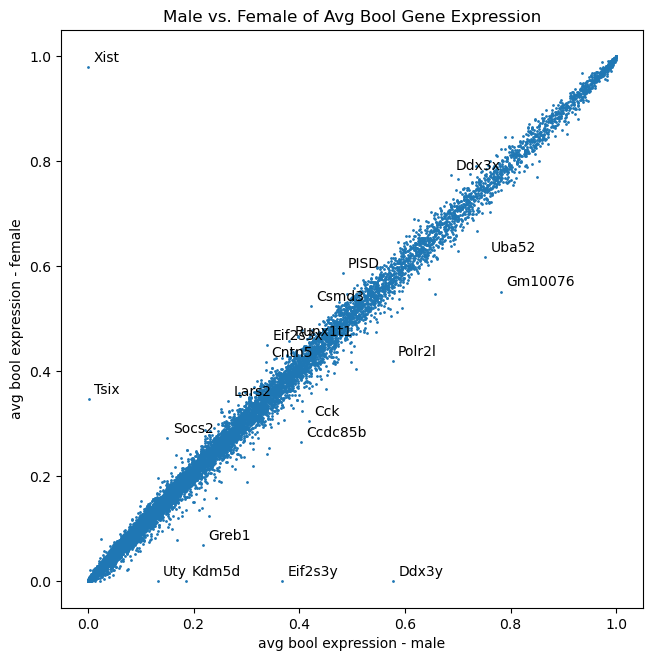

Total genes reduced from 27933 to 14843
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


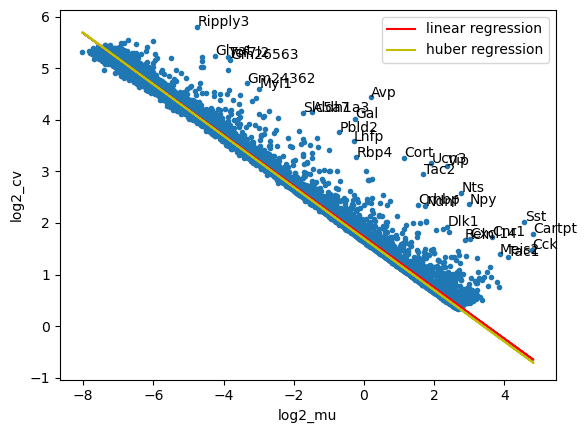

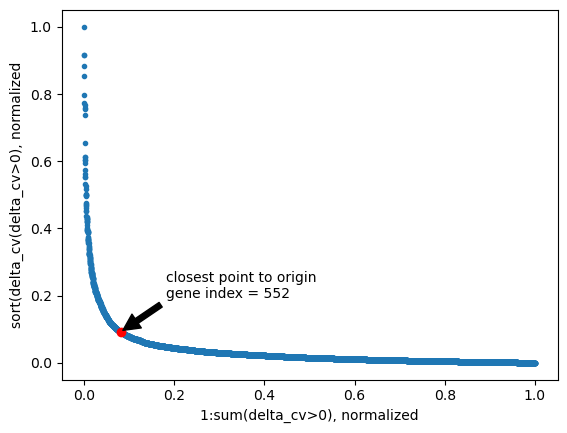

(552, 15039)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


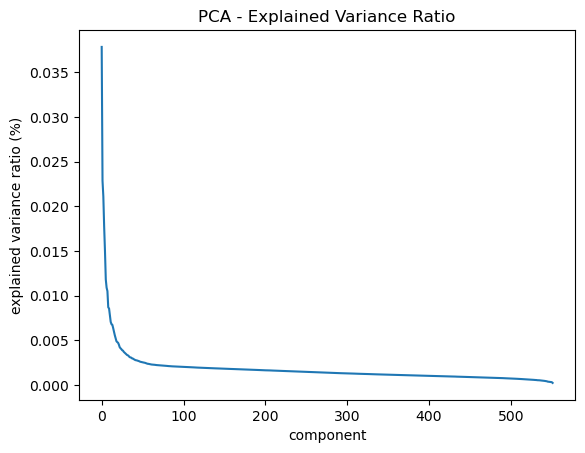

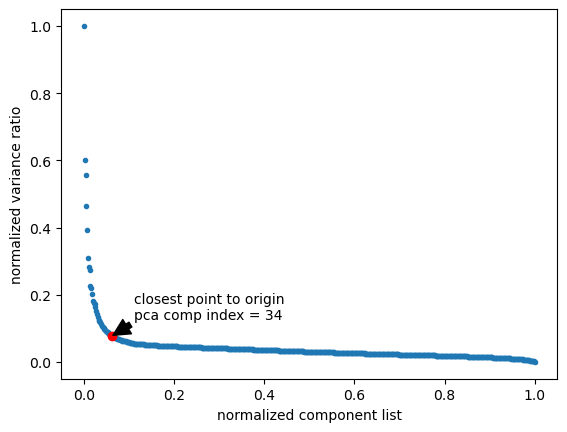

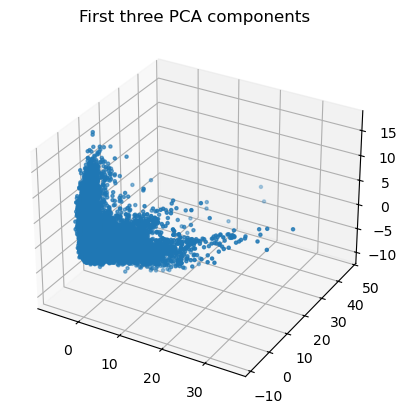

2024-12-11 09:11:02,531 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-11 09:11:03,903 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-11 09:11:03,947 - harmonypy - INFO - Iteration 1 of 20
2024-12-11 09:11:06,999 - harmonypy - INFO - Iteration 2 of 20
2024-12-11 09:11:10,057 - harmonypy - INFO - Iteration 3 of 20
2024-12-11 09:11:12,038 - harmonypy - INFO - Iteration 4 of 20
2024-12-11 09:11:13,351 - harmonypy - INFO - Iteration 5 of 20
2024-12-11 09:11:14,527 - harmonypy - INFO - Iteration 6 of 20
2024-12-11 09:11:15,570 - harmonypy - INFO - Iteration 7 of 20
2024-12-11 09:11:16,745 - harmonypy - INFO - Iteration 8 of 20
2024-12-11 09:11:17,787 - harmonypy - INFO - Iteration 9 of 20
2024-12-11 09:11:18,828 - harmonypy - INFO - Iteration 10 of 20
2024-12-11 09:11:19,866 - harmonypy - INFO - Iteration 11 of 20
2024-12-11 09:11:20,906 - harmonypy - INFO - Converged after 11 iterations


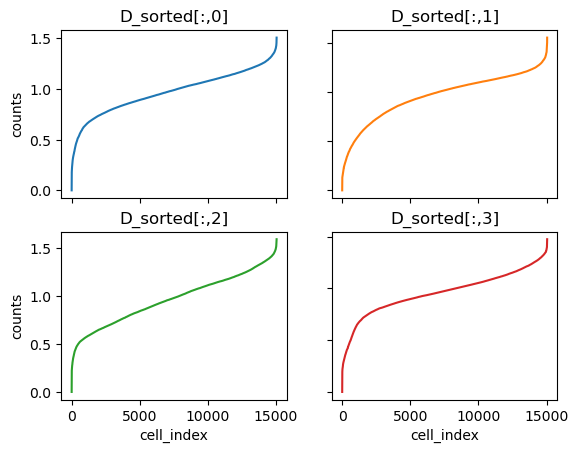

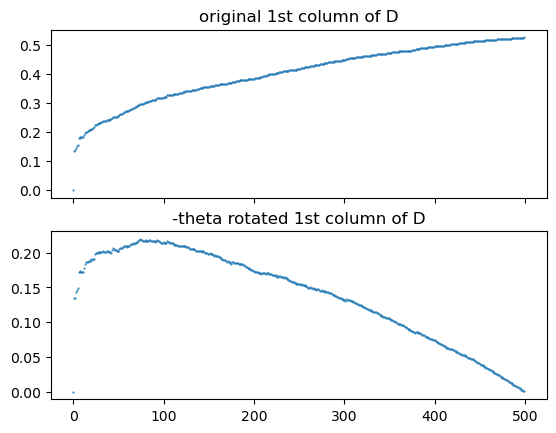

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 51.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


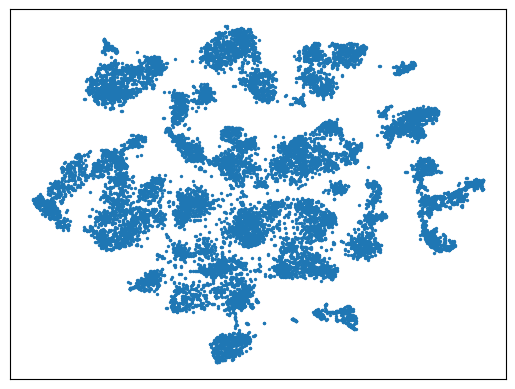

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.0629245489329984

running dbscan with epsilon: 1.0629245489329984  and minpts: 20
Estimated number of clusters: 74
Estimated number of noise points: 1525


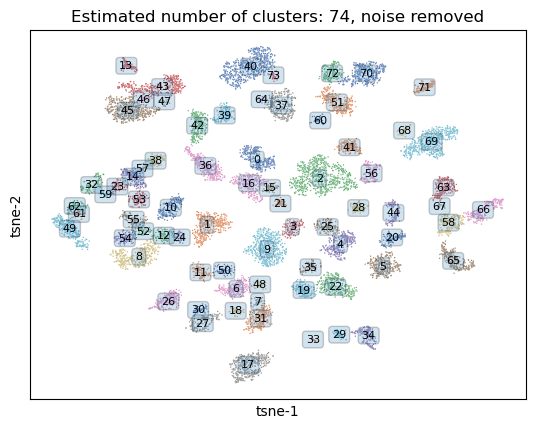

found existing cluster_labels in meta_data_df... removing old labels...
verify raw prelinkage df and raw metadata df have same columns:
[ True  True  True ...  True  True  True]


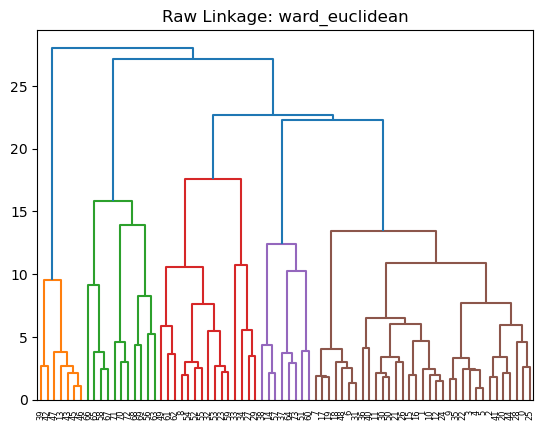

[13 45 46 43 47 42 39 33 34 29 27 32 59 23 53 52 55 54  8 49 61 62 18 31
  6 48 17 19  7 20 44 41  2  0 25 28 22  5  4  3  9 35 50 30 11 26 21 15
 16 10 12 24  1 40 36 64 73 37 51 60 38 57 14 72 70 71 68 69 56 63 67 58
 65 66]


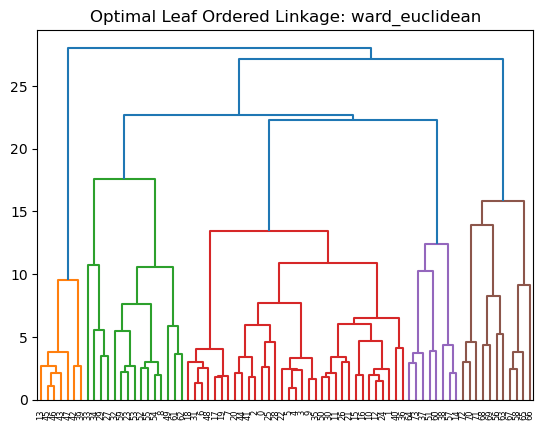

metadata df shape post inter cluster sort
(29, 13514)


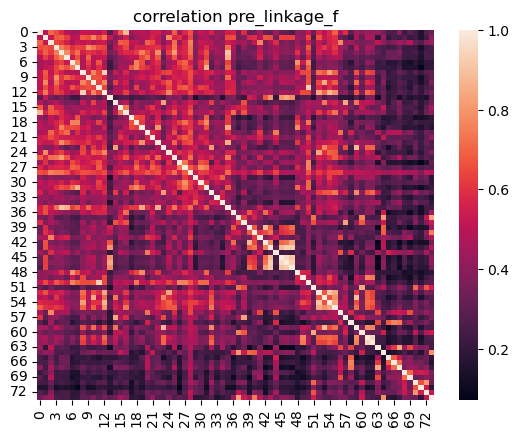

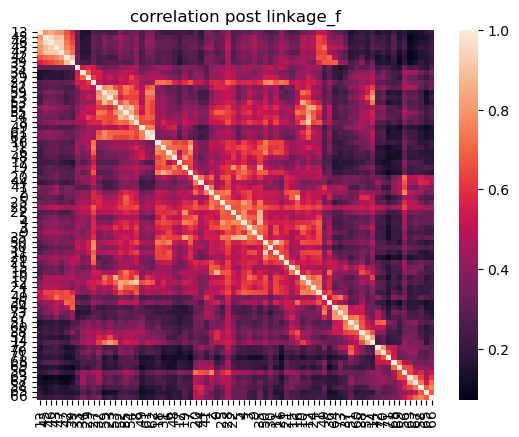

{13: 1, 45: 2, 46: 3, 43: 4, 47: 5, 42: 6, 39: 7, 33: 8, 34: 9, 29: 10, 27: 11, 32: 12, 59: 13, 23: 14, 53: 15, 52: 16, 55: 17, 54: 18, 8: 19, 49: 20, 61: 21, 62: 22, 18: 23, 31: 24, 6: 25, 48: 26, 17: 27, 19: 28, 7: 29, 20: 30, 44: 31, 41: 32, 2: 33, 0: 34, 25: 35, 28: 36, 22: 37, 5: 38, 4: 39, 3: 40, 9: 41, 35: 42, 50: 43, 30: 44, 11: 45, 26: 46, 21: 47, 15: 48, 16: 49, 10: 50, 12: 51, 24: 52, 1: 53, 40: 54, 36: 55, 64: 56, 73: 57, 37: 58, 51: 59, 60: 60, 38: 61, 57: 62, 14: 63, 72: 64, 70: 65, 71: 66, 68: 67, 69: 68, 56: 69, 63: 70, 67: 71, 58: 72, 65: 73, 66: 74}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51
 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 242
len marker_genes_sorted_final 242
column (gene) mean after standardization: 0.00
co

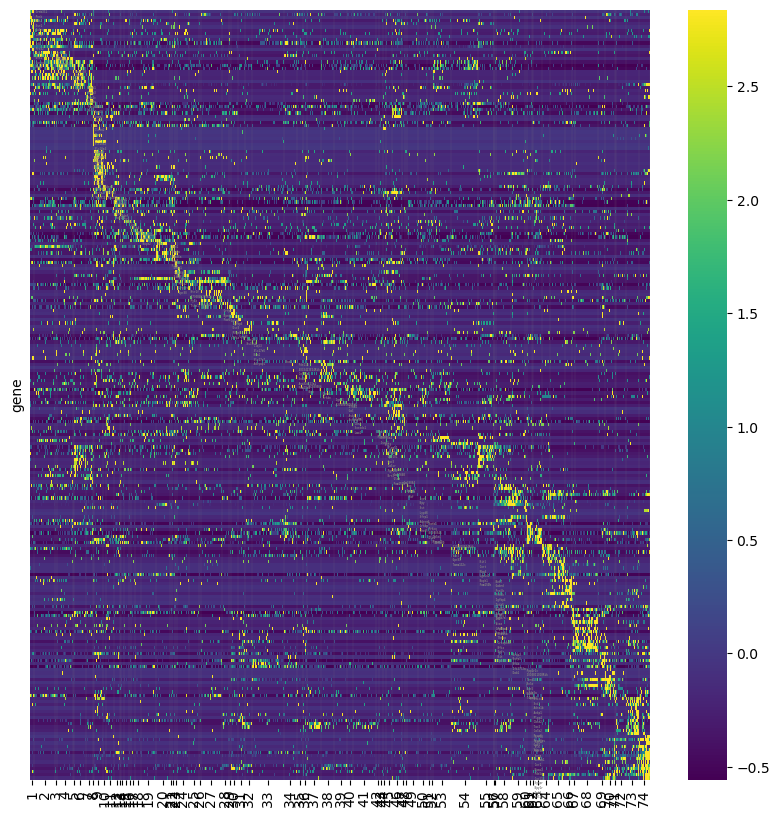

[ True  True  True ...  True  True  True]


In [176]:
%matplotlib inline
#process module
GABA_folder = '/bigdata/isaac/gaba_files/'
GABA_df_marker, GABA_arr_tsne, GABA_meta_data_df_plis, GABA_linkage_cluster_order, GABA_df_marker_log_and_std_col, GABA_df_plis, GABA_cluster_indices, GABA_df_marker_log_and_std, GABA_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, GABA_folder, 'GABA')


/tmp/ipykernel_3115776/2804453544.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(GABA_linkage_cluster_order, rotation = 90)


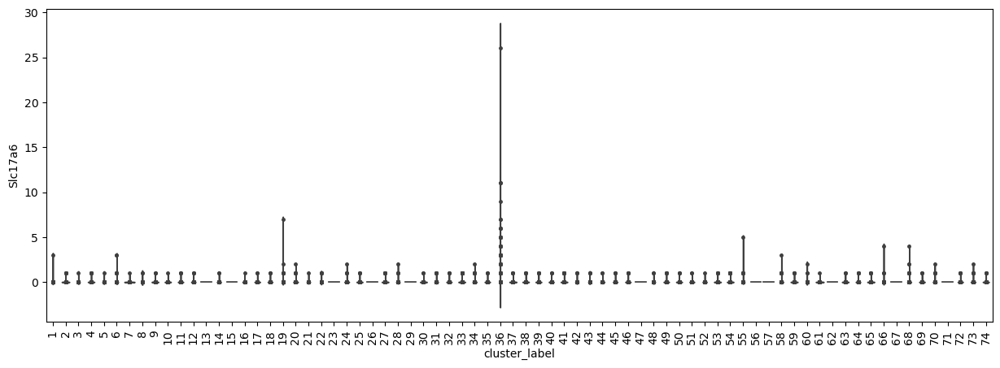

In [183]:
#check some specific expression of genes
gene = 'Slc17a6'
%matplotlib inline
fig,ax = plt.subplots(figsize = (15,5))
sns.violinplot(x=GABA_meta_data_df_plis.T['cluster_label'], y=GABA_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(GABA_linkage_cluster_order, rotation = 90)
plt.show()

## 2) Drop clusters, filter heatmap elements

In [459]:
#bring back chat/cluster 8
GABA_clusters_to_drop, GABA_thresh_cells = dp.drop_clusters(GABA_meta_data_df_plis, GABA_linkage_cluster_order, cluster_labels = [70,68,24,19,32,55,36,9,74,4,7,6,66],
                                                  cluster_keepers=[73,69,67,65,58,59,60,54,2,1,53,47,46,45,23,25,34,27,38,31,46,23,59,8],thresh_cells=140)

In [458]:
len([73,69,67,65,58,59,60,54,2,1,53,47,46,45,23,25,34,27,38,31,46,23,59])

23

In [460]:
len(GABA_linkage_cluster_order) - len(GABA_clusters_to_drop)

34

In [346]:
np.all(GABA_df_plis.columns== GABA_meta_data_df_plis.columns)

True

In [461]:

GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
GABA_df_marker_log_and_std_filtered, GABA_df_marker_log_and_std_col_filtered, GABA_meta_data_df_plis_filtered, GABA_pos_filtered_tmp, GABA_df_plis_filtered,GABA_linkage_cluster_order_filtered,GABA_linkage_cluster_order_filtered_tmp, GABA_change_indices_filtered, GABA_cluster_indices_filtered  = dp.filter_heatmap_elements(GABA_filtered_folder, 'GABA', GABA_clusters_to_drop,
                                                                                                                                                                                                                                        GABA_df_marker_log_and_std,
                                                                                                                                                                                                                                        GABA_meta_data_df_plis,
                                                                                                                                                                                                                                        GABA_df_plis,
                                                                                                                                                                                                                                        GABA_cluster_indices,
                                                                                                                                                                                                                                        GABA_linkage_cluster_order)

[ True  True  True ...  True  True  True]
[ True  True  True ...  True  True  True]
Indices where the value changes: [0, 106, 564, 588, 754, 1060, 1106, 1336, 1783, 1945, 2090, 2246, 2934, 3212, 3511, 3800, 4082, 4582, 4709, 4932, 4989, 5243, 5437, 5828, 6410, 6744, 7032, 7092, 7276, 7454, 7791, 7855, 8002, 8218, 8500]
change_indices_filtered [106, 564, 588, 754, 1060, 1106, 1336, 1783, 1945, 2090, 2246, 2934, 3212, 3511, 3800, 4082, 4582, 4709, 4932, 4989, 5243, 5437, 5828, 6410, 6744, 7032, 7092, 7276, 7454, 7791, 7855, 8002, 8218, 8500]
34
{1: 1, 2: 2, 8: 3, 11: 4, 20: 5, 23: 6, 25: 7, 27: 8, 28: 9, 30: 10, 31: 11, 33: 12, 34: 13, 37: 14, 38: 15, 39: 16, 41: 17, 45: 18, 46: 19, 47: 20, 49: 21, 50: 22, 53: 23, 54: 24, 58: 25, 59: 26, 60: 27, 63: 28, 64: 29, 65: 30, 67: 31, 69: 32, 72: 33, 73: 34}
[1 2 8 11 20 23 25 27 28 30 31 33 34 37 38 39 41 45 46 47 49 50 53 54 58
 59 60 63 64 65 67 69 72 73]


## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


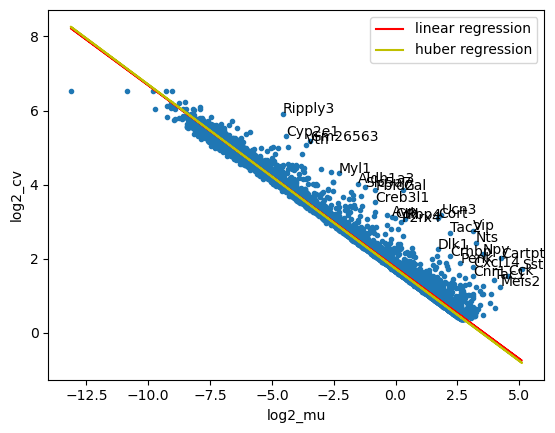

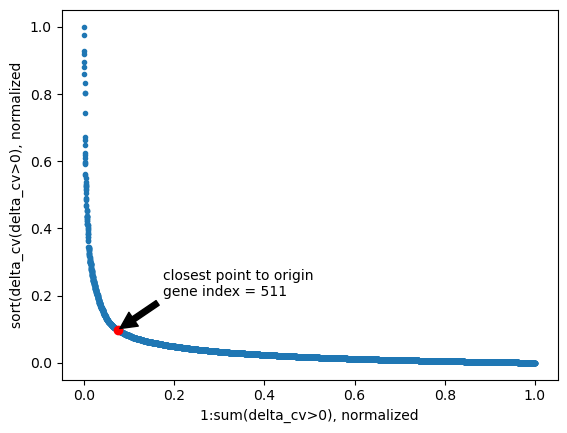

(511, 8501)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


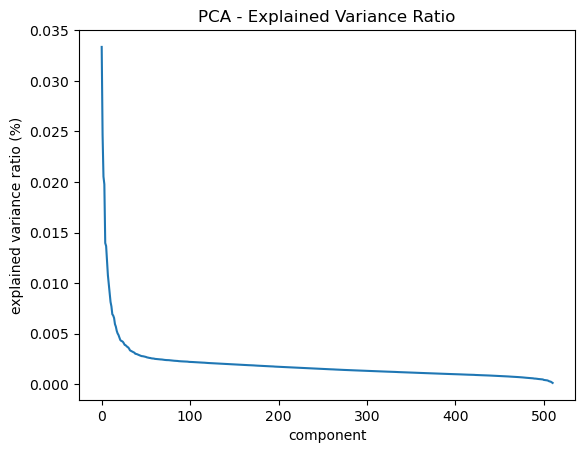

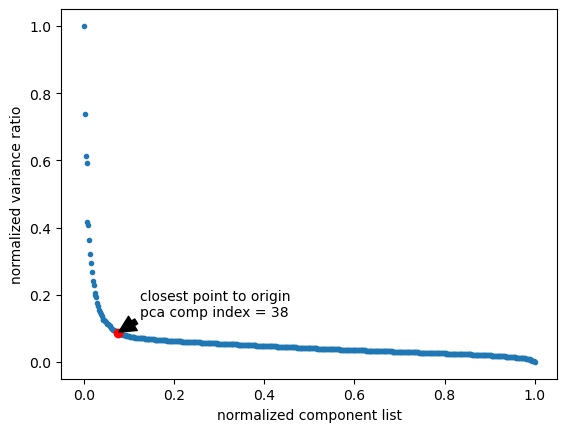

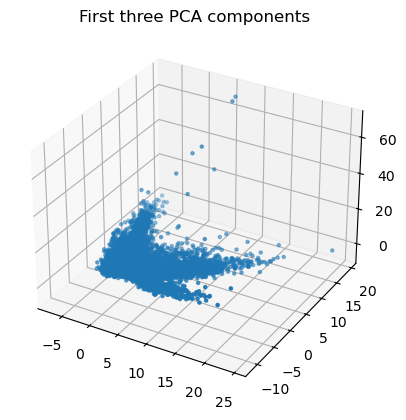

2024-12-15 11:33:15,851 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-15 11:33:16,754 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-15 11:33:16,786 - harmonypy - INFO - Iteration 1 of 20
2024-12-15 11:33:19,030 - harmonypy - INFO - Iteration 2 of 20
2024-12-15 11:33:20,916 - harmonypy - INFO - Iteration 3 of 20
2024-12-15 11:33:22,114 - harmonypy - INFO - Iteration 4 of 20
2024-12-15 11:33:23,110 - harmonypy - INFO - Iteration 5 of 20
2024-12-15 11:33:23,912 - harmonypy - INFO - Iteration 6 of 20
2024-12-15 11:33:24,815 - harmonypy - INFO - Iteration 7 of 20
2024-12-15 11:33:25,719 - harmonypy - INFO - Iteration 8 of 20
2024-12-15 11:33:26,730 - harmonypy - INFO - Converged after 8 iterations


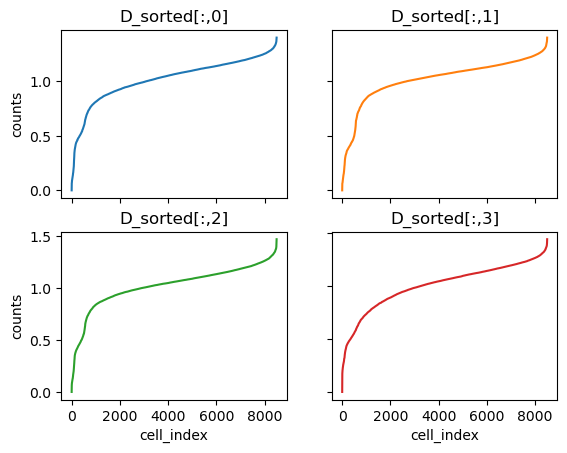

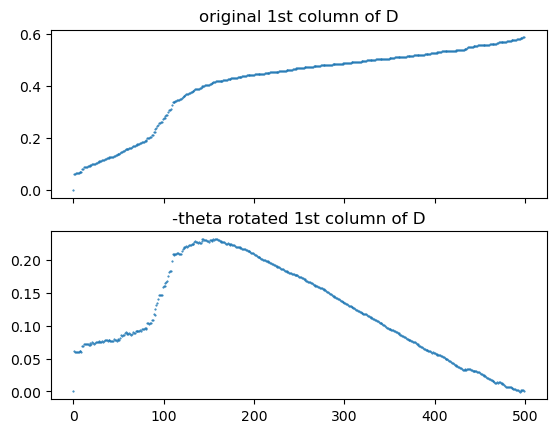

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 52.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


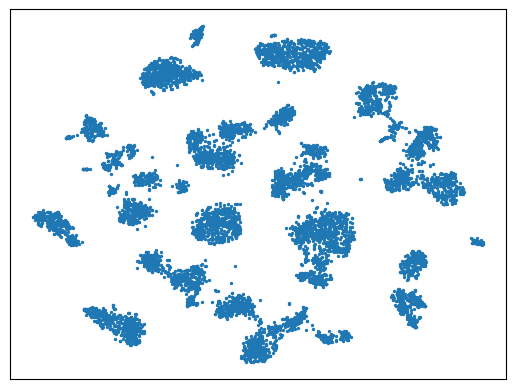

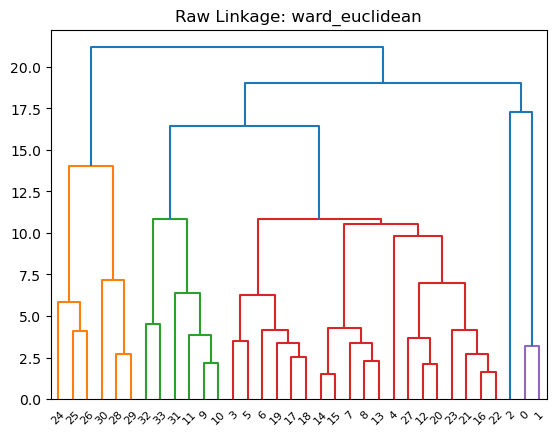

[24 25 26 29 28 30 33 32 11  9 10 31  6 18 17 19  3  5  7  8 13 15 14 23
 16 22 21 20 12 27  4  0  1  2]


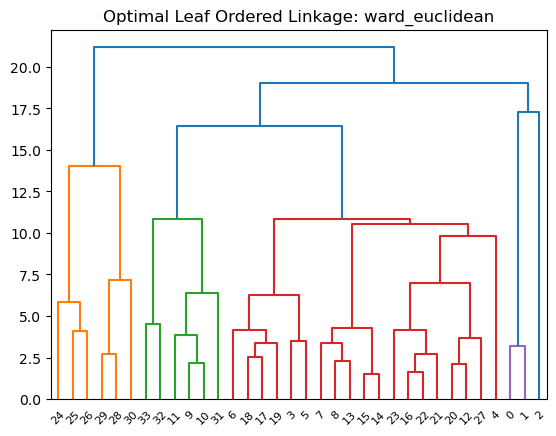

metadata df shape post inter cluster sort
(29, 8501)


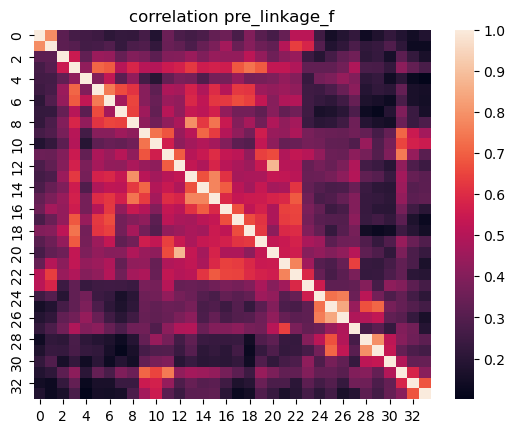

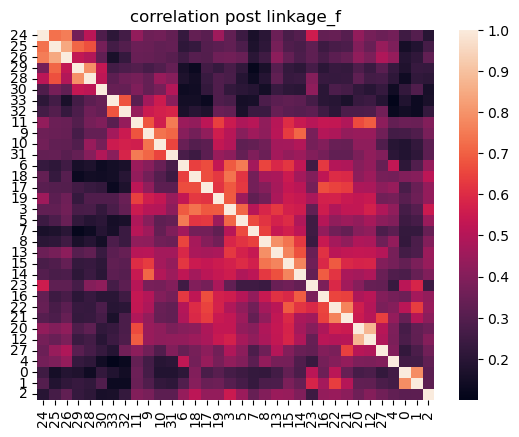

{25: 1, 26: 2, 27: 3, 30: 4, 29: 5, 31: 6, 34: 7, 33: 8, 12: 9, 10: 10, 11: 11, 32: 12, 7: 13, 19: 14, 18: 15, 20: 16, 4: 17, 6: 18, 8: 19, 9: 20, 14: 21, 16: 22, 15: 23, 24: 24, 17: 25, 23: 26, 22: 27, 21: 28, 13: 29, 28: 30, 5: 31, 1: 32, 2: 33, 3: 34}
[1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34]
len marker_Genes_sorted 172
len marker_genes_sorted_final 172
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 334, 622, 682, 1019, 1197, 1261, 1544, 1760, 2448, 2593, 2749, 2896, 3126, 3349, 3476, 3533, 3699, 3745, 4192, 4354, 4653, 4935, 5224, 5806, 6306, 6697, 6891, 7145, 7423, 7607, 7913, 8019, 8477, 8500]
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33]
32
[array([  1,   2,   4, 140]), array([9, 7]), array([  0,   3, 113, 146,  92,  11,   5,  13,  10,   8]), array([15, 18, 16, 17, 24,

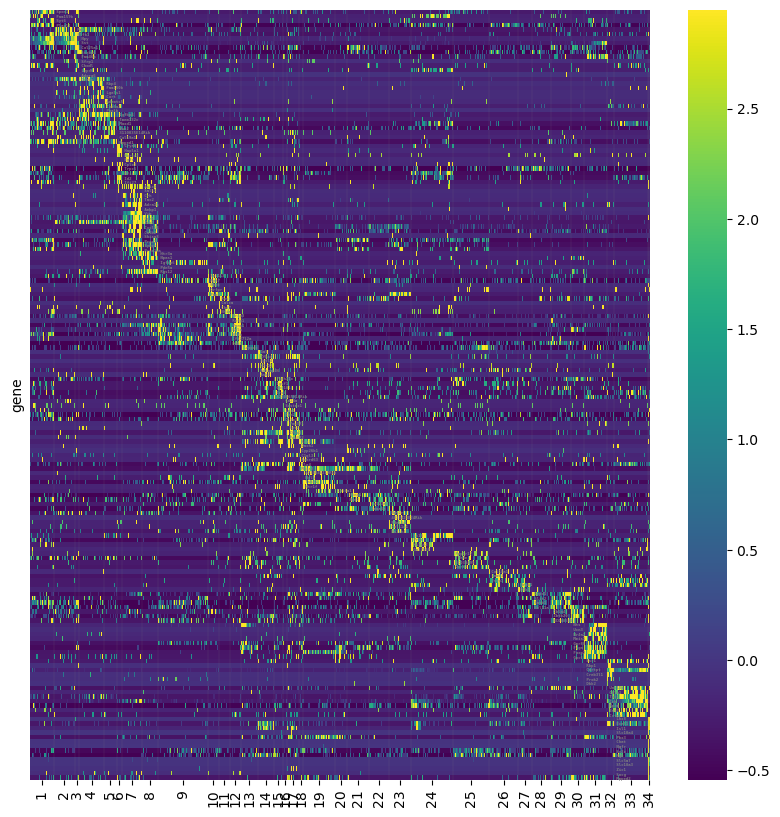

writing to file


In [463]:
GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
cell_class = 'GABA'
%matplotlib inline
GABA_df_marker_f, GABA_arr_tsne_f, GABA_meta_data_df_plis_f, GABA_meta_data_df_pca, GABA_mgs_f, GABA_ind_f, GABA_ind_s_f, GABA_df_marker_log_and_std_col_f, GABA_pos_f, GABA_linkage_cluster_order_filtered, GABA_change_indices_f = dp_rc.reprocess(GABA_df_ge,GABA_meta_data_df_plis_filtered,GABA_linkage_cluster_order_filtered,GABA_cluster_indices_filtered,GABA_filtered_folder,cell_class, sort = True, write_to_file=True)
 

In [189]:
GABA_meta_data_df_plis_filtered.loc[:,GABA_meta_data_df_plis_filtered.loc['cluster_label',:]==24].shape[1]

79

/tmp/ipykernel_3115776/1541622088.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(GABA_linkage_cluster_order_filtered, rotation = 90)


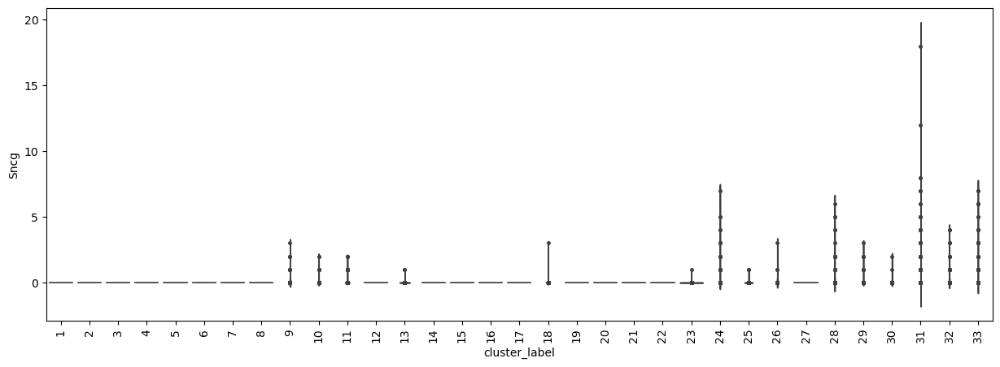

In [373]:
#check some specific expression of genes
gene = 'Sncg'
%matplotlib inline
fig,ax = plt.subplots(figsize = (15,5))
sns.violinplot(x=GABA_meta_data_df_plis_filtered.T['cluster_label'], y=GABA_df_plis_filtered.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(GABA_linkage_cluster_order_filtered, rotation = 90)
plt.show()

In [374]:
np.all(GABA_df_marker_f.columns == GABA_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [464]:
GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
GABA_labels = dp.get_cluster_labels(GABA_filtered_folder, 'GABA_filtered_labels_rc.csv')
GABA_labels

['Sst-Npy-Spon1',
 'Sst-Npy-Maf',
 'Sst-Npy-Chodl',
 'Moxd1-Pvalb',
 'Moxd1-Vwc2',
 'Hapln1-Cryab',
 'Vip-Crh',
 'Htr3a-Rgs12',
 'Dab1-Myh7',
 'Pax6-Npnt',
 'Pax6-Calca',
 'Sncg-Reln',
 'Fign-Lrpprc',
 'Isl1-Gal',
 'Igsf1-Zfhx3',
 'Lmo1-Chn2',
 'Isl1-Pou3f2',
 'Meis2-Dach1',
 'Meis2-Tshz1',
 'Meis2-Foxp2',
 'Meis2-Nwd2',
 'Col23a1-Hs3st4',
 'Pde11a-Npy2r',
 'Prlr-St18',
 'Oprk1-Trhde',
 'Col18a1-Jsrp1',
 'Greb1-Dlk1',
 'Lypd1-Satb1',
 'Lpyd1-Unc13c',
 'Cbln4-Zbtb20',
 'Fign-Foxp2',
 'Cartpt-Dkk2',
 'Cartpt-Unc13c',
 'Chat-Slc5a7']

### add label markers to plis filtered metadata

In [465]:
GABA_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(GABA_filtered_folder, 
                                                                         GABA_meta_data_df_plis_f,
                                                                         GABA_linkage_cluster_order_filtered,
                                                                         GABA_labels,
                                                                         'GABA',
                                                                        write_to_file = True)

In [466]:
GABA_meta_data_df_plis_f_markers.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
lengthbp_seqlib,507.0,440.0,440.0,507.0,474.0,466.0,474.0,416.0,486.0,415.0,...,476.0,474.0,440.0,478.0,460.0,461.0,460.0,461.0,487.0,440.0
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,H8,A2,E12,G1,F9,G8,F9,G8,B2,E12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
cluster_label,1,1,1,1,1,1,1,1,1,1,...,34,34,34,34,34,34,34,34,34,34
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7


### updated heatmap

[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33]
32
[array([  1,   2,   4, 140]), array([9, 7]), array([  0,   3, 113, 146,  92,  11,   5,  13,  10,   8]), array([15, 18, 16, 17, 24, 19, 14]), array([20, 23, 25, 26, 21, 22,  6]), array([ 28,  27,  31,  30,  29, 147, 127,  50,  49]), array([ 44,  35,  34,  37,  36,  33,  32,  38,  39, 118,  63,  60, 112,
        57, 110]), array([40, 43, 46, 41, 42]), array([56, 52, 53, 54, 55]), array([116,  59,  62,  61]), array([64, 67, 68, 65, 51, 45, 48]), array([71]), array([ 78,  82,  77,  81, 138,  79]), array([88, 86, 85, 87, 72]), array([90, 91, 89, 93, 94]), array([95, 97, 83, 12]), array([ 73,  98,  99, 100, 101,  75,  76]), array([102,  47, 104, 103]), array([106]), array([109, 111]), array([114, 119]), array([123, 120, 121, 122, 115]), array([124, 128, 126, 125]), array([129, 132, 131, 130]), array([135, 117, 136]), array([137, 141]), array([144, 149, 145, 150]), array(

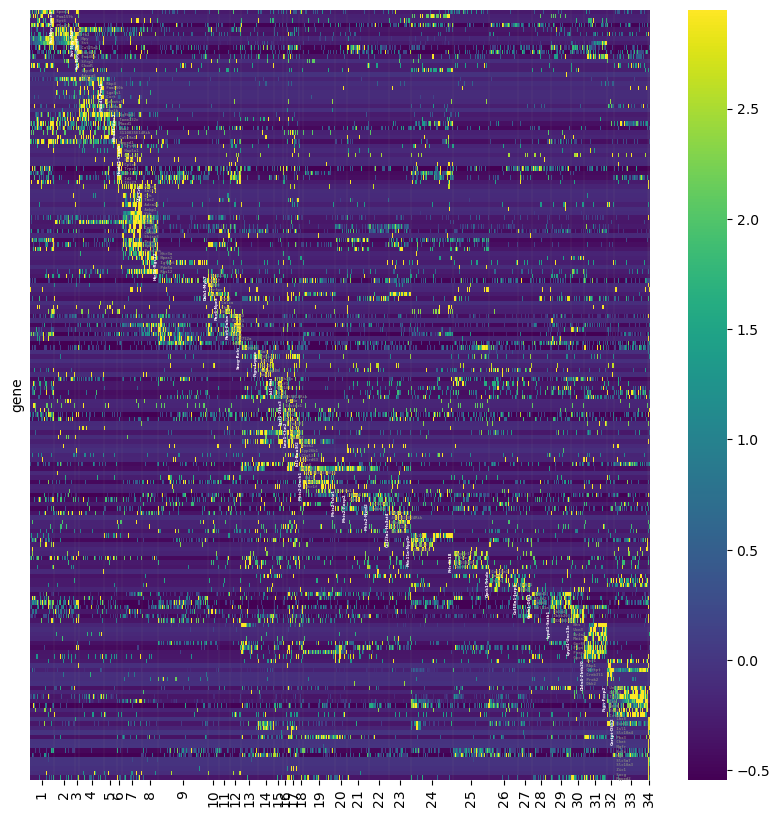

In [467]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
GABA_tg_f, GABA_tgfs_f = dp.get_heatmap_labels(GABA_mgs_f, GABA_ind_f, GABA_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(GABA_df_marker_log_and_std_col_f, 
                       GABA_pos_f, 
                       GABA_linkage_cluster_order_filtered, 
                       GABA_change_indices_f, 
                       GABA_tg_f, 
                       GABA_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       GABA_filtered_folder,
                       fs_waterfall = 2.9,
                       cluster_labels = GABA_labels,
                       savefig = True,
                       cell_class = 'GABA_filtered_tg_reenrich_labeled')


## 5) Updated TSNE Plot

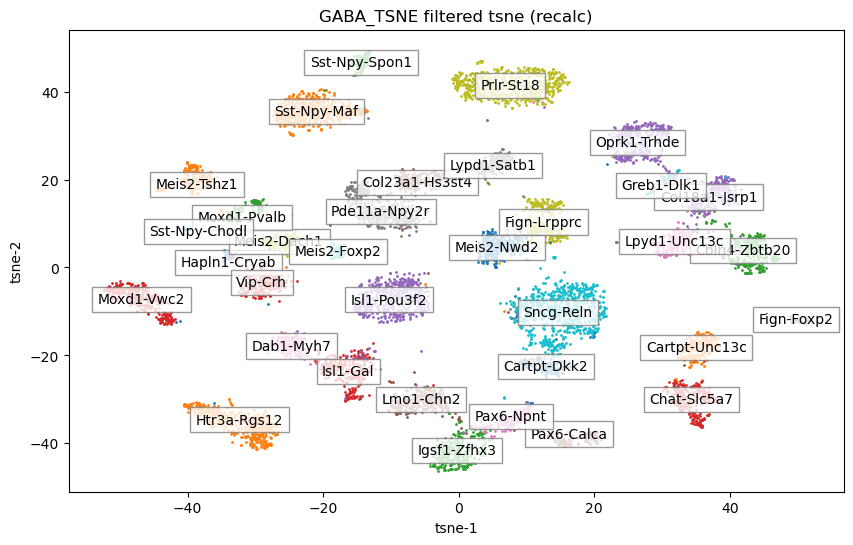

In [468]:
GABA_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(GABA_filtered_folder, GABA_meta_data_df_plis_filtered, GABA_linkage_cluster_order_filtered, GABA_labels, 'GABA_TSNE', write_to_file = True)
dp.plot_rc_tsne(GABA_meta_data_df_plis_filtered_tsne,GABA_arr_tsne_f,'GABA_TSNE', GABA_filtered_folder,savefig=True)


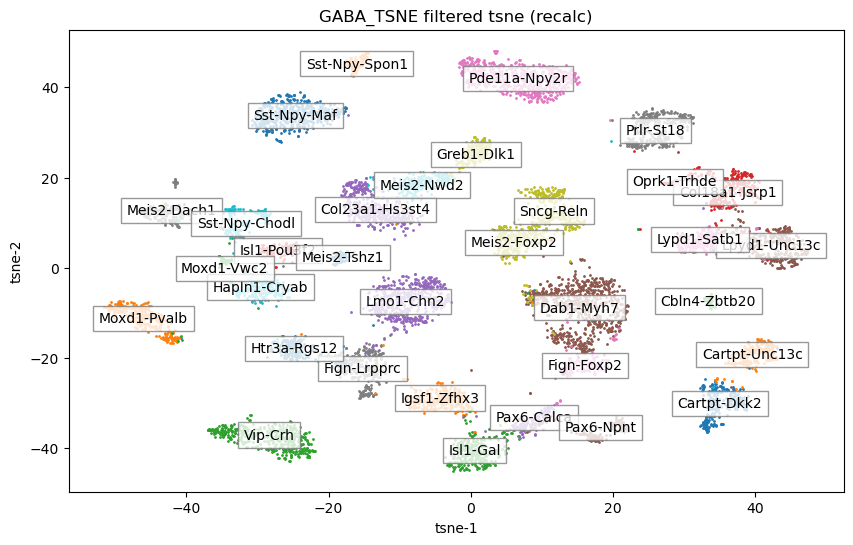

In [438]:
GABA_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(GABA_filtered_folder, GABA_meta_data_df_plis_filtered, GABA_linkage_cluster_order_filtered, GABA_labels, 'GABA_TSNE', write_to_file = True)
dp.plot_rc_tsne(GABA_meta_data_df_plis_filtered_tsne,GABA_arr_tsne_f,'GABA_TSNE', GABA_filtered_folder,savefig=True)


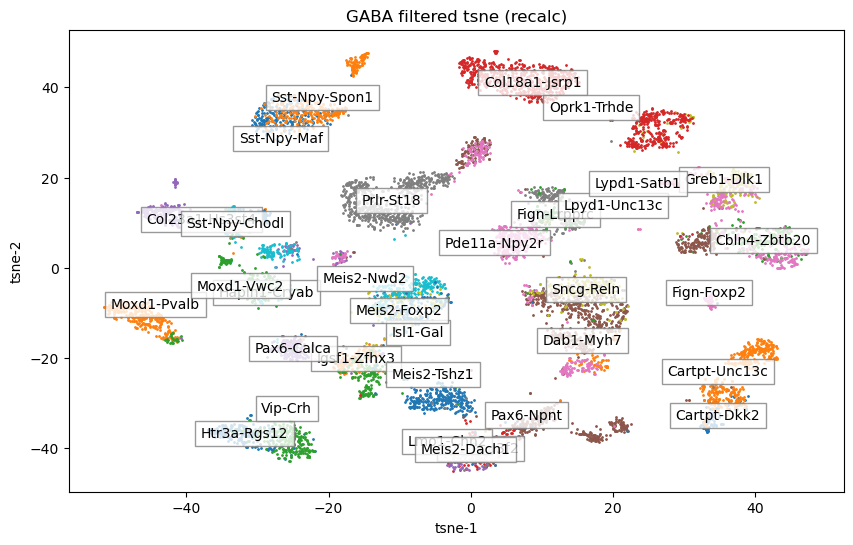

In [377]:
dp.plot_rc_tsne(GABA_meta_data_df_plis_f_markers,GABA_arr_tsne_f,cell_class, GABA_filtered_folder,savefig=False)

 

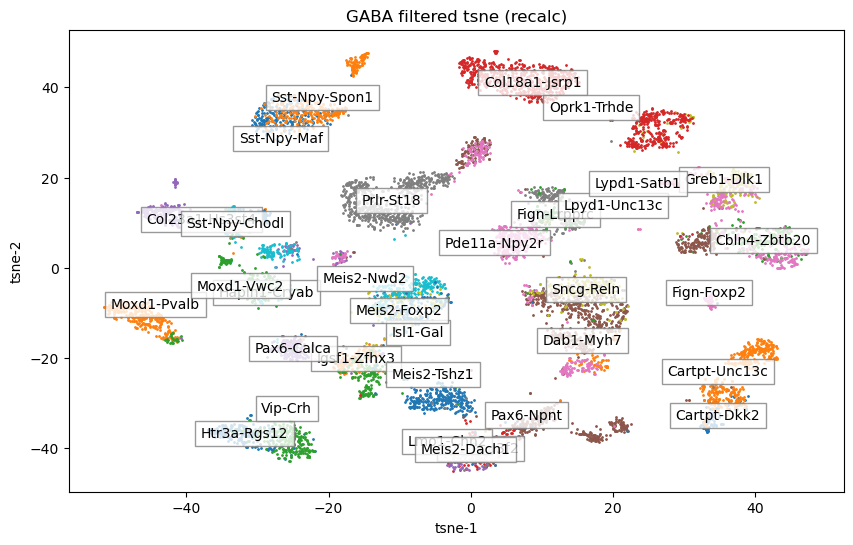

In [209]:
dp.plot_rc_tsne(GABA_meta_data_df_plis_filtered_markers,GABA_arr_tsne_f,cell_class, GABA_filtered_folder,savefig=True)

 

In [337]:
np.all(GABA_df_marker_f.columns == GABA_meta_data_df_plis_filtered_markers.columns)

True

### 6) Violin Plots using scanpy's stacked violin wrapper

In [469]:
GABA_adata_f = ad.AnnData(GABA_df_marker_f.T)
#add aligned metadata
for x in GABA_meta_data_df_plis_f_markers.index:
    GABA_adata_f.obs[str(x)] = GABA_meta_data_df_plis_f_markers.loc[str(x),:]

GABA_markers = GABA_adata_f.obs['markers']
_, idx = np.unique(GABA_adata_f.obs['markers'], return_index=True)
GABA_markers = list(GABA_markers[np.sort(idx)])

/tmp/ipykernel_3115776/710482852.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  GABA_markers = list(GABA_markers[np.sort(idx)])


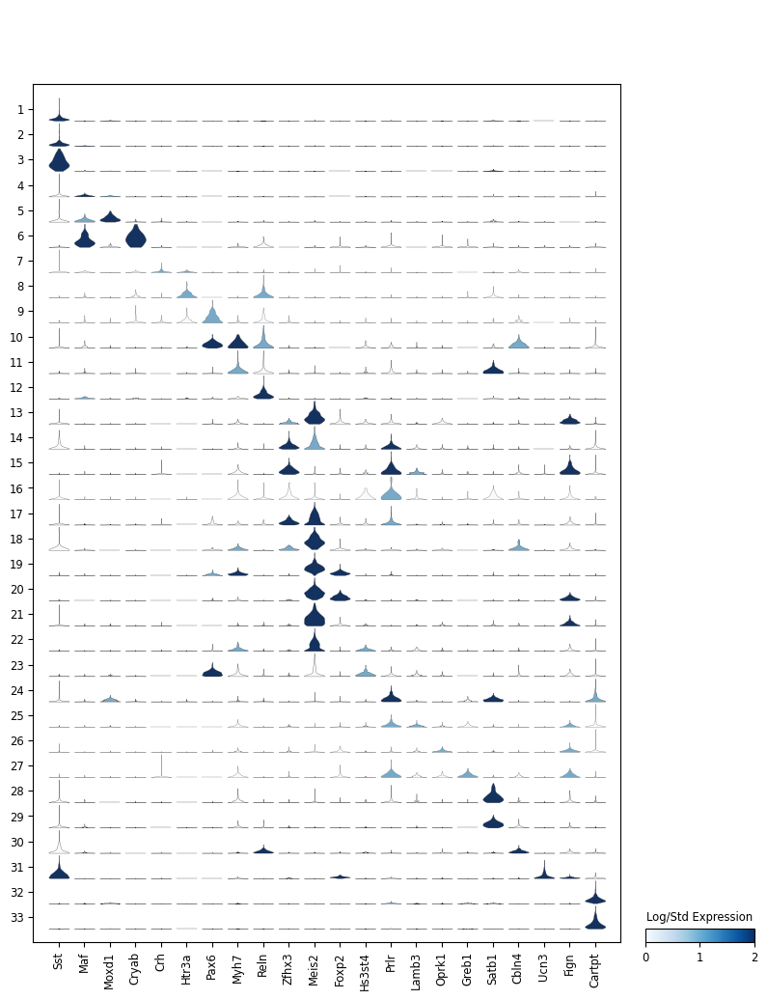

In [ ]:
gaba_violin_markers = ['Sst','Maf','Moxd1','Cryab','Crh','Htr3a','Pax6','Myh7','Reln','Zfhx3','Meis2','Foxp2','Hs3st4','Prlr','Lamb3','Oprk1','Greb1','Satb1','Cbln4','Ucn3','Fign','Cartpt']


sc.settings.figdir = "/bigdata/isaac/gaba_files/filtered"
%matplotlib inline
#save = 'gaba_violin.pdf')
#for using markers as category labels:
#groupby='markers', categories_order= GABA_markers
sc.pl.stacked_violin(GABA_adata_f, gaba_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width', save = 'gaba_violin_clabels.pdf')

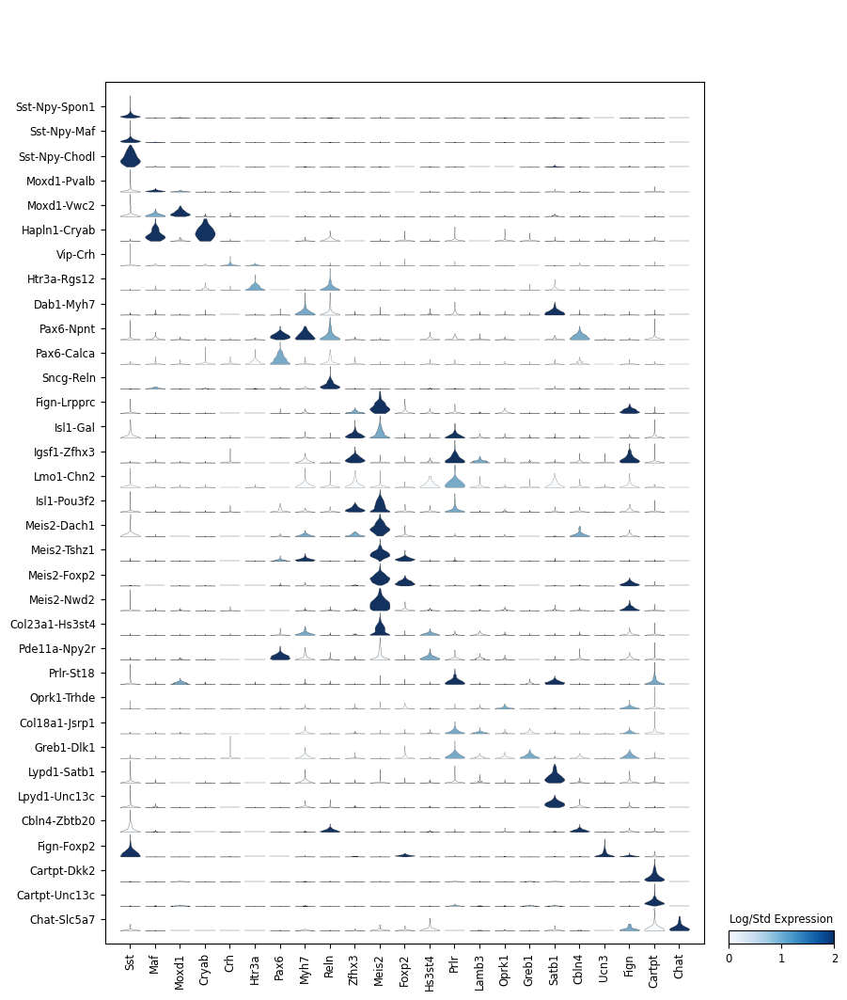

In [470]:
gaba_violin_markers = ['Sst','Maf','Moxd1','Cryab','Crh','Htr3a','Pax6','Myh7','Reln','Zfhx3','Meis2','Foxp2','Hs3st4','Prlr','Lamb3','Oprk1','Greb1','Satb1','Cbln4','Ucn3','Fign','Cartpt','Chat']


sc.settings.figdir = "/bigdata/isaac/gaba_files/filtered"
%matplotlib inline
#save = 'gaba_violin.pdf')
#for using markers as category labels:
#groupby='markers', categories_order= GABA_markers
sc.pl.stacked_violin(GABA_adata_f, gaba_violin_markers, groupby='markers', categories_order= GABA_markers, colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width', save = 'gaba_violin_markers.pdf')

## Vglut1 Analysis <a name="vglut1_analysis"></a>

In [1230]:
today

'2024-12-09'

## 1) process (L2)

num m cells: 5485 num f cells: 5802


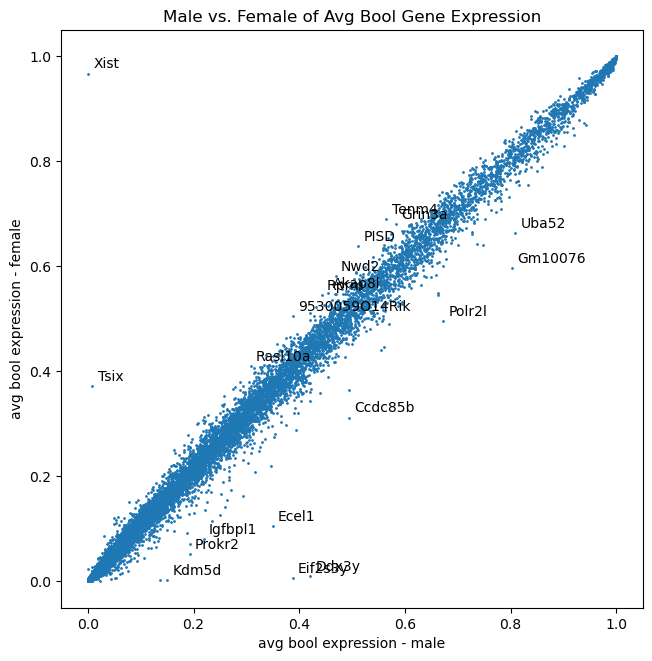

Total genes reduced from 27933 to 14208
removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


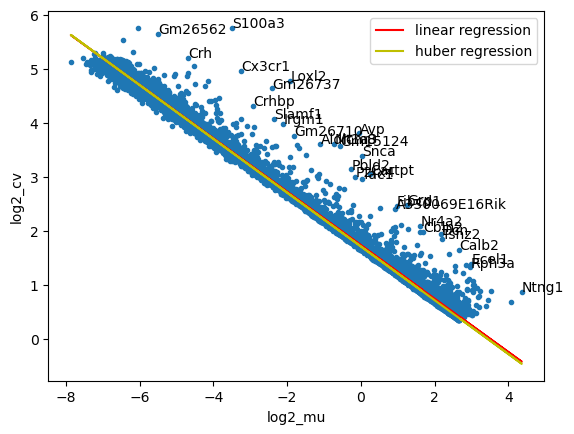

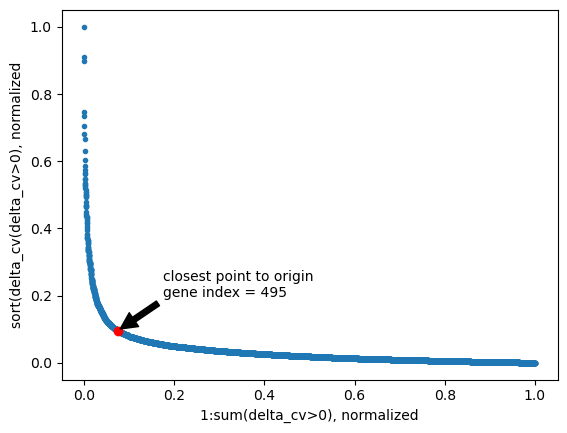

(495, 11287)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


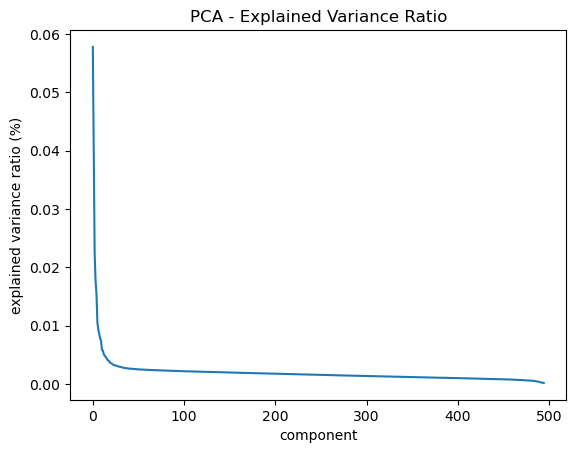

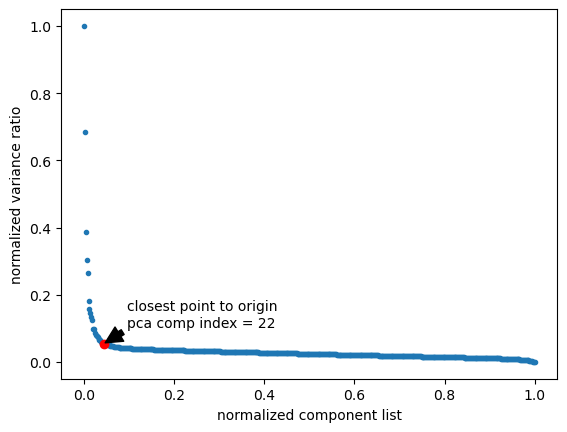

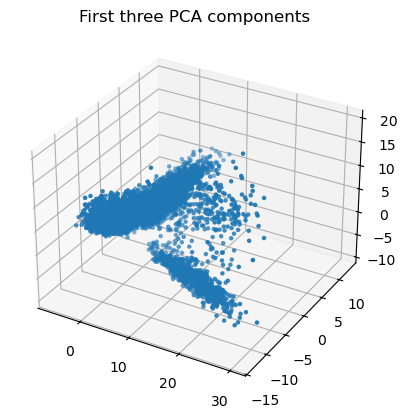

2024-12-10 08:00:55,240 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-10 08:00:56,515 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-10 08:00:56,565 - harmonypy - INFO - Iteration 1 of 20
2024-12-10 08:00:59,177 - harmonypy - INFO - Iteration 2 of 20
2024-12-10 08:01:01,588 - harmonypy - INFO - Iteration 3 of 20
2024-12-10 08:01:03,982 - harmonypy - INFO - Iteration 4 of 20
2024-12-10 08:01:05,871 - harmonypy - INFO - Iteration 5 of 20
2024-12-10 08:01:07,184 - harmonypy - INFO - Iteration 6 of 20
2024-12-10 08:01:08,289 - harmonypy - INFO - Iteration 7 of 20
2024-12-10 08:01:09,397 - harmonypy - INFO - Iteration 8 of 20
2024-12-10 08:01:10,432 - harmonypy - INFO - Iteration 9 of 20
2024-12-10 08:01:11,431 - harmonypy - INFO - Converged after 9 iterations


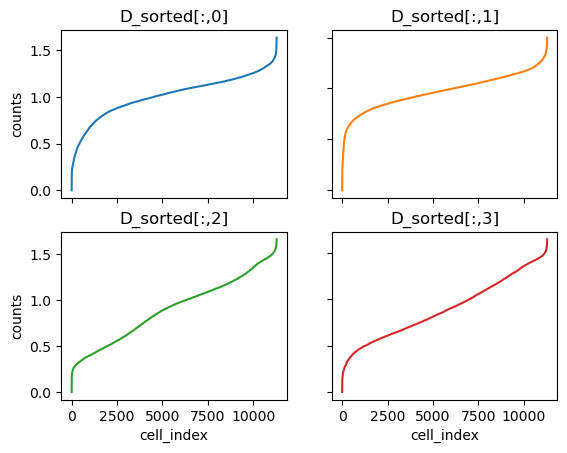

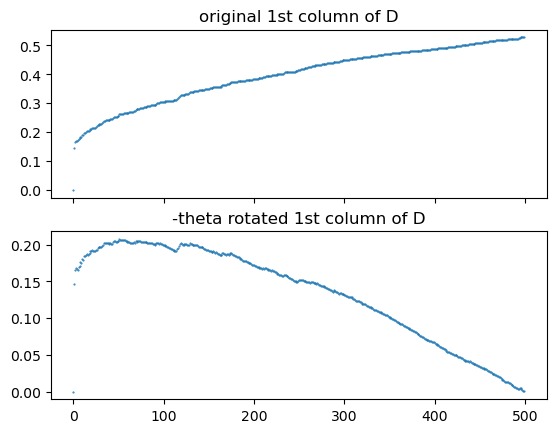

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 55.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


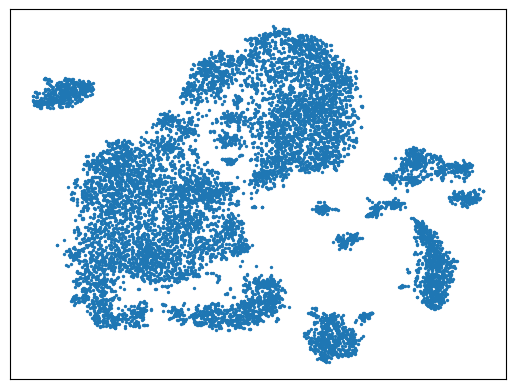

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.2907811452216365

running dbscan with epsilon: 1.2907811452216365  and minpts: 20
Estimated number of clusters: 31
Estimated number of noise points: 982


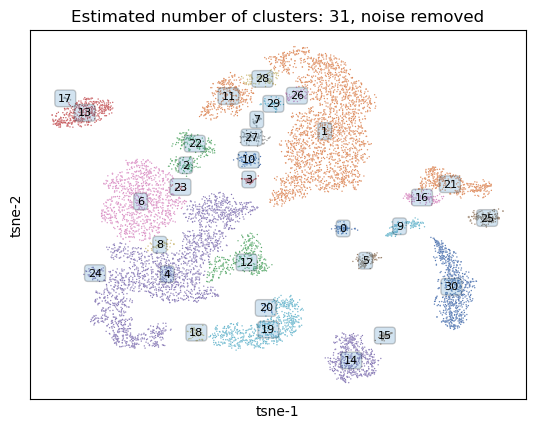

found existing cluster_labels in meta_data_df... removing old labels...
verify raw prelinkage df and raw metadata df have same columns:
[ True  True  True ...  True  True  True]


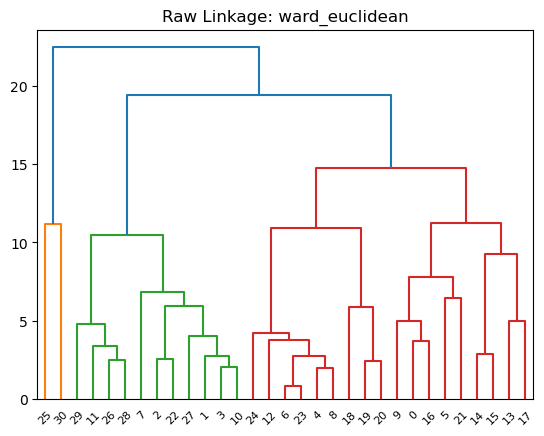

[25 30  5 21  0 16  9 15 14 13 17 12  4  8  6 23 24 18 19 20  7 10  3  1
 27 22  2 26 28 11 29]


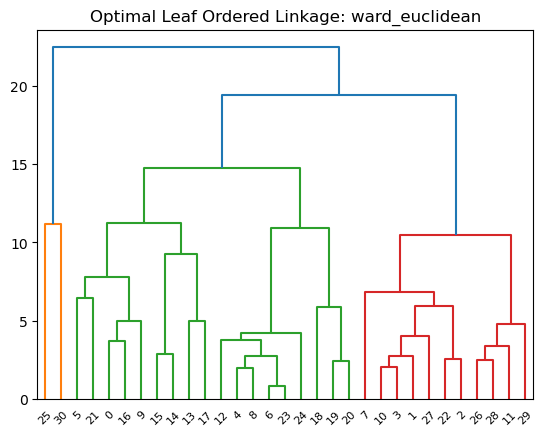

metadata df shape post inter cluster sort
(29, 10305)


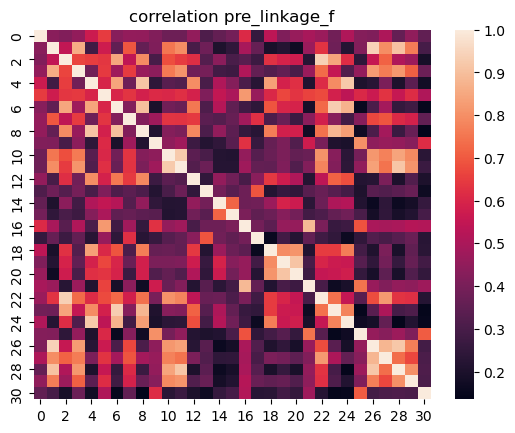

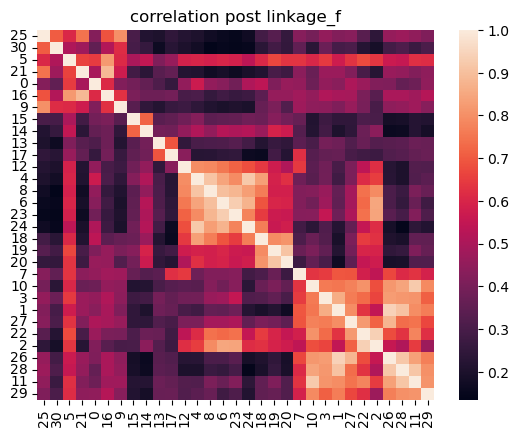

{25: 1, 30: 2, 5: 3, 21: 4, 0: 5, 16: 6, 9: 7, 15: 8, 14: 9, 13: 10, 17: 11, 12: 12, 4: 13, 8: 14, 6: 15, 23: 16, 24: 17, 18: 18, 19: 19, 20: 20, 7: 21, 10: 22, 3: 23, 1: 24, 27: 25, 22: 26, 2: 27, 26: 28, 28: 29, 11: 30, 29: 31}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 143
len marker_genes_sorted_final 143
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 150, 905, 1015, 1399, 1473, 1604, 1760, 1822, 2347, 2780, 2797, 3121, 5217, 5264, 6239, 6260, 6305, 6354, 7027, 7047, 7085, 7164, 7218, 9427, 9508, 9671, 9768, 9821, 9919, 10258, 10304]
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 22, 24, 27, 28, 29, 30]
25
[array([  0,   1,  31,  27,  30,   2,  38,  32, 129, 128, 142, 138, 136,
         5,   4,   3]), array([  9,  

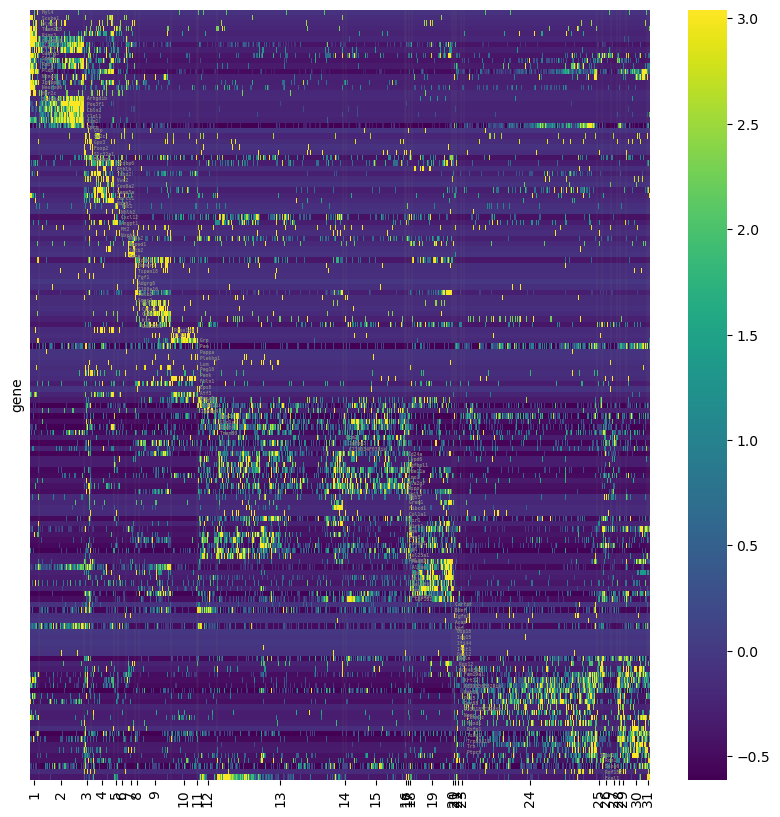

[ True  True  True ...  True  True  True]


In [9]:
%matplotlib inline
#try new process module
Vglut1_folder = '/bigdata/isaac/Vglut1_files/'
Vglut1_df_marker, Vglut1_arr_tsne, Vglut1_meta_data_df_plis, Vglut1_linkage_cluster_order, Vglut1_df_marker_log_and_std_col, Vglut1_df_plis, Vglut1_cluster_indices, Vglut1_df_marker_log_and_std, Vglut1_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, Vglut1_folder, 'Vglut1')

/tmp/ipykernel_2795435/404408618.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut1_linkage_cluster_order, rotation = 90)


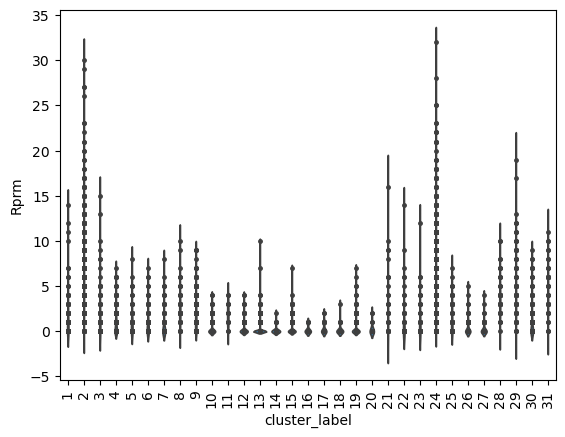

In [1231]:
#check some specific expression of genes
gene = 'Rprm'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut1_meta_data_df_plis.T['cluster_label'], y=Vglut1_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut1_linkage_cluster_order, rotation = 90)
plt.show()

In [347]:
np.all(Vglut1_df_plis.columns== Vglut1_meta_data_df_plis.columns)

True

## 2) Drop clusters, filter heatmap elements

In [10]:
Vglut1_clusters_to_drop, Vglut1_thresh_cells = dp.drop_clusters(Vglut1_meta_data_df_plis, Vglut1_linkage_cluster_order, cluster_labels=[26], thresh_cells=140)
Vglut1_clusters_to_drop

[3, 5, 6, 8, 11, 14, 16, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 29, 31]

In [348]:
Vglut1_filtered_folder = '/bigdata/isaac/Vglut1_files/filtered/'
Vglut1_df_marker_log_and_std_filtered, Vglut1_df_marker_log_and_std_col_filtered, Vglut1_meta_data_df_plis_filtered, Vglut1_pos_filtered_tmp, Vglut1_df_plis_filtered,Vglut1_linkage_cluster_order_filtered,Vglut1_linkage_cluster_order_filtered_tmp, Vglut1_change_indices_filtered, Vglut1_cluster_indices_filtered  = dp.filter_heatmap_elements(Vglut1_filtered_folder, 'Vglut1', Vglut1_clusters_to_drop,
                                                                                                                                                                                                                                        Vglut1_df_marker_log_and_std,
                                                                                                                                                                                                                                        Vglut1_meta_data_df_plis,
                                                                                                                                                                                                                                        Vglut1_df_plis,
                                                                                                                                                                                                                                        Vglut1_cluster_indices,
                                                                                                                                                                                                                                        Vglut1_linkage_cluster_order)


[ True  True  True ...  True  True  True]
[ True  True  True ...  True  True  True]
Indices where the value changes: [0, 150, 905, 1289, 1445, 1970, 2403, 2727, 4823, 5798, 6471, 8680, 9018]
change_indices_filtered [150, 905, 1289, 1445, 1970, 2403, 2727, 4823, 5798, 6471, 8680, 9018]
12
{1: 1, 2: 2, 4: 3, 7: 4, 9: 5, 10: 6, 12: 7, 13: 8, 15: 9, 19: 10, 24: 11, 30: 12}
[1 2 4 7 9 10 12 13 15 19 24 30]


In [349]:
#sanity check
np.all(Vglut1_df_plis_filtered.columns == Vglut1_meta_data_df_plis_filtered.columns)

True

## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


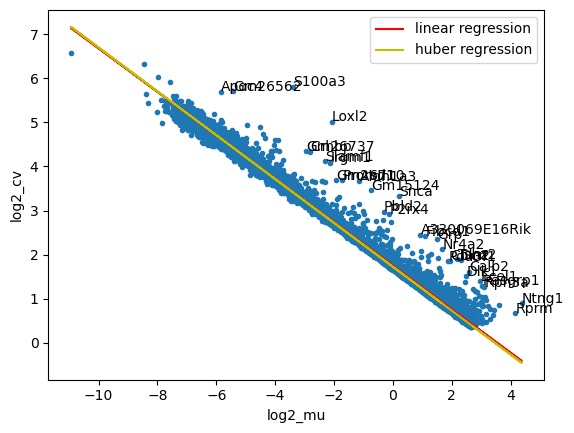

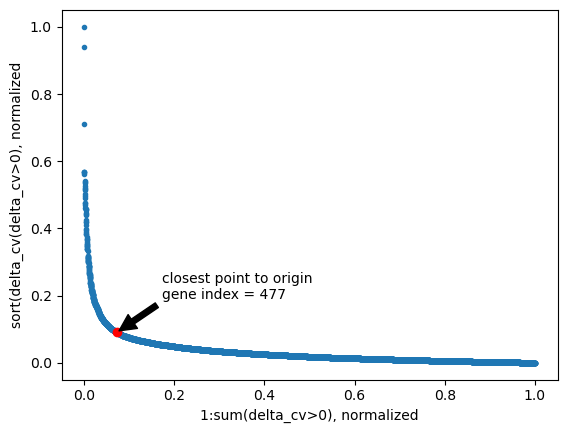

(477, 9019)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


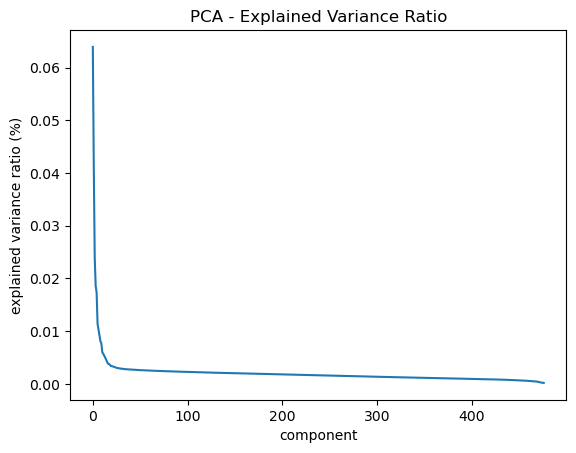

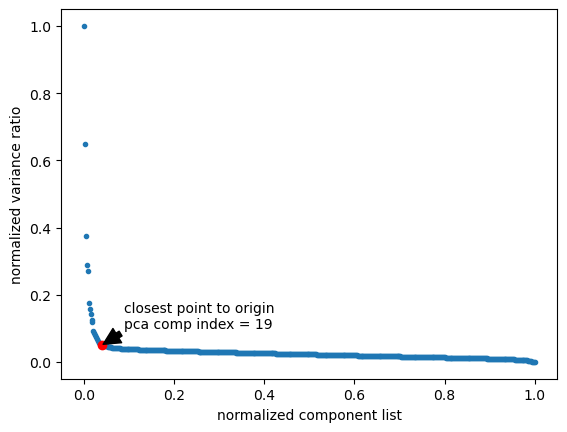

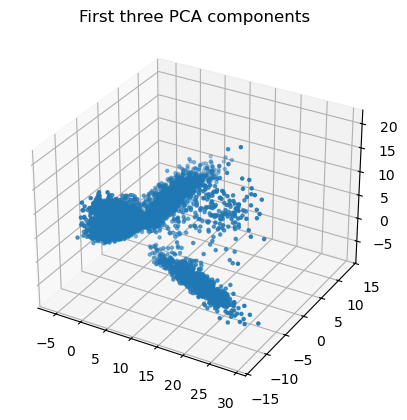

2024-12-12 14:28:35,354 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-12 14:28:36,317 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-12 14:28:36,346 - harmonypy - INFO - Iteration 1 of 20
2024-12-12 14:28:38,285 - harmonypy - INFO - Iteration 2 of 20
2024-12-12 14:28:40,236 - harmonypy - INFO - Iteration 3 of 20
2024-12-12 14:28:42,053 - harmonypy - INFO - Iteration 4 of 20
2024-12-12 14:28:44,096 - harmonypy - INFO - Iteration 5 of 20
2024-12-12 14:28:46,239 - harmonypy - INFO - Iteration 6 of 20
2024-12-12 14:28:48,008 - harmonypy - INFO - Iteration 7 of 20
2024-12-12 14:28:50,047 - harmonypy - INFO - Iteration 8 of 20
2024-12-12 14:28:51,072 - harmonypy - INFO - Iteration 9 of 20
2024-12-12 14:28:52,091 - harmonypy - INFO - Iteration 10 of 20
2024-12-12 14:28:53,204 - harmonypy - INFO - Iteration 11 of 20
2024-12-12 14:28:54,413 - harmonypy - INFO - Iteration 12 of 20
2024-12-12 14:28:55,422 - harmonypy - INFO - Iteration 13 of

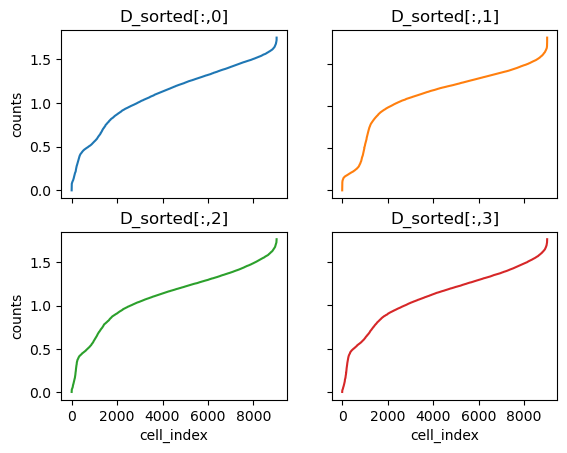

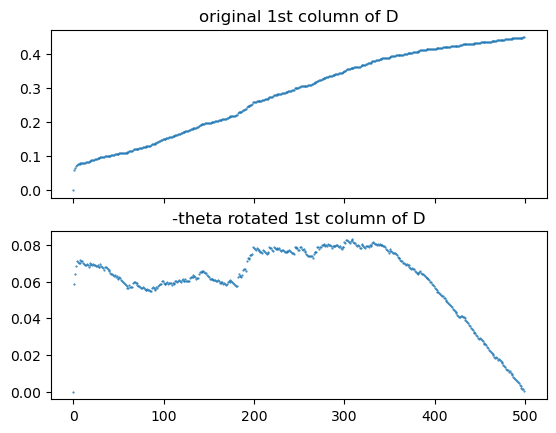

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 54.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


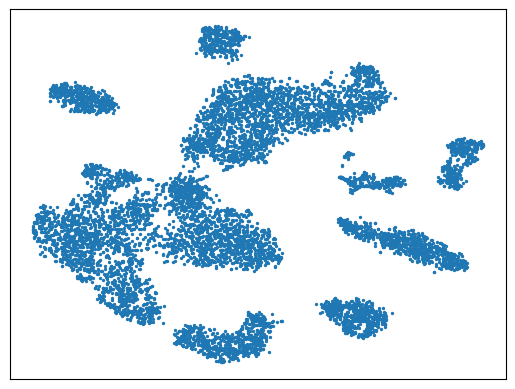

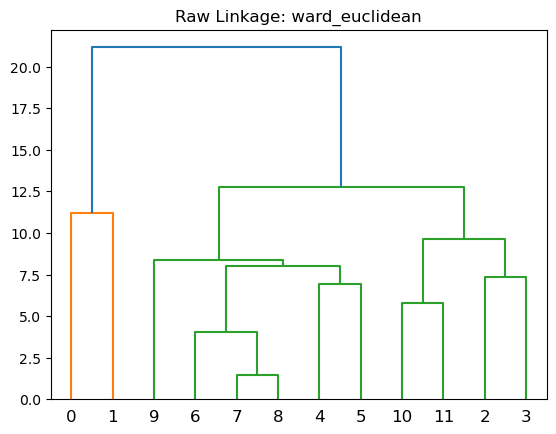

[ 1  0  2  3 10 11  5  4  8  7  6  9]


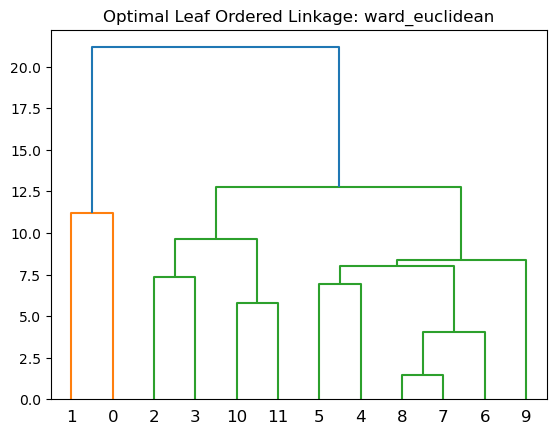

metadata df shape post inter cluster sort
(29, 9019)


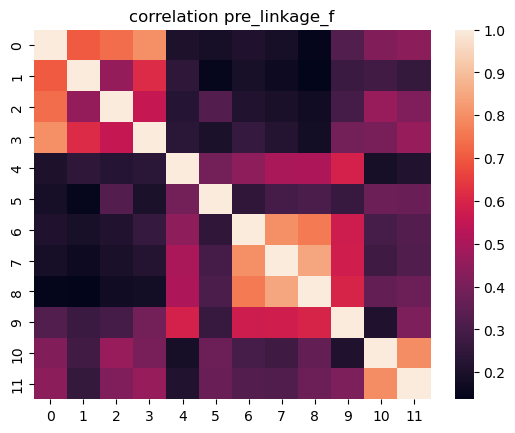

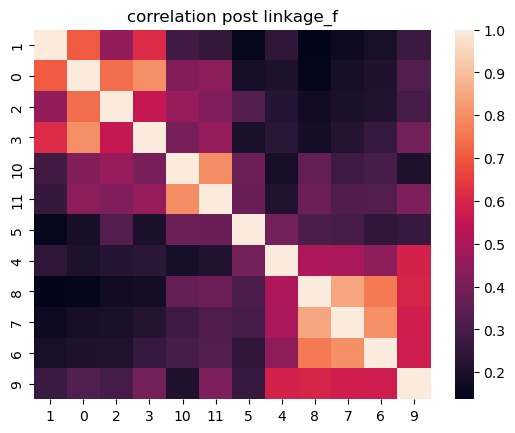

{2: 1, 1: 2, 3: 3, 4: 4, 11: 5, 12: 6, 6: 7, 5: 8, 9: 9, 8: 10, 7: 11, 10: 12}
[1 2 3 4 5 6 7 8 9 10 11 12]
len marker_Genes_sorted 77
len marker_genes_sorted_final 77
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 755, 905, 1289, 1445, 3654, 3993, 4426, 4951, 5926, 8022, 8346, 9018]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
12
[array([ 0,  1,  2,  3,  4, 34]), array([22, 18, 31, 30, 24, 29,  8,  5,  7,  6, 10,  9, 70]), array([16, 15, 14, 17, 12, 11, 13]), array([20, 21, 23, 19]), array([25, 27, 26, 28, 32]), array([38, 35, 33, 37, 36, 39]), array([44, 42, 43, 40, 41]), array([56, 47, 46, 49, 50, 45, 48]), array([53, 65, 51, 54, 55, 52]), array([57, 59, 60, 58, 63, 62, 64, 61]), array([68, 69, 67, 66]), array([74, 73, 71, 75, 76, 72])]
12


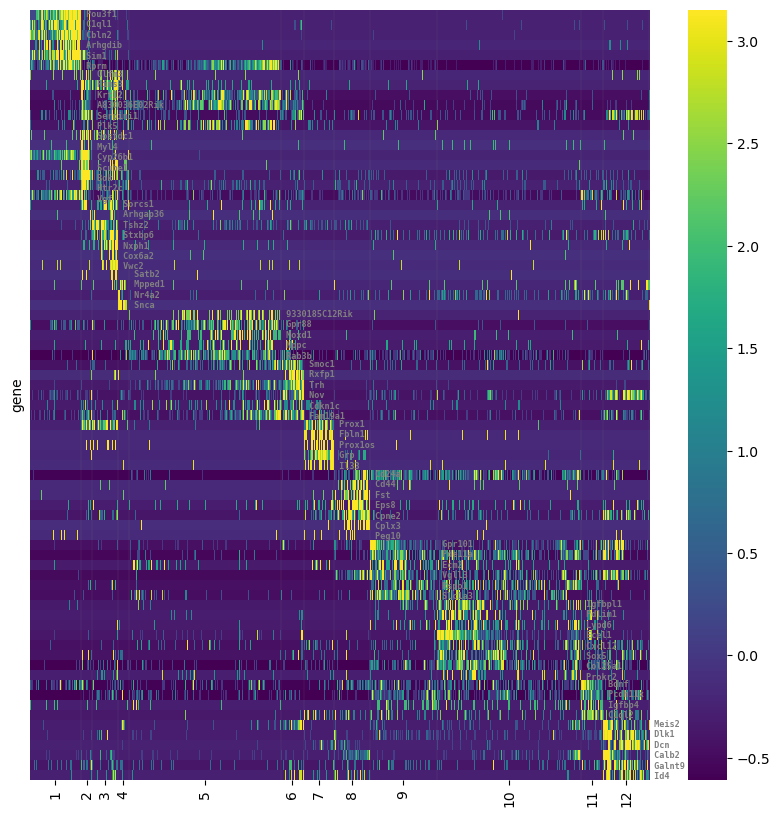

In [353]:
Vglut1_filtered_folder = '/bigdata/isaac/Vglut1_files/filtered/'
cell_class = 'Vglut1'
%matplotlib inline
Vglut1_df_marker_f, Vglut1_arr_tsne_f, Vglut1_meta_data_df_plis_f, Vglut1_meta_data_df_pca, Vglut1_mgs_f, Vglut1_ind_f, Vglut1_ind_s_f, Vglut1_df_marker_log_and_std_col_f, Vglut1_pos_f, Vglut1_linkage_cluster_order_filtered, Vglut1_change_indices_f = dp_rc.reprocess(Vglut1_df_ge,Vglut1_meta_data_df_plis_filtered,Vglut1_linkage_cluster_order_filtered,Vglut1_cluster_indices_filtered,Vglut1_filtered_folder,cell_class, sort = True, write_to_file=False)


In [354]:
np.all(Vglut1_df_marker_f.columns==Vglut1_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [29]:
folder = '/bigdata/isaac/Vglut1_files/filtered/'
Vglut1_labels = dp.get_cluster_labels(folder, 'Vglut1_filtered_labels_rc.csv')

In [30]:
Vglut1_labels

['Sim1-C1ql1',
 'Rims3-Cyp26b1',
 'Tshz2-Stxbp6',
 'Snca-Satb2',
 'Moxd1-Gpr88',
 'Trh-Rxfp1',
 'Il33-Prox1',
 'Fst-Cd44',
 'Slc1a3-Ecm2',
 'Ecel1-Sox5',
 'C1ql2-Pcdh11x',
 'Dlk1-Dcn']

In [27]:
Vglut1_meta_data_df_plis_filtered.loc['cluster_label',:]

ATCACGAGTCGGTGTC-1_10X38_2     1
TGATTTCAGTTCCGTA-1_10X51_2     1
TCAATTCGTTAAAGTG-1_10X51_2     1
TCAGCAACACCAATTG-1_10X51_2     1
ATCCACCCATTGAAAG-1_10X51_2     1
                              ..
CTGGACGGTTCGGACC-1_10X52_3    12
TGGGTTAAGGCGCTTC-1_10X51_1    12
AGGAGGTGTGTGTCGC-1_10X51_1    12
TACCTGCTCCACGGAC-1_10X51_1    12
GTTTACTCACACTGGC-1_10X51_1    12
Name: cluster_label, Length: 9019, dtype: object

In [24]:
Vglut1_linkage_cluster_order_filtered

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [585]:
Vglut1_meta_data_df_plis_filtered.shape

(29, 9019)

### add label markers to plis filtered metadata

In [28]:
Vglut1_filtered_folder

'/bigdata/isaac/Vglut1_files/filtered/'

In [355]:
Vglut1_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(Vglut1_filtered_folder, 
                                                                         Vglut1_meta_data_df_plis_f,
                                                                         Vglut1_linkage_cluster_order_filtered,
                                                                         Vglut1_labels,
                                                                         'Vglut1',
                                                                        write_to_file = True)

In [308]:
today

'2024-12-12'

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
12
[array([ 0,  1,  2,  3,  4, 34]), array([22, 18, 31, 30, 24, 29,  8,  5,  7,  6, 10,  9, 70]), array([16, 15, 14, 17, 12, 11, 13]), array([20, 21, 23, 19]), array([25, 27, 26, 28, 32]), array([38, 35, 33, 37, 36, 39]), array([44, 42, 43, 40, 41]), array([56, 47, 46, 49, 50, 45, 48]), array([53, 65, 51, 54, 55, 52]), array([57, 59, 60, 58, 63, 62, 64, 61]), array([68, 69, 67, 66]), array([74, 73, 71, 75, 76, 72])]
12


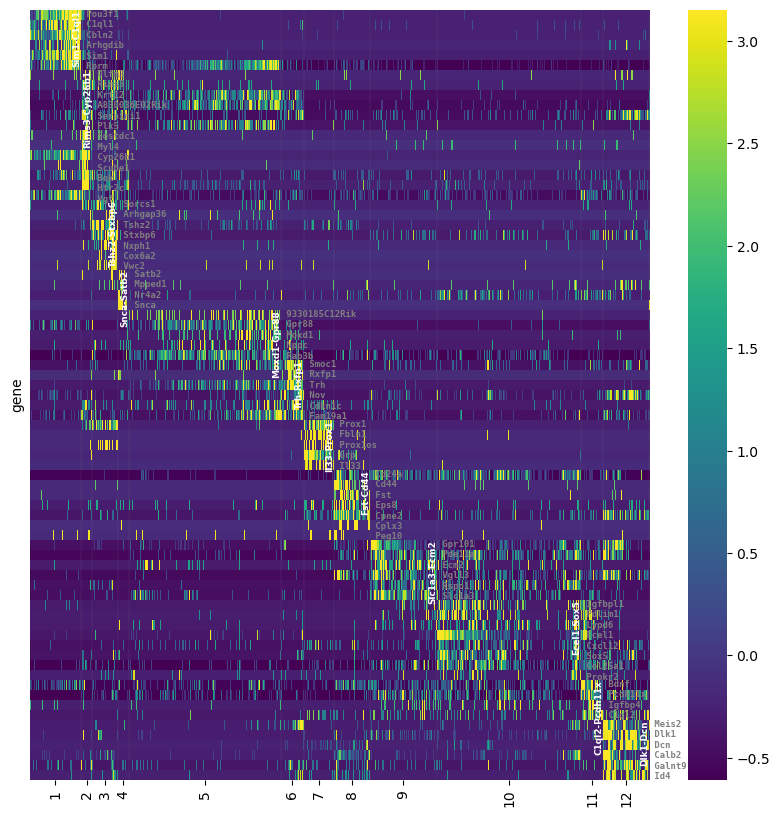

In [312]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
Vglut1_tg_f, Vglut1_tgfs_f = dp.get_heatmap_labels(Vglut1_mgs_f, Vglut1_ind_f, Vglut1_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(Vglut1_df_marker_log_and_std_col_f, 
                       Vglut1_pos_f, 
                       Vglut1_linkage_cluster_order_filtered, 
                       Vglut1_change_indices_f, 
                       Vglut1_tg_f, 
                       Vglut1_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       Vglut1_filtered_folder,
                       fs_waterfall = 6.4,
                       cluster_labels = Vglut1_labels,
                       savefig = True,
                       cell_class = 'Vglut1_filtered_tg_reenrich_labeled')

In [36]:
Vglut1_meta_data_df_plis_filtered_markers.tail()

,ATCACGAGTCGGTGTC-1_10X38_2,TGATTTCAGTTCCGTA-1_10X51_2,TCAATTCGTTAAAGTG-1_10X51_2,TCAGCAACACCAATTG-1_10X51_2,ATCCACCCATTGAAAG-1_10X51_2,ATGGAGGTCAAGTGGG-1_10X51_2,CCCGAAGTCGCCCAGA-1_10X36_2,TTTGATCGTTAAAGTG-1_10X36_2,GATCATGAGACTTCGT-1_10X36_2,CCGGTAGGTTACAGCT-1_10X36_2,...,TTGACCCGTTCGGTCG-1_10X52_3,GTAGTACCATGACAGG-1_10X52_4,GGGACTCAGGCATGCA-1_10X52_4,ACTCTCGTCTCTCTAA-1_10X52_4,CACTTCGTCTAGACCA-1_10X36_1,CTGGACGGTTCGGACC-1_10X52_3,TGGGTTAAGGCGCTTC-1_10X51_1,AGGAGGTGTGTGTCGC-1_10X51_1,TACCTGCTCCACGGAC-1_10X51_1,GTTTACTCACACTGGC-1_10X51_1
lengthbp_seqlib,415.0,474.0,474.0,474.0,474.0,474.0,486.0,486.0,486.0,486.0,...,507.0,535.0,535.0,535.0,476.0,507.0,478.0,478.0,478.0,478.0
Sample_Index,C9,A2,A2,A2,A2,A2,A9,A9,A9,A9,...,F12,G12,G12,G12,H8,F12,G1,G1,G1,G1
cell_class,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,...,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1
cluster_label,1,1,1,1,1,1,1,1,1,1,...,12,12,12,12,12,12,12,12,12,12
markers,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,...,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn


## 5) Updated TSNE Plot

In [38]:
Vglut1_arr_tsne_f.shape

(9019, 2)

In [356]:
np.all(Vglut1_meta_data_df_plis_f_markers.columns == Vglut1_df_marker_f.columns)

True

In [40]:
cell_class

'Vglut1'

In [430]:
Vglut1_df_ge.shape

(14153, 11287)

In [432]:
Vglut1_df_marker_f.shape

(77, 9019)

<Figure size 1000x600 with 0 Axes>

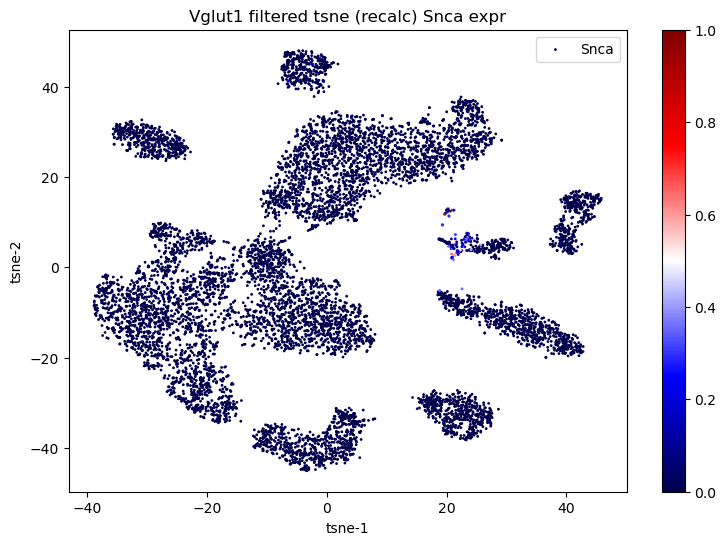

In [436]:
marker_name = 'Snca'
dp.plot_rc_tsne_marker(Vglut1_meta_data_df_plis_filtered_tsne,Vglut1_arr_tsne_f,Vglut1_df_marker_f,marker_name,'Vglut1', Vglut1_filtered_folder, savefig=False)

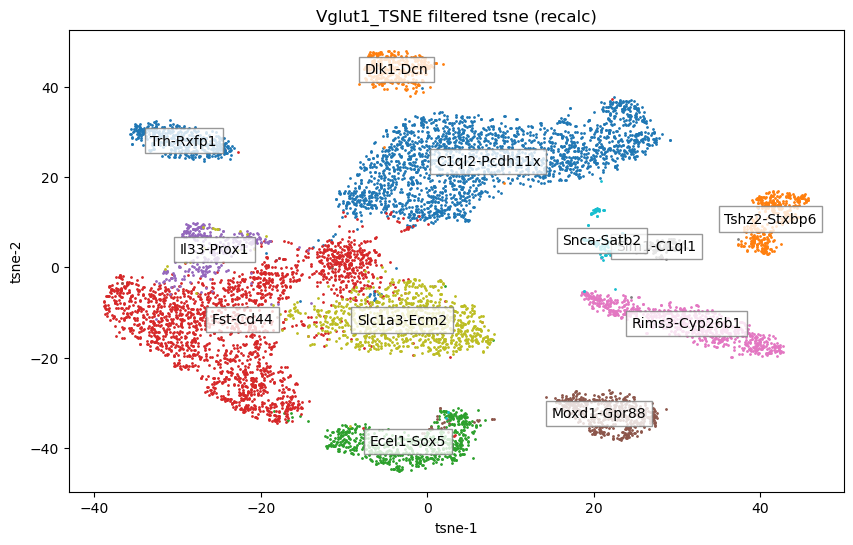

In [429]:
Vglut1_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut1_meta_data_df_plis_filtered, Vglut1_linkage_cluster_order_filtered, Vglut1_labels, 'Vglut1_TSNE', write_to_file = True)
dp.plot_rc_tsne(Vglut1_meta_data_df_plis_filtered_tsne,Vglut1_arr_tsne_f,'Vglut1_TSNE', Vglut1_filtered_folder,savefig=True)


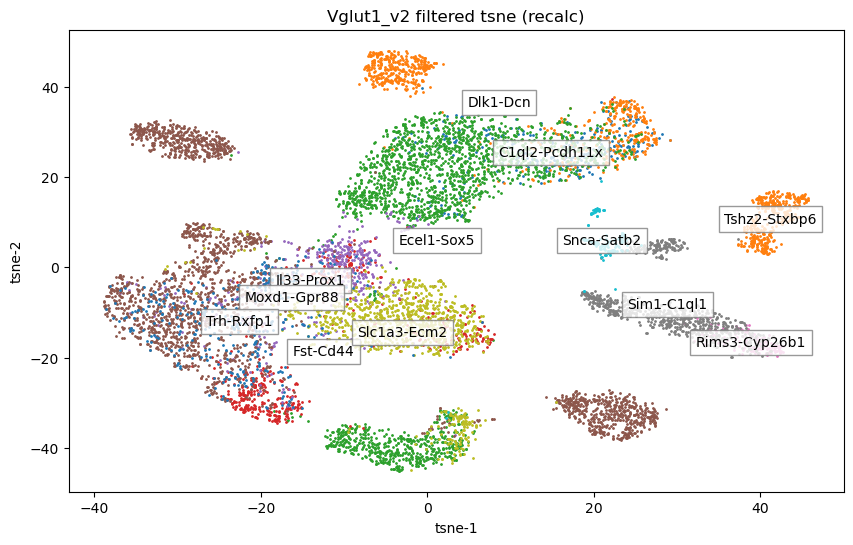

In [388]:
dp.plot_rc_tsne(Vglut1_meta_data_df_plis_f_markers,Vglut1_arr_tsne_f,'Vglut1_v2', Vglut1_filtered_folder,savefig=True)

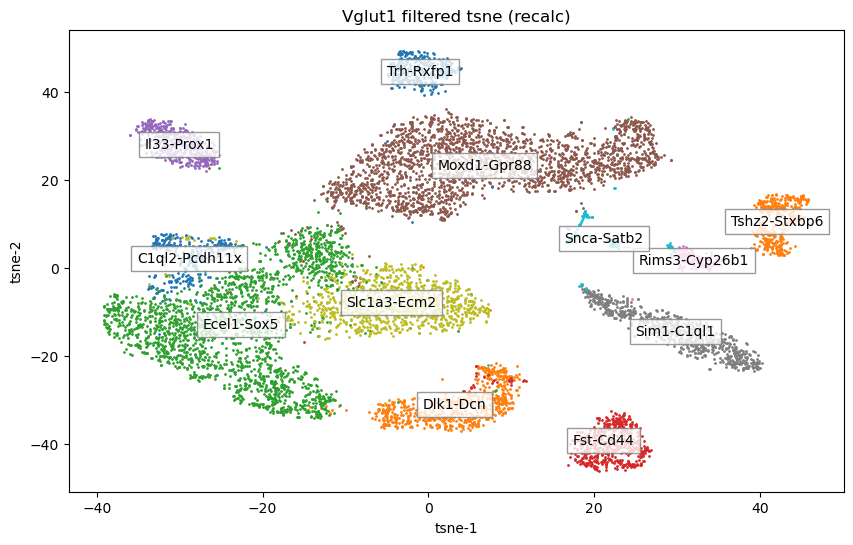

In [48]:
dp.plot_rc_tsne(Vglut1_meta_data_df_plis_filtered_markers,Vglut1_arr_tsne_f,cell_class, Vglut1_filtered_folder,savefig=True)

## 6) Violin Plots

In [358]:
np.all(Vglut1_df_marker_f.columns == Vglut1_meta_data_df_plis_f_markers.columns)

True

In [359]:
Vglut1_adata_f = ad.AnnData(Vglut1_df_marker_f.T)
#add aligned metadata
for x in Vglut1_meta_data_df_plis_f_markers.index:
    Vglut1_adata_f.obs[str(x)] = Vglut1_meta_data_df_plis_f_markers.loc[str(x),:]

Vglut1_markers = Vglut1_adata_f.obs['markers']
_, idx = np.unique(Vglut1_adata_f.obs['markers'], return_index=True)
Vglut1_markers = list(Vglut1_markers[np.sort(idx)])

/tmp/ipykernel_3115776/4055460996.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Vglut1_markers = list(Vglut1_markers[np.sort(idx)])


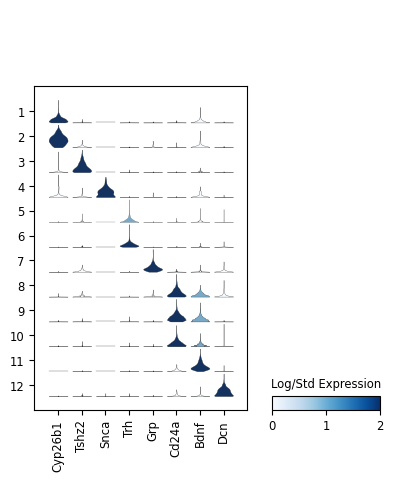

In [360]:
Vglut1_violin_markers = ['Cyp26b1','Tshz2','Snca','Trh','Grp','Cd24a','Bdnf','Dcn']
sc.settings.figdir = "/bigdata/isaac/Vglut1_files/filtered"
%matplotlib inline
#save = 'Vglut1_violin.pdf'
#for using markers as category labels:
#groupby='markers', categories_order= Vglut1_markers
sc.pl.stacked_violin(Vglut1_adata_f, Vglut1_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width')
      

## Vglut2 Analysis <a name="vglut2_analysis"></a>

## 1) Process (L2)

num m cells: 4058 num f cells: 5748


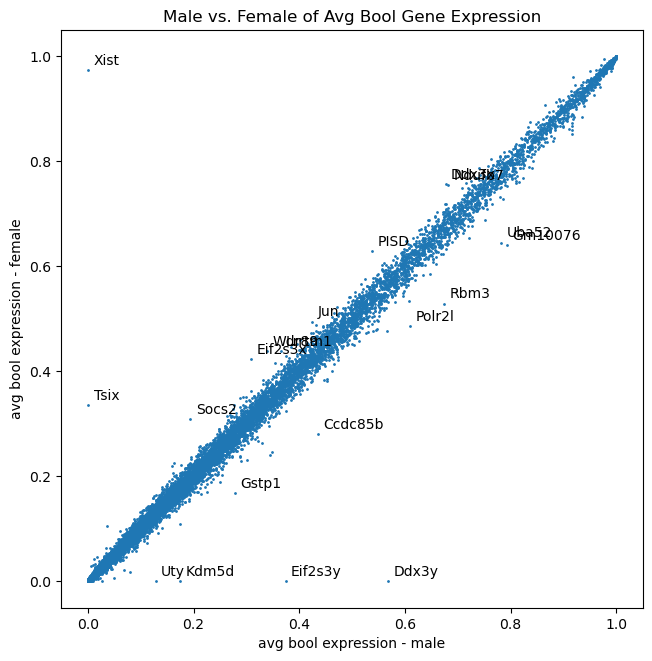

Total genes reduced from 27933 to 14090
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


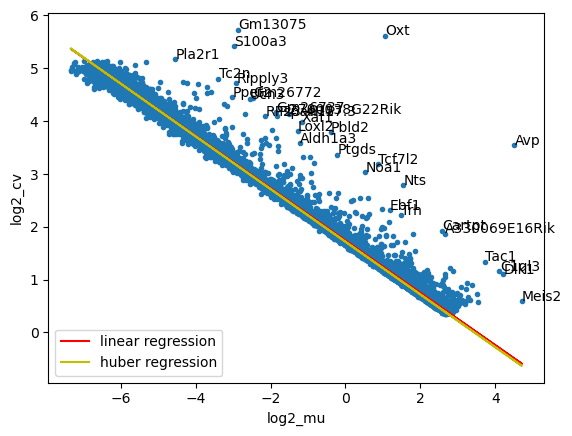

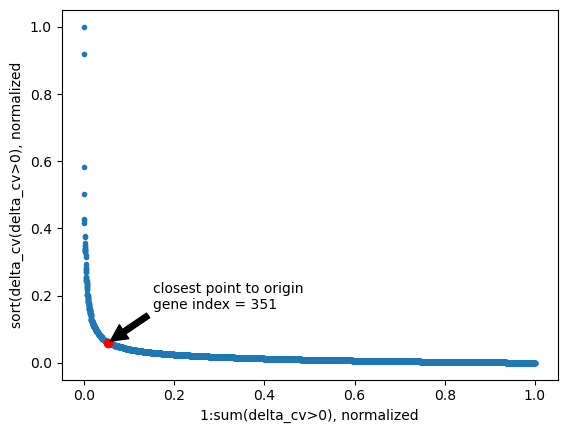

(351, 9806)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


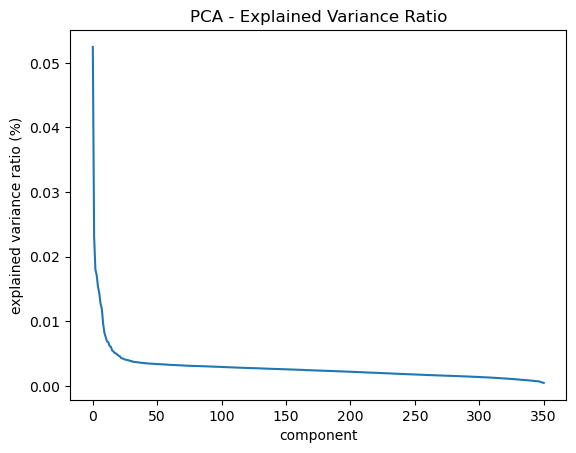

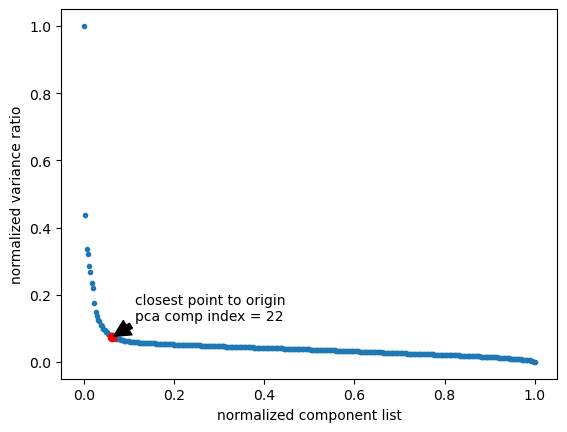

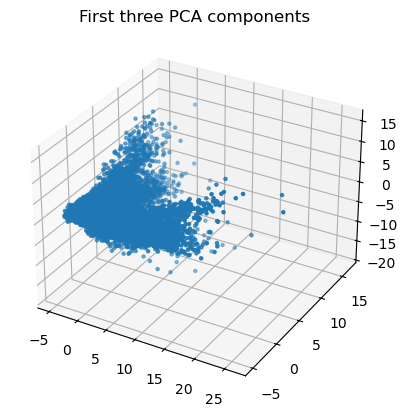

2024-12-10 11:36:43,070 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-10 11:36:44,149 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-10 11:36:44,187 - harmonypy - INFO - Iteration 1 of 20
2024-12-10 11:36:46,284 - harmonypy - INFO - Iteration 2 of 20
2024-12-10 11:36:48,374 - harmonypy - INFO - Iteration 3 of 20
2024-12-10 11:36:50,487 - harmonypy - INFO - Iteration 4 of 20
2024-12-10 11:36:52,577 - harmonypy - INFO - Iteration 5 of 20
2024-12-10 11:36:53,912 - harmonypy - INFO - Iteration 6 of 20
2024-12-10 11:36:54,968 - harmonypy - INFO - Iteration 7 of 20
2024-12-10 11:36:56,025 - harmonypy - INFO - Iteration 8 of 20
2024-12-10 11:36:56,799 - harmonypy - INFO - Iteration 9 of 20
2024-12-10 11:36:57,480 - harmonypy - INFO - Iteration 10 of 20
2024-12-10 11:36:58,154 - harmonypy - INFO - Iteration 11 of 20
2024-12-10 11:36:58,926 - harmonypy - INFO - Iteration 12 of 20
2024-12-10 11:36:59,688 - harmonypy - INFO - Iteration 13 of

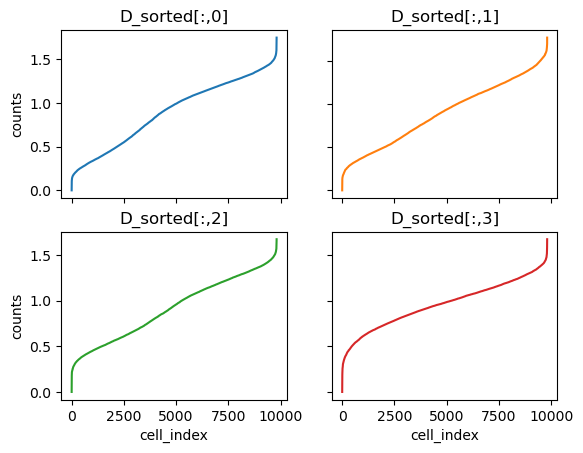

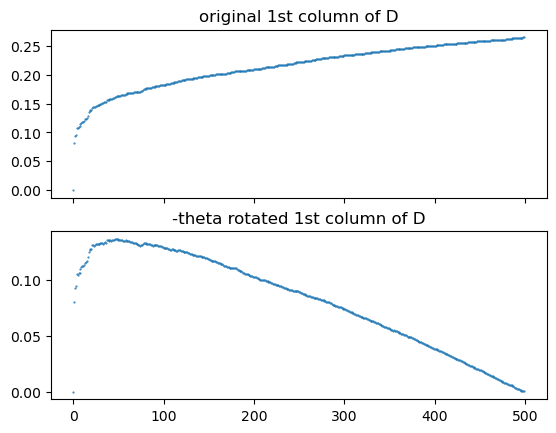

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 54.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


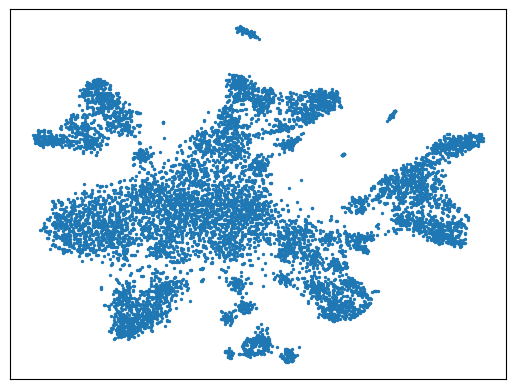

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.4149246380898524

running dbscan with epsilon: 1.4149246380898524  and minpts: 20
Estimated number of clusters: 37
Estimated number of noise points: 981


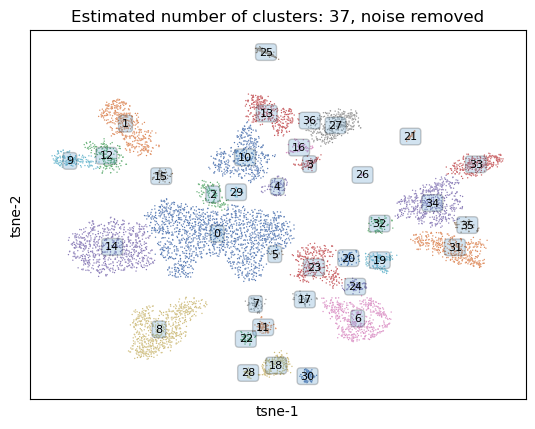

found existing cluster_labels in meta_data_df... removing old labels...
verify raw prelinkage df and raw metadata df have same columns:
[ True  True  True ...  True  True  True]


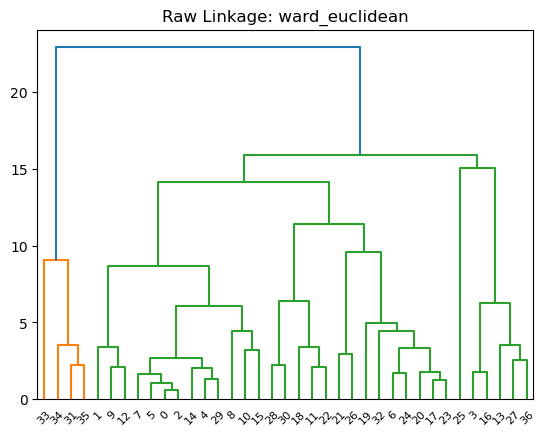

[33 34 35 31 30 28 18 22 11 21 26 32 20 23 17  6 24 19  8 10 15 14 29  4
  5  2  0  7  1 12  9  3 16 36 27 13 25]


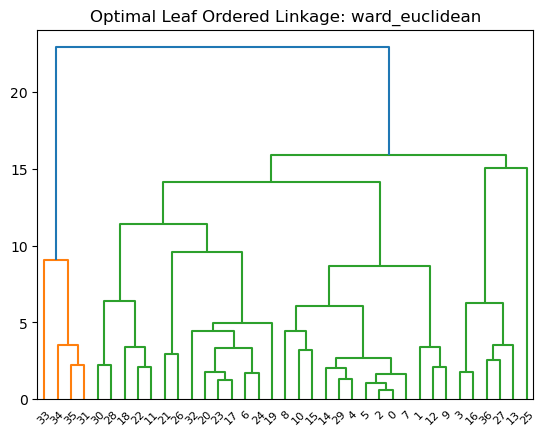

metadata df shape post inter cluster sort
(29, 8825)


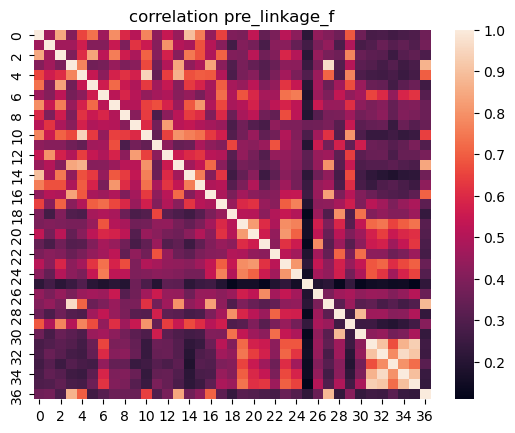

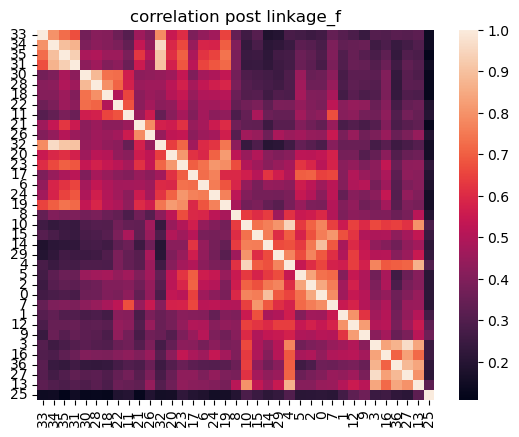

{33: 1, 34: 2, 35: 3, 31: 4, 30: 5, 28: 6, 18: 7, 22: 8, 11: 9, 21: 10, 26: 11, 32: 12, 20: 13, 23: 14, 17: 15, 6: 16, 24: 17, 19: 18, 8: 19, 10: 20, 15: 21, 14: 22, 29: 23, 4: 24, 5: 25, 2: 26, 0: 27, 7: 28, 1: 29, 12: 30, 9: 31, 3: 32, 16: 33, 36: 34, 27: 35, 13: 36, 25: 37}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 144
len marker_genes_sorted_final 144
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 284, 818, 877, 1325, 1414, 1455, 1650, 1706, 1798, 1862, 1882, 1970, 2036, 2362, 2416, 2942, 3017, 3159, 3827, 4258, 4320, 5091, 5111, 5202, 5220, 5345, 6970, 7028, 7492, 7670, 7861, 7945, 8019, 8025, 8372, 8718, 8824]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 16, 17, 18, 20, 21, 25, 27, 28, 29, 30, 32, 33, 34, 35, 36

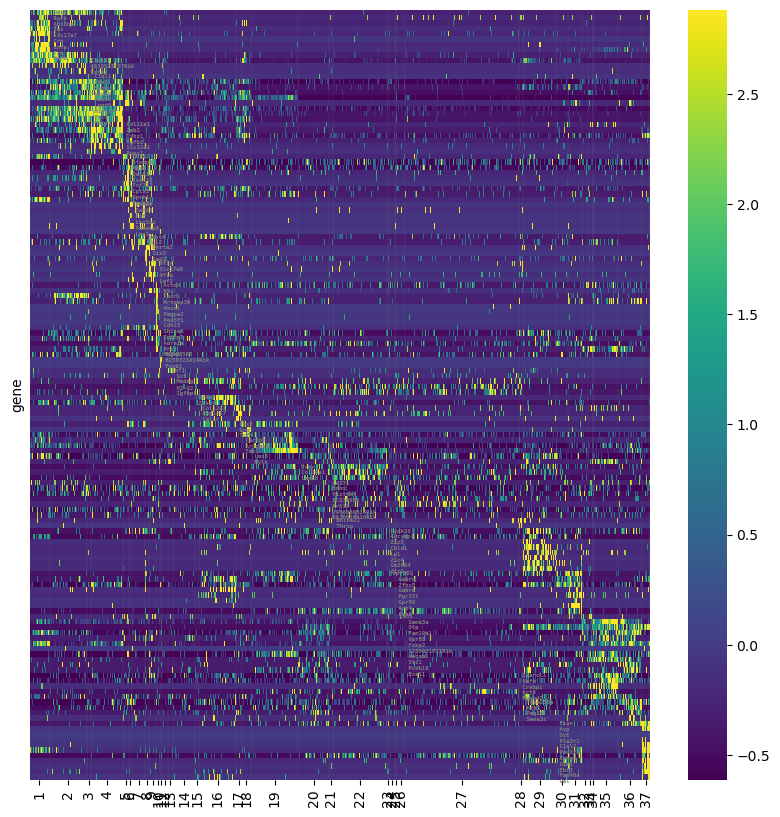

[ True  True  True ...  True  True  True]


In [51]:
%matplotlib inline
#try new process module
Vglut2_folder = '/bigdata/isaac/Vglut2_files/'
Vglut2_df_marker, Vglut2_arr_tsne, Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, Vglut2_df_marker_log_and_std_col, Vglut2_df_plis, Vglut2_cluster_indices, Vglut2_df_marker_log_and_std, Vglut2_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, Vglut2_folder, 'Vglut2')

In [339]:
np.all(Vglut2_df_marker.columns == Vglut2_meta_data_df_plis.columns)

True

/tmp/ipykernel_3115776/2882743691.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut2_linkage_cluster_order, rotation = 90)


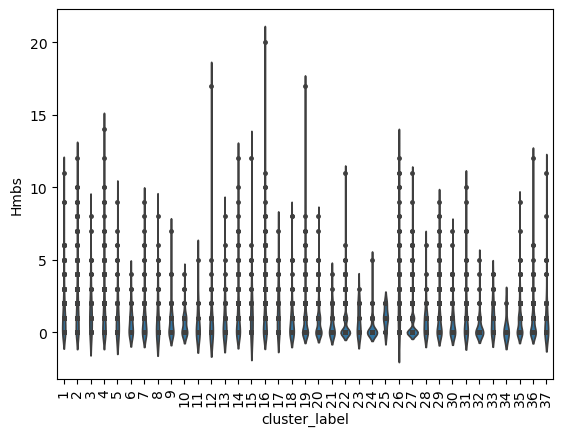

In [104]:
#check some specific expression of genes
gene = 'Hmbs'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut2_meta_data_df_plis.T['cluster_label'], y=Vglut2_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut2_linkage_cluster_order, rotation = 90)
plt.show()

In [128]:
for v in Vglut2_linkage_cluster_order:

    ncells = Vglut2_meta_data_df_plis.loc[:,Vglut2_meta_data_df_plis.loc['cluster_label',:]==v].shape[1]
    if ncells == 326:
        print (v)

14


## 2) Drop clusters, filter heatmap elements

In [129]:
#Vglut2_clusters_to_drop, Vglut2_thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, cluster_labels=[26], thresh_cells=140)
#clusters_to_drop, thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, linkage_cluster_order, cluster_labels=[3,4,5,6,7,8,9,10,14,15,16,19,21,22,24,26,27,28,30,33],cluster_keepers=[17], thresh_cells=50)
Vglut2_clusters_to_drop, Vglut2_thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, cluster_labels=[8,9,14,20,31],cluster_keepers=[11,37,29,18,17,16,22,19,28,29,35,36,1,2], thresh_cells=140)
Vglut2_clusters_to_drop

[3, 5, 6, 8, 9, 10, 12, 13, 14, 15, 20, 21, 23, 24, 25, 26, 31, 32, 33, 34]

In [130]:
len(Vglut2_linkage_cluster_order)

37

In [131]:
len(Vglut2_linkage_cluster_order) - len(Vglut2_clusters_to_drop)

17

In [361]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
Vglut2_df_marker_log_and_std_filtered, Vglut2_df_marker_log_and_std_col_filtered, Vglut2_meta_data_df_plis_filtered, Vglut2_pos_filtered_tmp, Vglut2_df_plis_filtered,Vglut2_linkage_cluster_order_filtered,Vglut2_linkage_cluster_order_filtered_tmp, Vglut2_change_indices_filtered, Vglut2_cluster_indices_filtered  = dp.filter_heatmap_elements(Vglut2_filtered_folder, 'Vglut2', Vglut2_clusters_to_drop,
                                                                                                                                                                                                                                        Vglut2_df_marker_log_and_std,
                                                                                                                                                                                                                                        Vglut2_meta_data_df_plis,
                                                                                                                                                                                                                                        Vglut2_df_plis,
                                                                                                                                                                                                                                        Vglut2_cluster_indices,
                                                                                                                                                                                                                                        Vglut2_linkage_cluster_order)

[ True  True  True ...  True  True  True]
[ True  True  True ...  True  True  True]
Indices where the value changes: [0, 284, 818, 1266, 1461, 1481, 2007, 2082, 2224, 2892, 3663, 5288, 5346, 5810, 5988, 6335, 6681, 6787]
change_indices_filtered [284, 818, 1266, 1461, 1481, 2007, 2082, 2224, 2892, 3663, 5288, 5346, 5810, 5988, 6335, 6681, 6787]
17
{1: 1, 2: 2, 4: 3, 7: 4, 11: 5, 16: 6, 17: 7, 18: 8, 19: 9, 22: 10, 27: 11, 28: 12, 29: 13, 30: 14, 35: 15, 36: 16, 37: 17}
[1 2 4 7 11 16 17 18 19 22 27 28 29 30 35 36 37]


In [362]:
np.all(Vglut2_df_plis_filtered.columns == Vglut2_meta_data_df_plis_filtered.columns)

True

## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


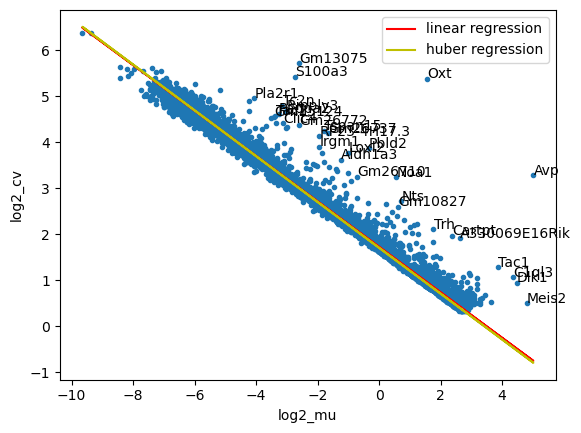

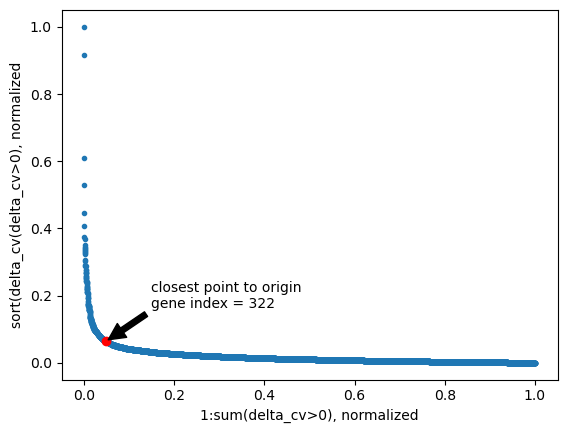

(322, 6788)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


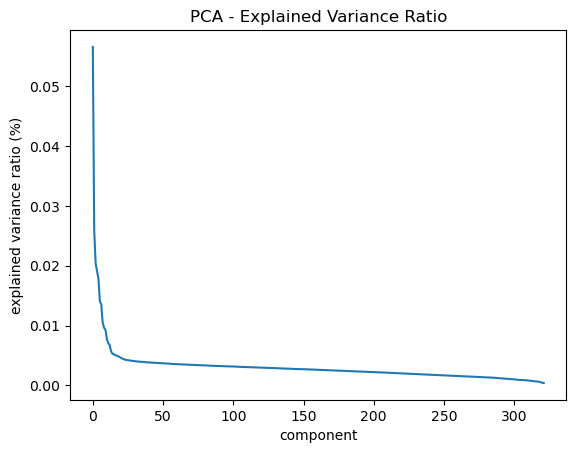

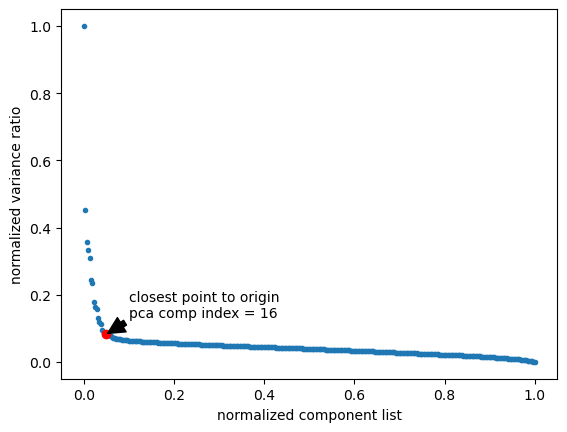

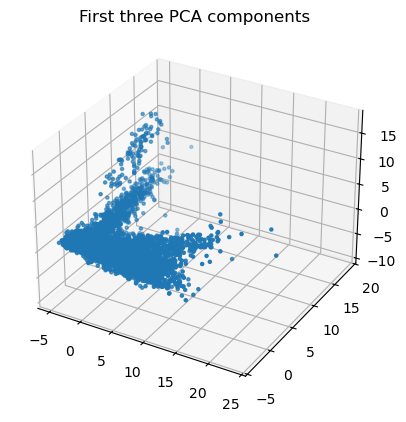

2024-12-12 14:44:09,642 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-12 14:44:10,502 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-12 14:44:10,523 - harmonypy - INFO - Iteration 1 of 20
2024-12-12 14:44:11,927 - harmonypy - INFO - Iteration 2 of 20
2024-12-12 14:44:13,290 - harmonypy - INFO - Iteration 3 of 20
2024-12-12 14:44:14,774 - harmonypy - INFO - Iteration 4 of 20
2024-12-12 14:44:16,100 - harmonypy - INFO - Iteration 5 of 20
2024-12-12 14:44:17,863 - harmonypy - INFO - Iteration 6 of 20
2024-12-12 14:44:18,957 - harmonypy - INFO - Iteration 7 of 20
2024-12-12 14:44:20,330 - harmonypy - INFO - Iteration 8 of 20
2024-12-12 14:44:21,333 - harmonypy - INFO - Iteration 9 of 20
2024-12-12 14:44:22,031 - harmonypy - INFO - Iteration 10 of 20
2024-12-12 14:44:23,025 - harmonypy - INFO - Iteration 11 of 20
2024-12-12 14:44:23,568 - harmonypy - INFO - Converged after 11 iterations


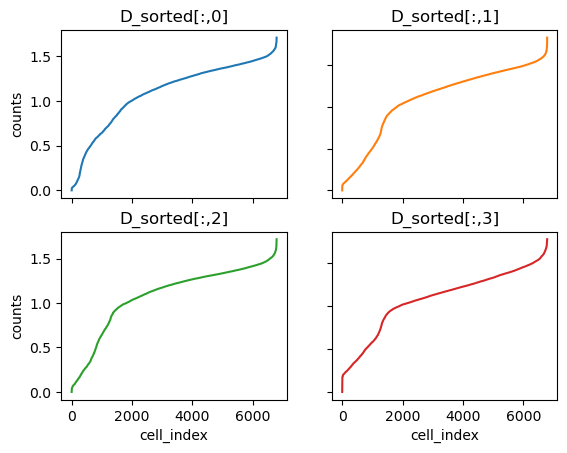

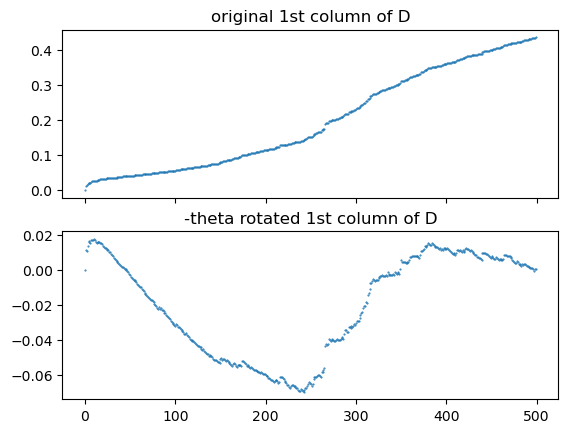

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 53.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


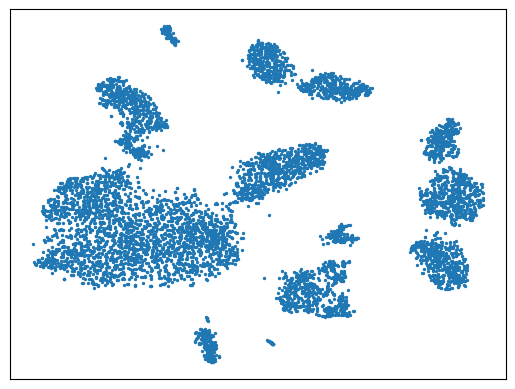

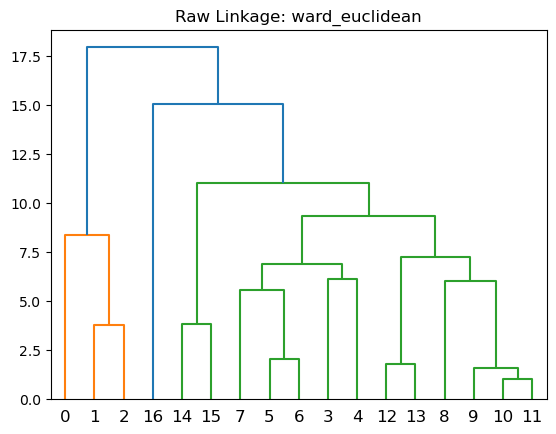

[ 0  1  2 14 15 12 13 11 10  9  8  7  6  5  3  4 16]


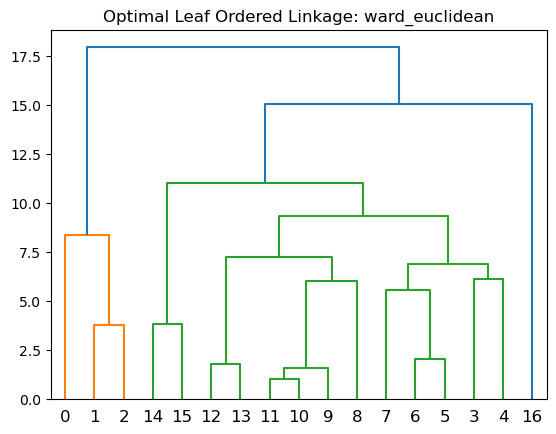

metadata df shape post inter cluster sort
(29, 6788)


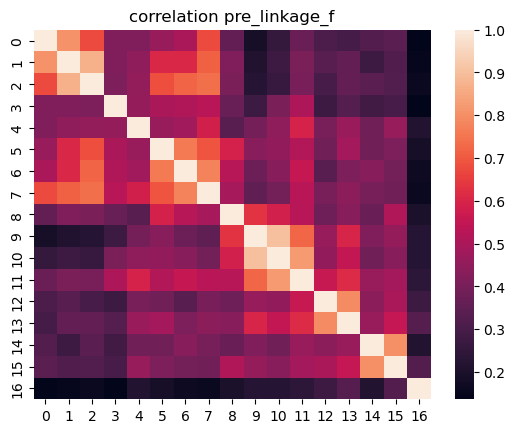

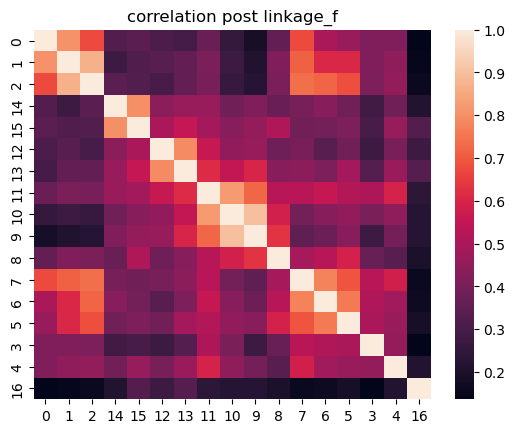

{1: 1, 2: 2, 3: 3, 15: 4, 16: 5, 13: 6, 14: 7, 12: 8, 11: 9, 10: 10, 9: 11, 8: 12, 7: 13, 6: 14, 4: 15, 5: 16, 17: 17}
[1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17]
len marker_Genes_sorted 95
len marker_genes_sorted_final 95
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 284, 818, 1266, 1613, 1959, 2423, 2601, 2659, 4284, 5055, 5723, 5865, 5940, 6466, 6661, 6681, 6787]
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16]
16
[array([ 0,  1,  2,  3,  4,  5,  6, 65, 10, 51]), array([ 7, 12,  9,  8, 11]), array([16, 13, 17, 18, 15, 71, 14]), array([45, 49, 23, 22, 62, 56, 20, 21, 19]), array([29, 26, 25, 28]), array([35, 33, 32, 30, 31, 34]), array([38, 36, 40, 39]), array([44, 41]), array([52, 53, 48, 46, 55]), array([57, 58, 50, 61, 60]), array([63, 59, 64, 67]), array([54, 70, 69, 68]), array([42, 72, 75, 76, 74]), array([73, 80, 79, 78, 77, 82, 83, 81]), array([88, 43, 66, 87, 84, 85, 86]), array([92

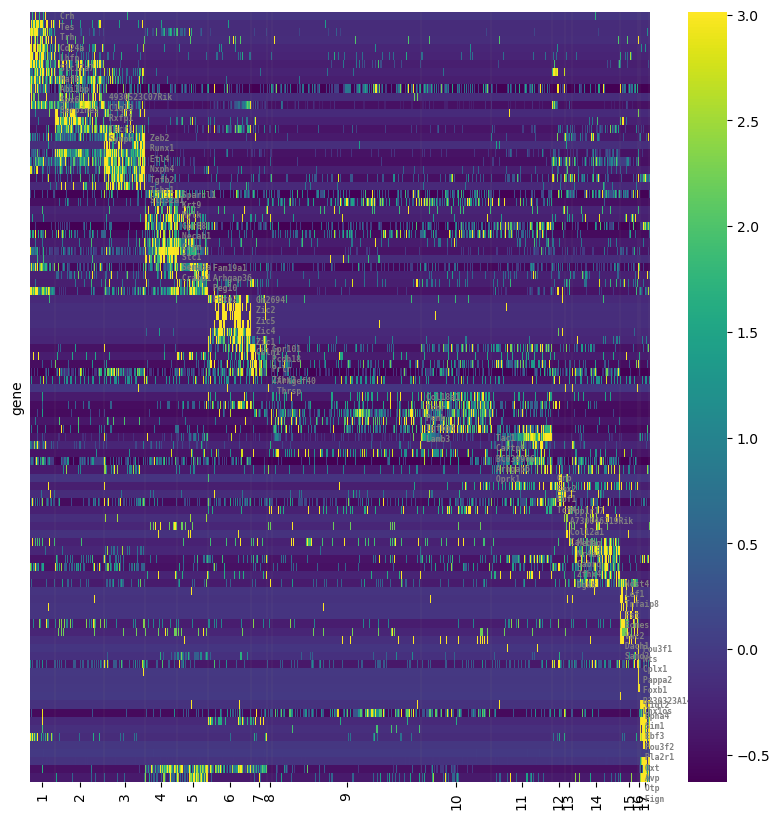

In [363]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
cell_class = 'Vglut2'
%matplotlib inline
Vglut2_df_marker_f, Vglut2_arr_tsne_f, Vglut2_meta_data_df_plis_f, Vglut2_meta_data_df_pca, Vglut2_mgs_f, Vglut2_ind_f, Vglut2_ind_s_f, Vglut2_df_marker_log_and_std_col_f, Vglut2_pos_f, Vglut2_linkage_cluster_order_filtered, Vglut2_change_indices_f = dp_rc.reprocess(Vglut2_df_ge,Vglut2_meta_data_df_plis_filtered,Vglut2_linkage_cluster_order_filtered,Vglut2_cluster_indices_filtered,Vglut2_filtered_folder,cell_class, sort = True, write_to_file=False)

/tmp/ipykernel_3115776/999875081.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut2_linkage_cluster_order_filtered, rotation = 90)


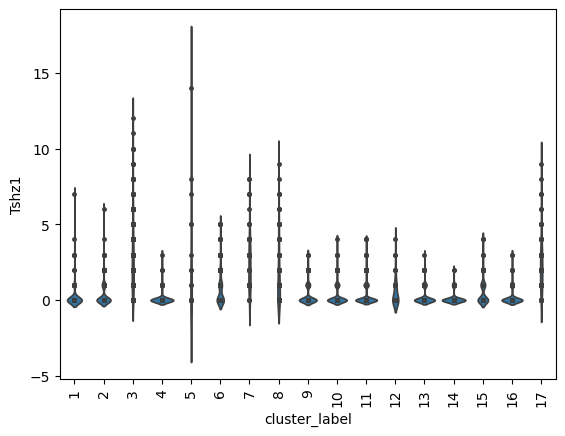

In [364]:
#check some specific expression of genes
gene = 'Tshz1'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut2_meta_data_df_plis_filtered.T['cluster_label'], y=Vglut2_df_plis_filtered.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut2_linkage_cluster_order_filtered, rotation = 90)
plt.show()

In [126]:
Vglut2_meta_data_df_plis_filtered.loc[:,Vglut2_meta_data_df_plis_filtered.loc['cluster_label',:]==7].shape[1]

326

In [365]:
np.all(Vglut2_df_marker_f.columns == Vglut2_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [136]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
Vglut2_labels = dp.get_cluster_labels(Vglut2_filtered_folder, 'Vglut2_filtered_labels_rc.csv')
Vglut2_labels

['Trh-Tes',
 'Synpr-Sox6',
 'Tshz1-Tgfb2',
 'Otp-Crabp1',
 'Otp-Peg10',
 'Otp-Zic5',
 'Otp-Prlr',
 'Arhgef40-Thrsp',
 'Epha4-Penk',
 'Lamb3-Col18a1',
 'Tac1-Cartpt',
 'Tshz1-Grp',
 'Tshz1-Calcr',
 'Zfhx4-Nr4a2',
 'Eomes-Tnfaip8',
 'Foxb1-Lhx1os',
 'Otp-Avp']

### add label markers to plis filtered metadata

In [366]:
Vglut2_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(Vglut2_filtered_folder, 
                                                                         Vglut2_meta_data_df_plis_f,
                                                                         Vglut2_linkage_cluster_order_filtered,
                                                                         Vglut2_labels,
                                                                         'Vglut2',
                                                                        write_to_file = True)


### updated heatmap with labels

[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16]
16
[array([ 0,  1,  2,  3,  4,  5,  6, 65, 10, 51]), array([ 7, 12,  9,  8, 11]), array([16, 13, 17, 18, 15, 71, 14]), array([45, 49, 23, 22, 62, 56, 20, 21, 19]), array([29, 26, 25, 28]), array([35, 33, 32, 30, 31, 34]), array([38, 36, 40, 39]), array([44, 41]), array([52, 53, 48, 46, 55]), array([57, 58, 50, 61, 60]), array([63, 59, 64, 67]), array([54, 70, 69, 68]), array([42, 72, 75, 76, 74]), array([73, 80, 79, 78, 77, 82, 83, 81]), array([88, 43, 66, 87, 84, 85, 86]), array([92, 47, 37, 93, 94, 91, 90, 89, 24, 27])]
16


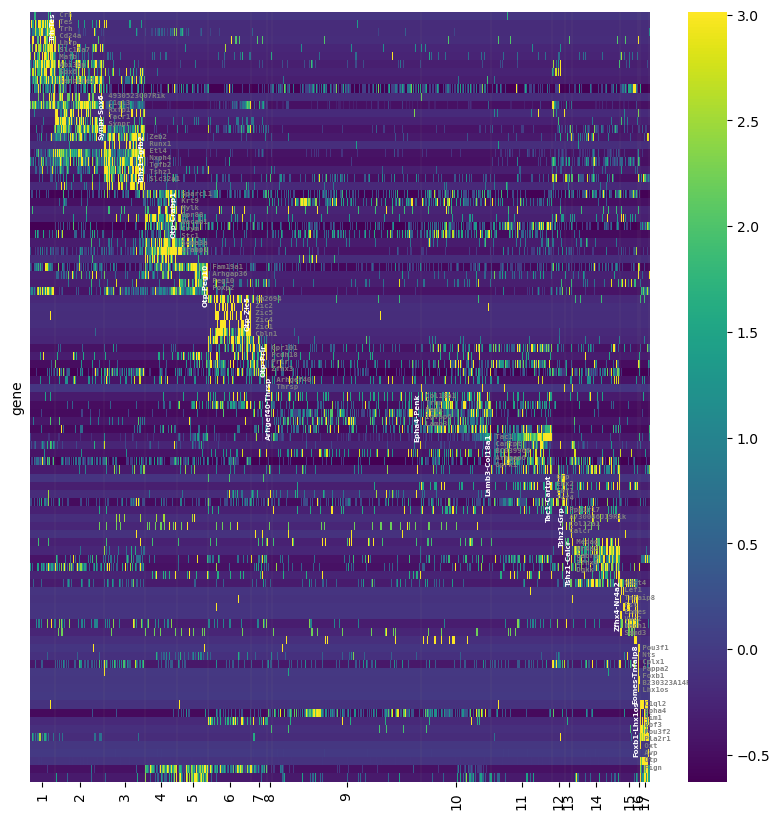

In [162]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
Vglut2_tg_f, Vglut2_tgfs_f = dp.get_heatmap_labels(Vglut2_mgs_f, Vglut2_ind_f, Vglut2_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(Vglut2_df_marker_log_and_std_col_f, 
                       Vglut2_pos_f, 
                       Vglut2_linkage_cluster_order_filtered, 
                       Vglut2_change_indices_f, 
                       Vglut2_tg_f, 
                       Vglut2_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       Vglut2_filtered_folder,
                       fs_waterfall = 5.2,
                       cluster_labels = Vglut2_labels,
                       savefig = True,
                       cell_class = 'Vglut2_filtered_tg_reenrich_labeled')

In [153]:
Vglut2_tg_f

[['Crh',
  'Tes',
  'Trh',
  'Cd24a',
  'Lhfp',
  'Slc17a7',
  'Mafb',
  'Abi3bp',
  'Sox6',
  'Serpine2'],
 ['4930523C07Rik', 'C1ql3', 'Rxfp1', 'Tacr1', 'Synpr'],
 ['Zeb2', 'Runx1', 'Etl4', 'Nxph4', 'Tgfb2', 'Tshz1', 'Slc32a1'],
 ['Sparcl1',
  'Krt9',
  'Mylk',
  'Gpr88',
  'Necab1',
  'Crym',
  'Stc1',
  'Sema3a',
  'Crabp1'],
 ['Fam19a1', 'Arhgap36', 'Peg10', 'Foxp2'],
 ['Gm2694', 'Zic2', 'Zic5', 'Zic4', 'Zic1', 'Cbln1'],
 ['Gpr101', 'Pcdh18', 'Prlr', 'Zfhx3'],
 ['Arhgef40', 'Thrsp'],
 ['Col18a1', 'Trhr', 'Penk', 'Igfbp6', 'Lamb3'],
 ['Tac1', 'Cartpt', 'BC039966', 'Arhgap6', 'Oprk1'],
 ['Grp', 'Emx2', 'Ebf1', 'Tcf4'],
 ['Ppp1r17', 'A730046J19Rik', 'Col12a1', 'Calcr'],
 ['Medag', 'Nr4a2', 'Gabrq', 'Zfhx4', 'Dgkk'],
 ['Ndst4', 'Lef1', 'Tnfaip8', 'Fst', 'Eomes', 'Vwc2', 'Dach1', 'Samd3'],
 ['Pou3f1', 'Nts', 'Cplx1', 'Pappa2', 'Foxb1', 'B230323A14Rik', 'Lhx1os'],
 ['C1ql2',
  'Epha4',
  'Sim1',
  'Ebf3',
  'Pou3f2',
  'Pla2r1',
  'Oxt',
  'Avp',
  'Otp',
  'Fign']]

## 5) Updated TSNE Plot

In [383]:
Vglut2_meta_data_df_plis_filtered_markers.shape

(30, 6788)

In [381]:
Vglut2_arr_tsne_f.shape

(6788, 2)

In [385]:
cell_class

'GABA'

In [420]:
np.all(Vglut2_meta_data_df_pca.T.columns == Vglut2_meta_data_df_plis_f_markers)

False

In [421]:
np.all(Vglut2_meta_data_df_pca.T.columns == Vglut2_meta_data_df_plis_filtered.columns)

True

In [422]:
Vglut2_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut2_meta_data_df_plis_filtered, Vglut2_linkage_cluster_order_filtered, Vglut2_labels, cell_class, write_to_file = False)

In [425]:
np.all(Vglut2_meta_data_df_plis_filtered_tsne.columns == Vglut2_meta_data_df_plis_f_markers.columns)

False

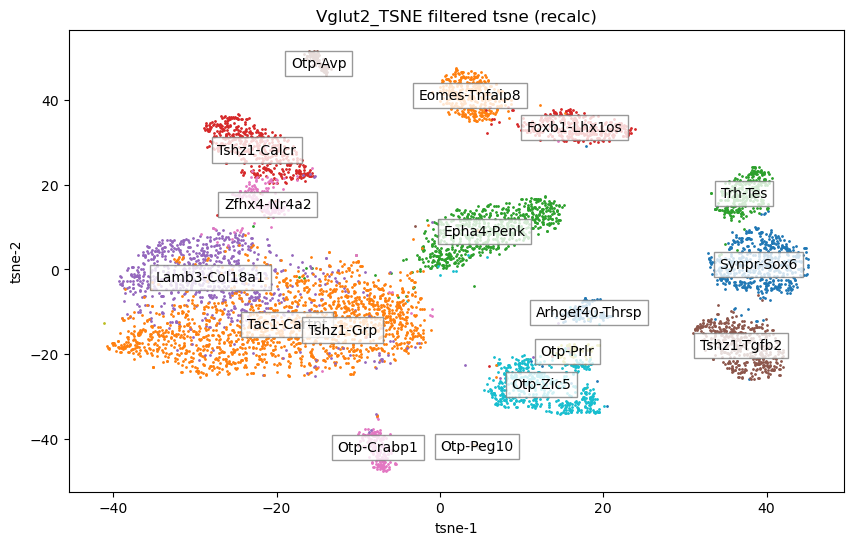

In [427]:
Vglut2_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut2_meta_data_df_plis_filtered, Vglut2_linkage_cluster_order_filtered, Vglut2_labels, 'Vglut2_TSNE', write_to_file = True)
dp.plot_rc_tsne(Vglut2_meta_data_df_plis_filtered_tsne,Vglut2_arr_tsne_f,'Vglut2_TSNE', Vglut2_filtered_folder,savefig=True)


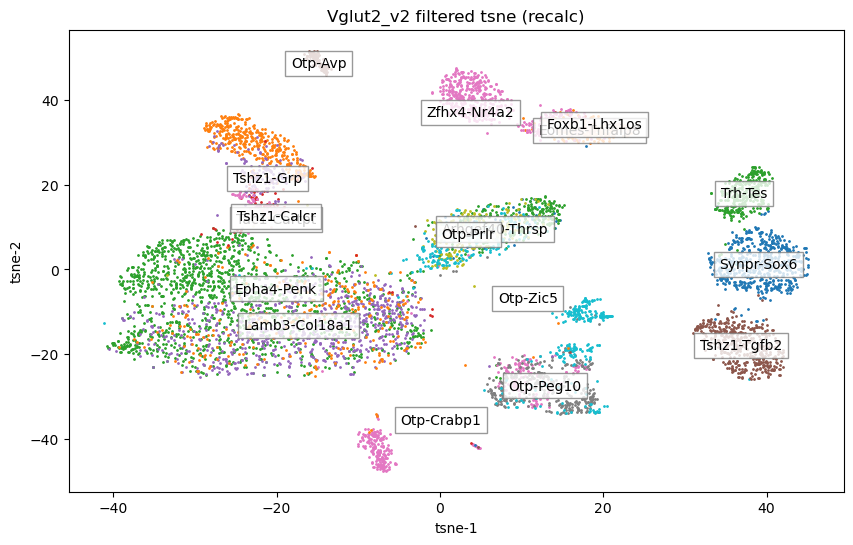

In [ ]:
dp.plot_rc_tsne(Vglut2_meta_data_df_plis_f_markers,Vglut2_arr_tsne_f,'Vglut2_v2', Vglut2_filtered_folder,savefig=True)


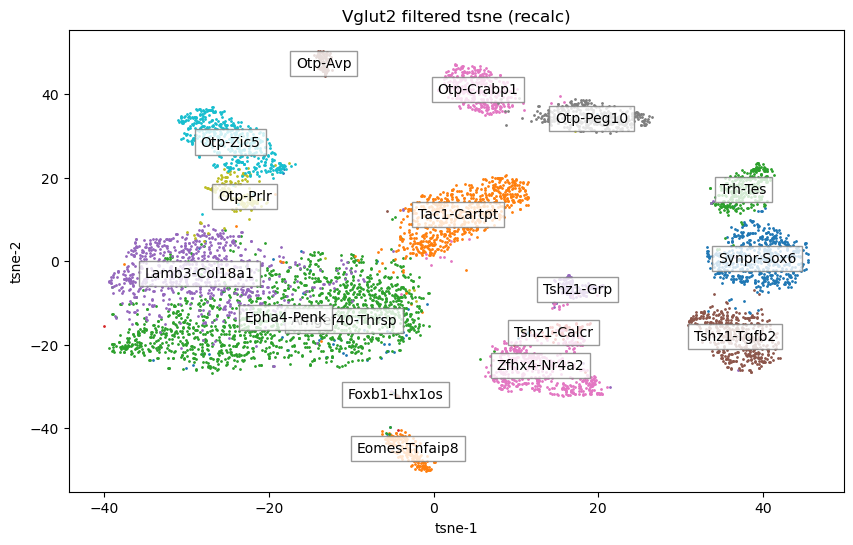

In [168]:
dp.plot_rc_tsne(Vglut2_meta_data_df_plis_filtered_markers,Vglut2_arr_tsne_f,cell_class, Vglut2_filtered_folder,savefig=True)


## 6) Violin Plots


In [330]:
Vglut2_df_plis_filtered.shape

(351, 6788)

In [368]:
np.all(Vglut2_df_marker_f.columns == Vglut2_meta_data_df_plis_f_markers.columns)

True

In [415]:
'Slc17a6' in Vglut2_df_ge.index

False

In [ ]:
Vglut2_adata_f = ad.AnnData(Vglut2_df_marker_f.T)
#or use full gene list to get
#add aligned metadata
for x in Vglut2_meta_data_df_plis_f_markers.index:
    Vglut2_adata_f.obs[str(x)] = Vglut2_meta_data_df_plis_f_markers.loc[str(x),:]

Vglut2_markers = Vglut2_adata_f.obs['markers']
_, idx = np.unique(Vglut2_adata_f.obs['markers'], return_index=True)
Vglut2_markers = list(Vglut2_markers[np.sort(idx)])

/tmp/ipykernel_3115776/1252054059.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Vglut2_markers = list(Vglut2_markers[np.sort(idx)])


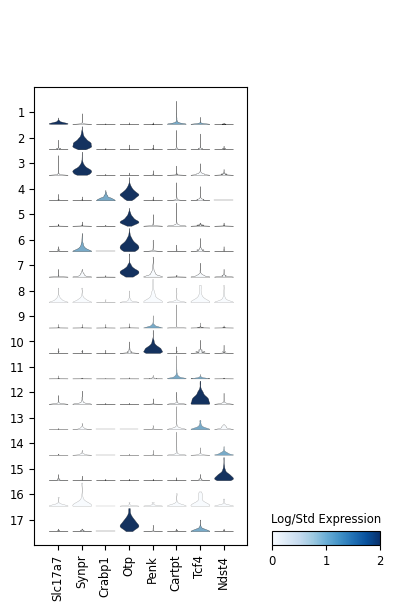

In [418]:
Vglut2_violin_markers = ['Slc17a7','Synpr','Crabp1','Otp','Penk','Cartpt','Tcf4','Ndst4']
sc.settings.figdir = "/bigdata/isaac/Vglut2_files/filtered"
%matplotlib inline
#save = 'Vglut2_violin.pdf'
#for using markers as category labels:
#groupby='markers', categories_order= Vglut2_markers

sc.pl.stacked_violin(Vglut2_adata_f, Vglut2_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width', save = 'Vglut2_violin_clabels.pdf')  
                                                                                                                                                                                                                                        


## Combine, format, and write out metadata

In [474]:
GABA_meta_data_df_plis_f_markers

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,65.0,98.0,102.0,97.0,68.0,64.0,68.0,64.0,99.0,102.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-24,05/31/20,05/31/20,05/31/20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,C57Bl/6,C57Bl/6,C57Bl/6,,,,,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Breeder-M,Breeder-F
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X36,10X51,10X52,10X51,10X37,10X35,10X37,10X35,10X51,10X52
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X36_1,10X51_2,10X52_2,10X51_1,10X37_2,10X35_2,10X37_2,10X35_2,10X51_3,10X52_2
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,DI3,DI-B1-F,DI-B3-F,DI-B1-F,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2",DI-B1-M,DI-B3-F


In [471]:
GABA_meta_data_df_plis_f_markers.shape

(30, 8501)

In [440]:
Vglut1_meta_data_df_plis_f_markers.shape

(30, 9019)

In [441]:
Vglut2_meta_data_df_plis_f_markers.shape

(30, 6788)

In [472]:
combined_metadata = pd.concat((GABA_meta_data_df_plis_f_markers,Vglut1_meta_data_df_plis_f_markers,Vglut2_meta_data_df_plis_f_markers), axis = 1)

In [476]:
combined_metadata.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
lengthbp_seqlib,507.0,440.0,440.0,507.0,474.0,466.0,474.0,416.0,486.0,415.0,...,474.0,474.0,487.0,420.0,420.0,466.0,461.0,478.0,476.0,466.0
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,A2,A2,B2,B9,B9,D12,G8,G1,H8,D12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
cluster_label,1,1,1,1,1,1,1,1,1,1,...,17,17,17,17,17,17,17,17,17,17
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp


In [477]:
#create 'full_name' row that combines last three rows

# Select the last three rows
last_three_rows = combined_metadata.iloc[-3:]

# Combine the entries to create the 'full_name' row
combined_metadata.loc['full_name',:] = (
    last_three_rows.loc['cell_class'] + '-' +
    last_three_rows.loc['cluster_label'].astype(str) + '-' +
    last_three_rows.loc['markers']
)

combined_metadata.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,A2,A2,B2,B9,B9,D12,G8,G1,H8,D12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
cluster_label,1,1,1,1,1,1,1,1,1,1,...,17,17,17,17,17,17,17,17,17,17
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp


In [478]:
#write to file
combined_metadata.to_json('/bigdata/isaac/gaba_glut_combined_metadata_full_name.json')

In [490]:
df_orig.shape

(27933, 79613)

In [492]:
df_orig.loc['mt-Nd4']

AAACCCAAGAGCATAT-1_10X51_2    64
AAACCCAAGCCTCAGC-1_10X51_2    90
AAACCCAAGTACTGTC-1_10X51_2    12
AAACCCACACAACGTT-1_10X51_2    50
AAACCCAGTAACATAG-1_10X51_2    16
                              ..
TTTGTTGCACCGCTGA-1_10X37_2    67
TTTGTTGGTCCATAGT-1_10X37_2    33
TTTGTTGGTTGCGAAG-1_10X37_2    31
TTTGTTGTCGAAGGAC-1_10X37_2    38
TTTGTTGTCTCTGCTG-1_10X37_2    31
Name: mt-Nd4, Length: 79613, dtype: int64

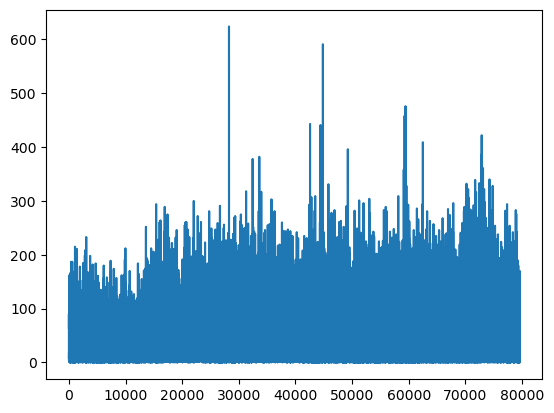

In [494]:
fig,ax = plt.subplots()
ax.plot(np.array(df_orig.loc['mt-Nd4']))
#df_orig.plot.line(x='mt-Nd4')
plt.show()

## Nonneuronal Analysis <a name="nn_analysis"></a>

In [452]:
np.unique(meta_data_df.loc['cell_class'])

array(['Doublet', 'GABA', 'Nonneuronal', 'Vglut1', 'Vglut2'], dtype=object)

## 1) Process (L2)

num m cells: 1338 num f cells: 1658


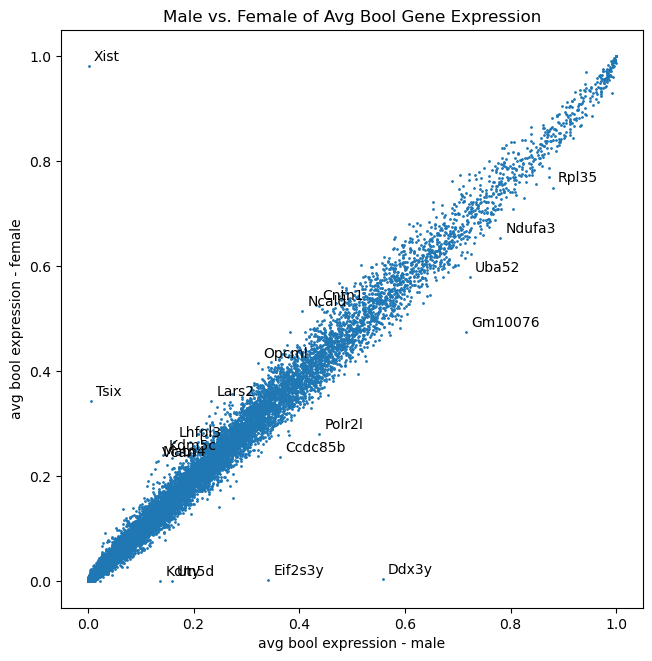

Total genes reduced from 27933 to 14505
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


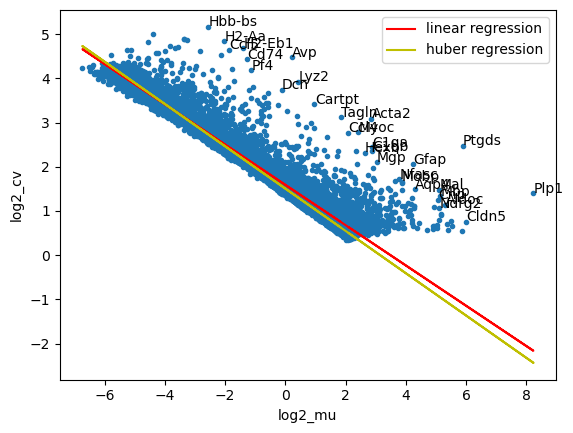

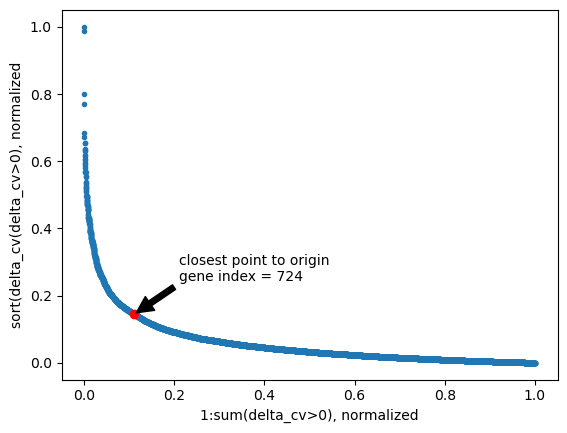

(724, 2996)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


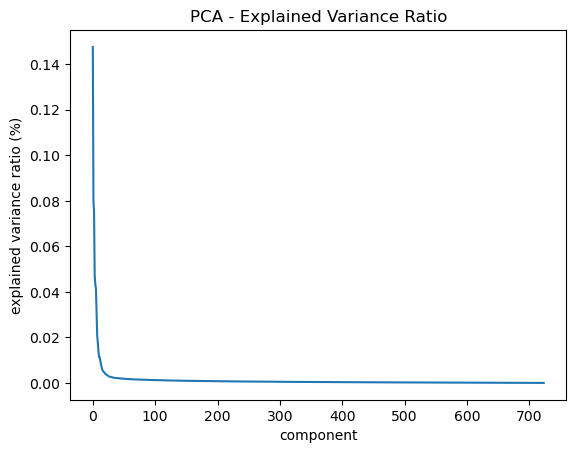

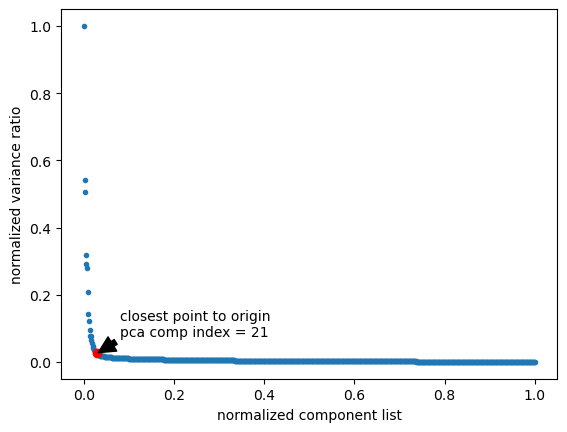

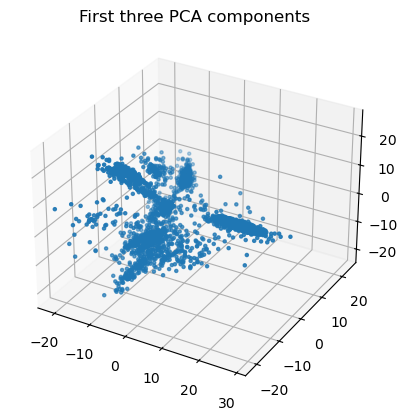

2024-12-13 14:28:17,793 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-13 14:28:18,304 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-13 14:28:18,314 - harmonypy - INFO - Iteration 1 of 20
2024-12-13 14:28:18,978 - harmonypy - INFO - Iteration 2 of 20
2024-12-13 14:28:19,631 - harmonypy - INFO - Iteration 3 of 20
2024-12-13 14:28:20,169 - harmonypy - INFO - Iteration 4 of 20
2024-12-13 14:28:20,816 - harmonypy - INFO - Iteration 5 of 20
2024-12-13 14:28:21,339 - harmonypy - INFO - Iteration 6 of 20
2024-12-13 14:28:21,991 - harmonypy - INFO - Iteration 7 of 20
2024-12-13 14:28:22,257 - harmonypy - INFO - Converged after 7 iterations


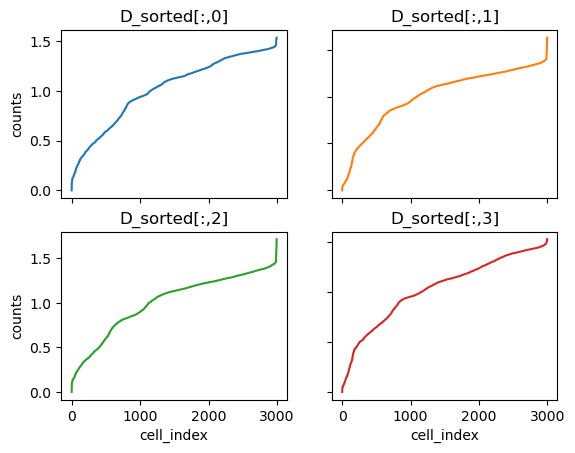

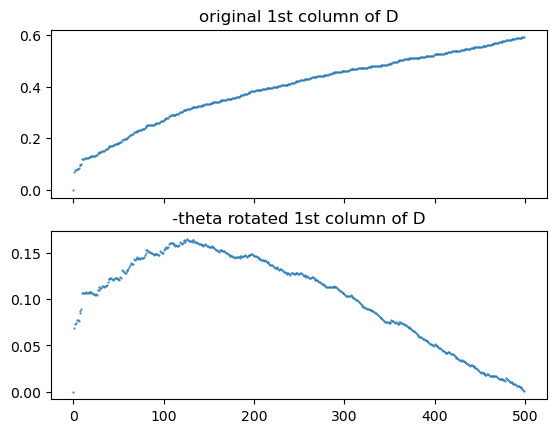

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 75.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


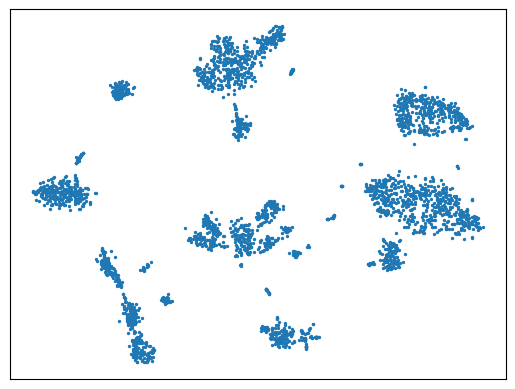

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.5232057607861413

running dbscan with epsilon: 1.5232057607861413  and minpts: 20
Estimated number of clusters: 24
Estimated number of noise points: 245


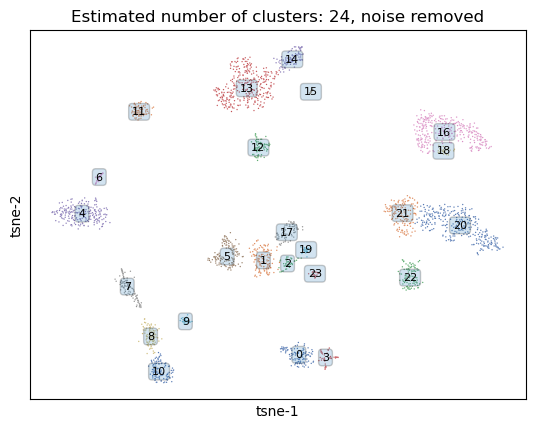

found existing cluster_labels in meta_data_df... removing old labels...
verify raw prelinkage df and raw metadata df have same columns:
[ True  True  True ...  True  True  True]


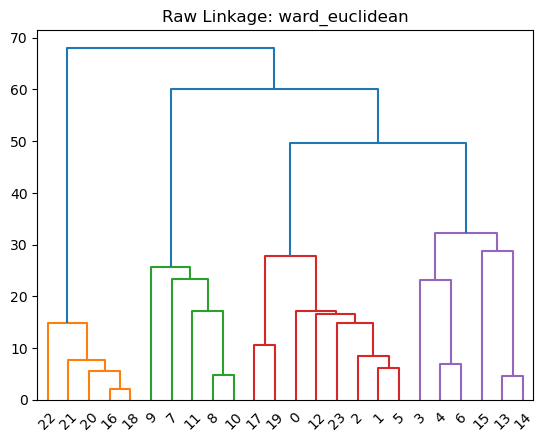

[22 20 18 16 21 15 14 13  6  4  3  0 23  2  1  5 12 17 19  9  8 10 11  7]


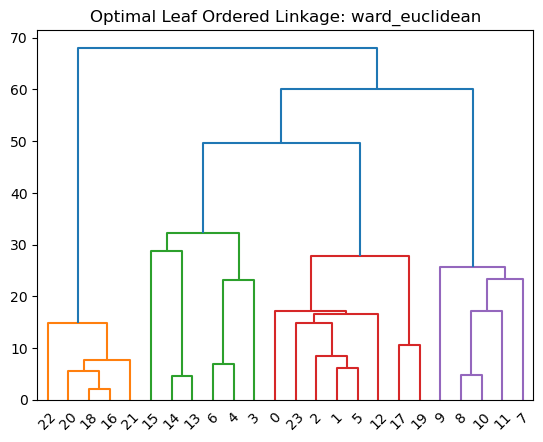

metadata df shape post inter cluster sort
(29, 2751)


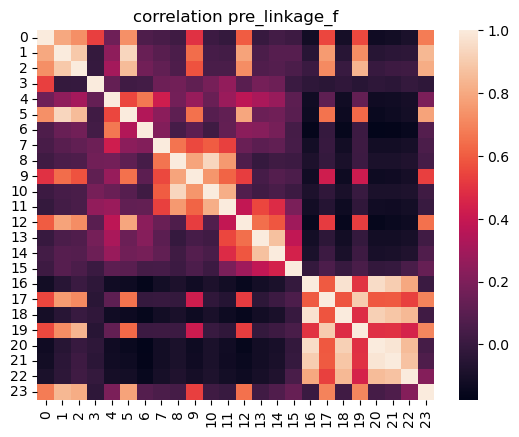

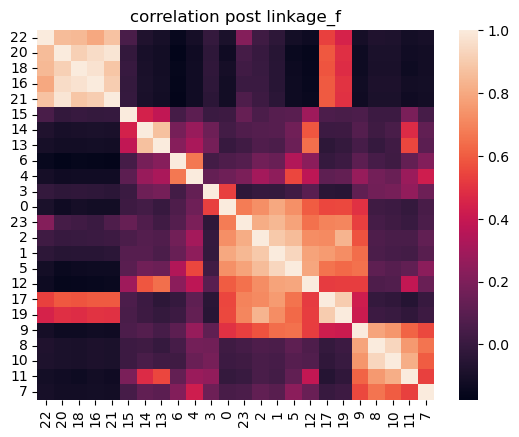

{22: 1, 20: 2, 18: 3, 16: 4, 21: 5, 15: 6, 14: 7, 13: 8, 6: 9, 4: 10, 3: 11, 0: 12, 23: 13, 2: 14, 1: 15, 5: 16, 12: 17, 17: 18, 19: 19, 9: 20, 8: 21, 10: 22, 11: 23, 7: 24}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 164
len marker_genes_sorted_final 164
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 106, 411, 436, 747, 893, 918, 1012, 1338, 1375, 1600, 1657, 1779, 1802, 1844, 1973, 2110, 2190, 2270, 2299, 2333, 2431, 2550, 2637, 2750]
[0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23]
21
[array([ 0, 30, 29, 20,  6, 18,  4]), array([ 9, 23, 14, 24, 25, 12, 13, 10, 11, 27, 22,  8,  7, 28, 26]), array([15, 21, 19, 17, 16]), array([35, 32, 33, 34, 31, 51, 38, 37, 36]), array([39, 42, 41, 40, 43, 44, 45]), array([46, 47, 48, 54, 53, 50, 52

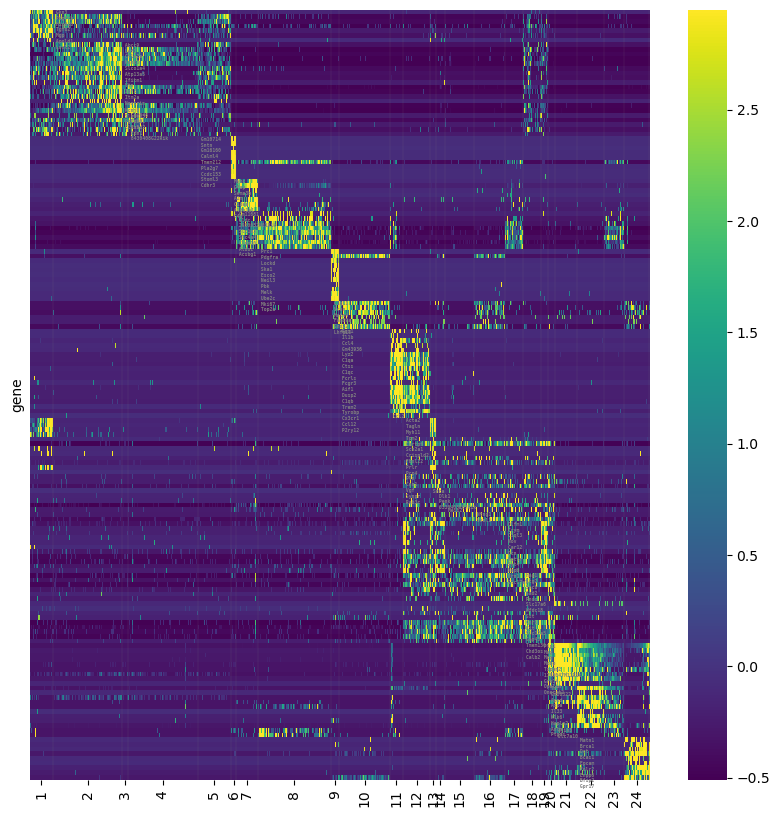

[ True  True  True ...  True  True  True]


In [453]:
%matplotlib inline
#try new process module
NN_folder = '/bigdata/isaac/Nonneuronal_files/'
NN_df_marker, NN_arr_tsne, NN_meta_data_df_plis, NN_linkage_cluster_order, NN_df_marker_log_and_std_col, NN_df_plis, NN_cluster_indices, NN_df_marker_log_and_std, NN_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, NN_folder, 'Nonneuronal')


num m cells: 1338 num f cells: 1658


<IPython.core.display.Javascript object>


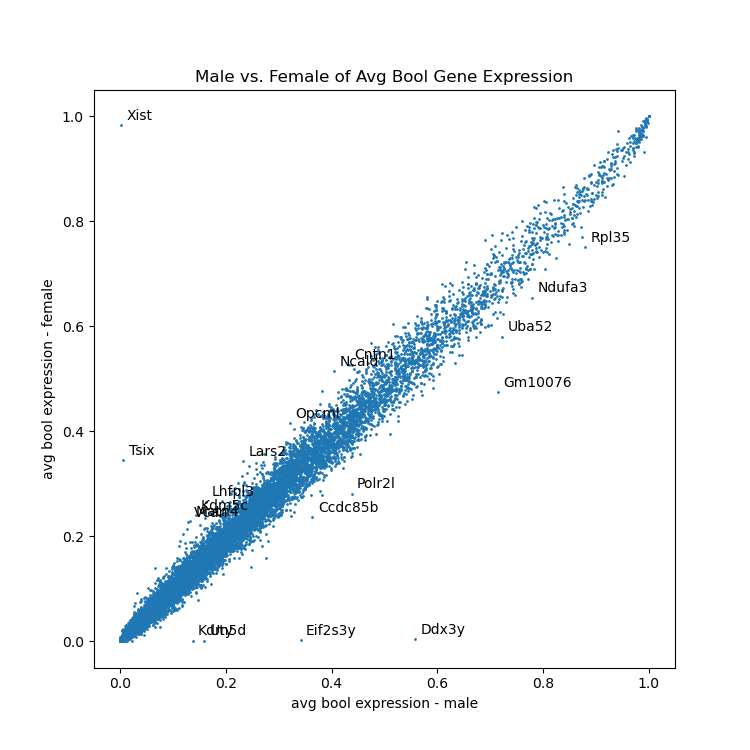

Total genes reduced from 27933 to 14505
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


<IPython.core.display.Javascript object>


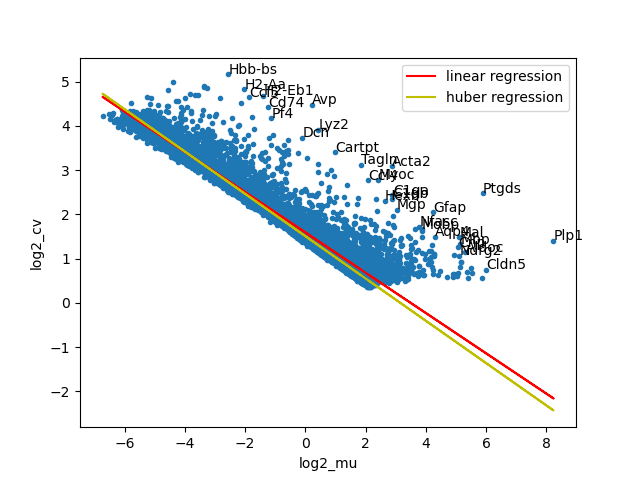

<IPython.core.display.Javascript object>


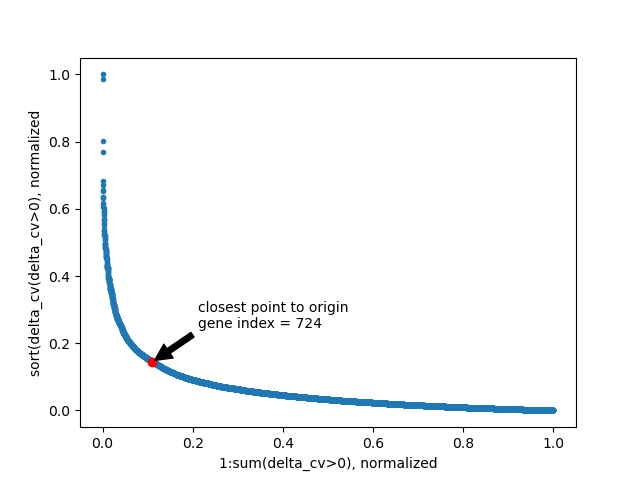

In [1178]:
NN_meta_data_df = meta_data_df.loc[:,meta_data_df.loc['cell_class',:] == 'Nonneuronal']
NN_df = df.loc[:,meta_data_df.loc['cell_class',:] == 'Nonneuronal']
NN_df_bool = NN_df.mask(NN_df>0, other = 1)
NN_avg_bool_mf_df_sorted = dp.avg_bool_gene_expression_by_sex(df_bool = NN_df_bool,
                                                              meta_data_df=NN_meta_data_df,
                                                             num_top_genes=10,
                                                             plot_flag=1)
status_df = dp.intialize_status_df()
status_df.loc['cell_exclusion (l1)',:] = True
NN_df_ge, NN_df_bool, NN_meta_data_df, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                      percent_cell_upper_bound=50,
                                                     df_bool=NN_df_bool,
                                                     df = NN_df,
                                                     meta_data_df = NN_meta_data_df,
                                                     status_df = status_df)
#remove IEG genes
NN_df_ge = dp.gene_remover(IEG_list,NN_df_ge)

#remove sex genes
NN_df_ge = dp.gene_remover(sex_gene_list,NN_df_ge)
                        
NN_cv_df = dp.analyze_cv(df = NN_df_ge,
                      norm_scale_factor=20000,
                      num_top_genes=30,
                      plot_flag=1,
                     use_huber = True)

NN_gene_index, NN_df, status_df = dp.get_top_cv_genes(df = NN_df_ge, cv_df=NN_cv_df, plot_flag=1, status_df=status_df)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


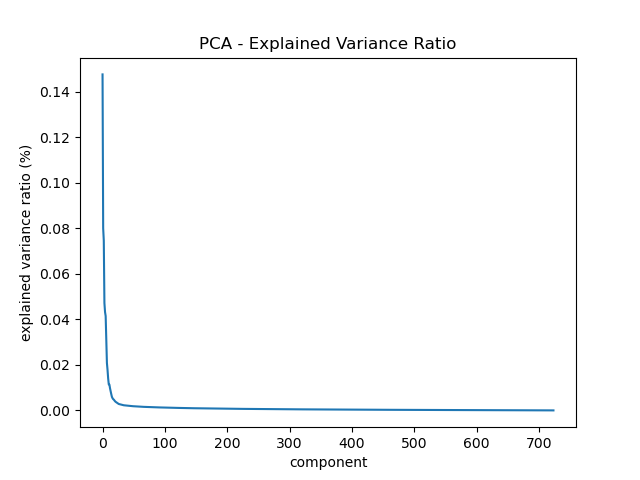

<IPython.core.display.Javascript object>


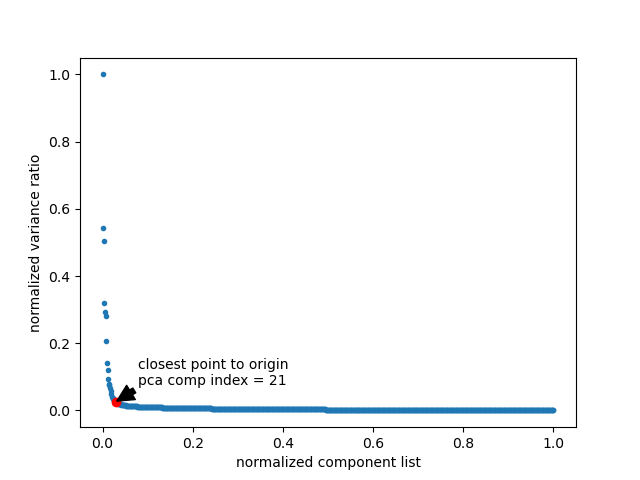

<IPython.core.display.Javascript object>


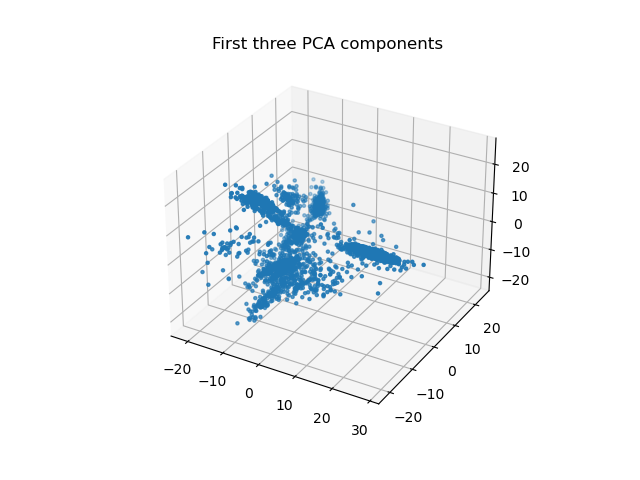

2024-09-02 14:15:08,587 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-09-02 14:15:09,123 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-09-02 14:15:09,133 - harmonypy - INFO - Iteration 1 of 10
2024-09-02 14:15:09,798 - harmonypy - INFO - Iteration 2 of 10
2024-09-02 14:15:10,463 - harmonypy - INFO - Iteration 3 of 10
2024-09-02 14:15:11,023 - harmonypy - INFO - Iteration 4 of 10
2024-09-02 14:15:11,596 - harmonypy - INFO - Iteration 5 of 10
2024-09-02 14:15:12,051 - harmonypy - INFO - Iteration 6 of 10
2024-09-02 14:15:12,622 - harmonypy - INFO - Iteration 7 of 10
2024-09-02 14:15:12,850 - harmonypy - INFO - Converged after 7 iterations


In [1179]:
NN_log_std_arr,status_df = dp.log_and_standerdize_df(NN_df,status_df)
NN_df_ls = pd.DataFrame(data = NN_log_std_arr.T, index = NN_df.index, columns=NN_df.columns)

NN_pca_index, NN_arr_pca, status_df = dp.analyze_pca(arr = NN_log_std_arr, #log_std_arr
                                               n_components=NN_log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

NN_meta_data_df_pca = NN_meta_data_df.T.copy()

vars_use = ['SampleID']
ho = hm.run_harmony(NN_arr_pca,NN_meta_data_df_pca,vars_use)

In [1372]:
NN_log_std_arr.shape

(2996, 724)

<IPython.core.display.Javascript object>


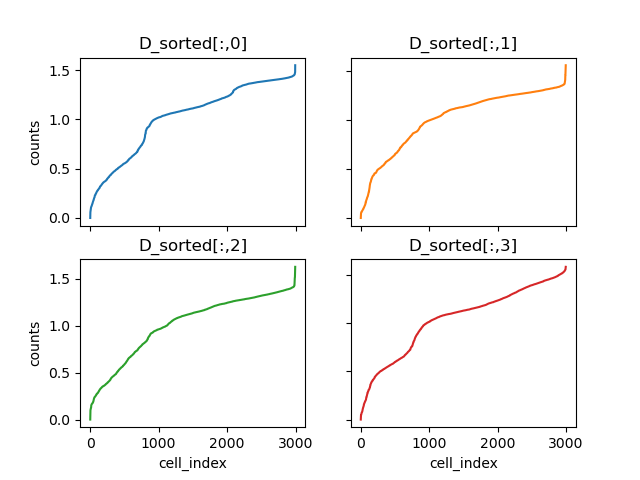

<IPython.core.display.Javascript object>


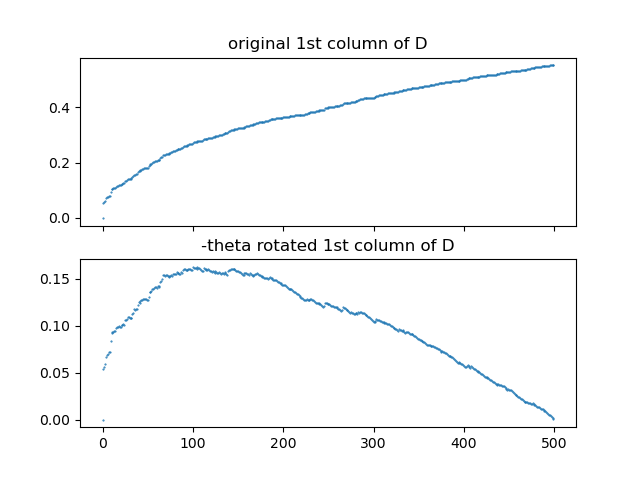

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 73.0


<IPython.core.display.Javascript object>


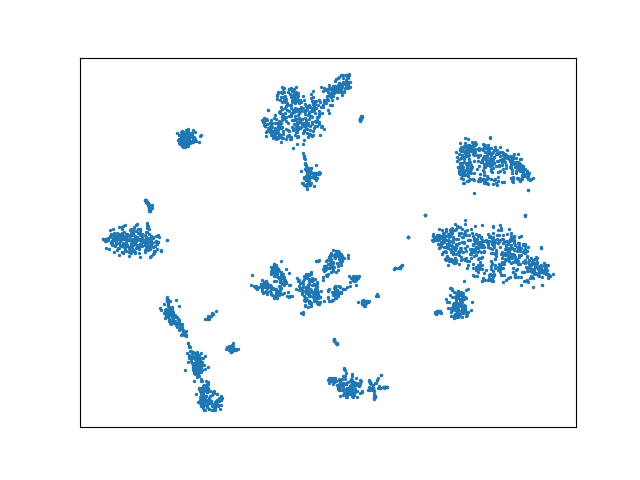

In [1180]:
NN_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = NN_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

NN_arr_tsne,status_df = dp.do_tsne(arr = NN_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

params for dbscan
minpts:  20
epsilon percentile 50
epsilon:  1.3821311541865091

running dbscan with epsilon: 1.3821311541865091  and minpts: 20
Estimated number of clusters: 28
Estimated number of noise points: 414


<IPython.core.display.Javascript object>


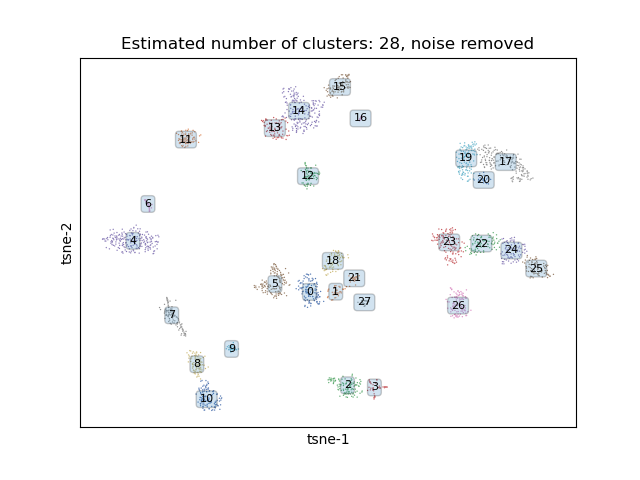

params for dbscan
minpts:  20
epsilon percentile 55
epsilon:  1.428427615798894

running dbscan with epsilon: 1.428427615798894  and minpts: 20
Estimated number of clusters: 27
Estimated number of noise points: 360


<IPython.core.display.Javascript object>


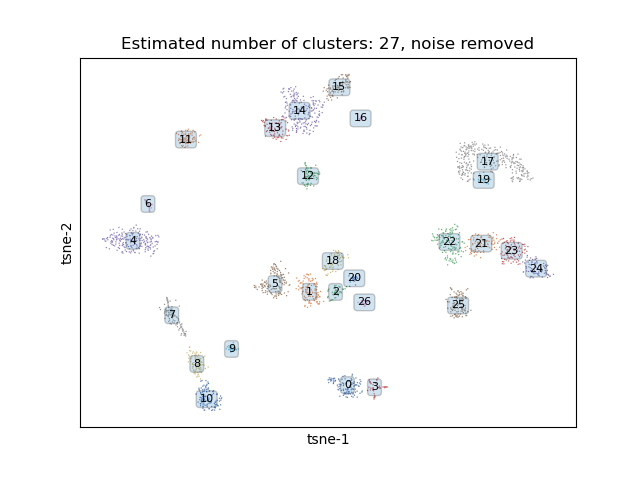

params for dbscan
minpts:  20
epsilon percentile 60
epsilon:  1.47912656605168

running dbscan with epsilon: 1.47912656605168  and minpts: 20
Estimated number of clusters: 27
Estimated number of noise points: 301


<IPython.core.display.Javascript object>


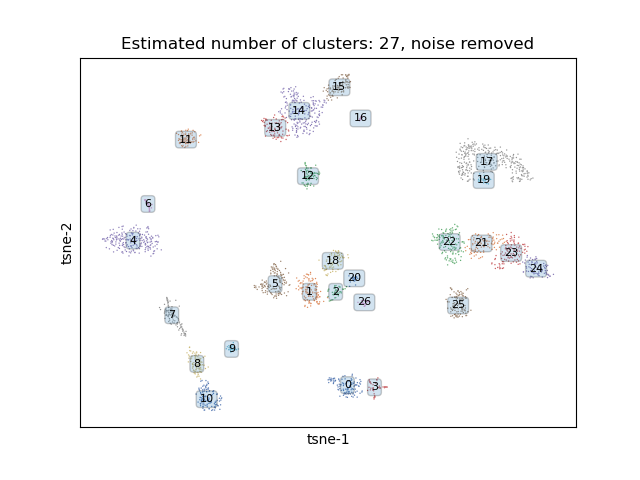

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.5540547281204917

running dbscan with epsilon: 1.5540547281204917  and minpts: 20
Estimated number of clusters: 24
Estimated number of noise points: 240


<IPython.core.display.Javascript object>


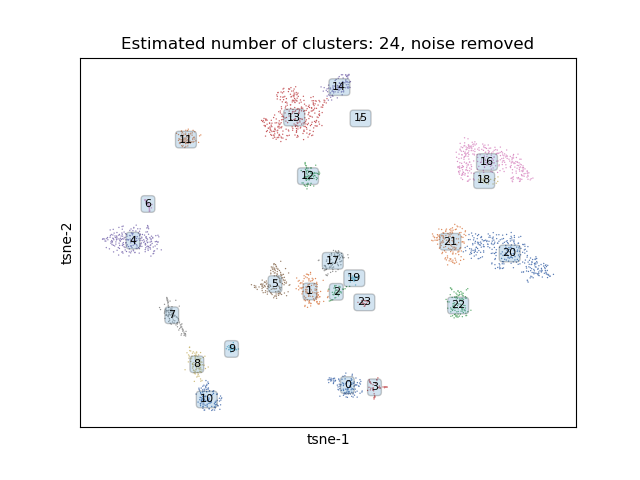

params for dbscan
minpts:  20
epsilon percentile 70
epsilon:  1.6198400566289304

running dbscan with epsilon: 1.6198400566289304  and minpts: 20
Estimated number of clusters: 26
Estimated number of noise points: 178


<IPython.core.display.Javascript object>


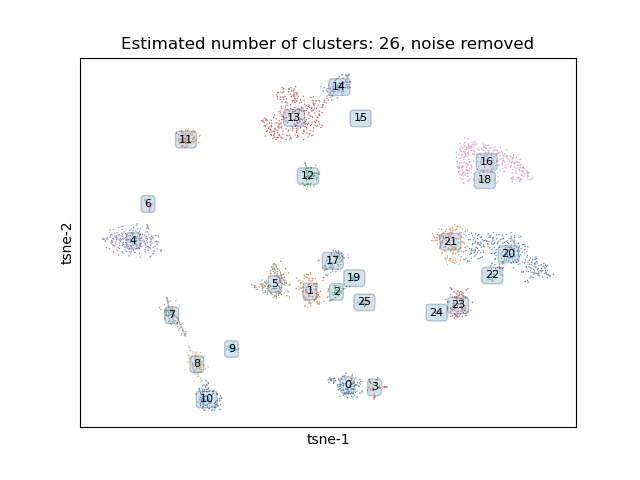

params for dbscan
minpts:  20
epsilon percentile 75
epsilon:  1.6970771477130742

running dbscan with epsilon: 1.6970771477130742  and minpts: 20
Estimated number of clusters: 21
Estimated number of noise points: 158


<IPython.core.display.Javascript object>


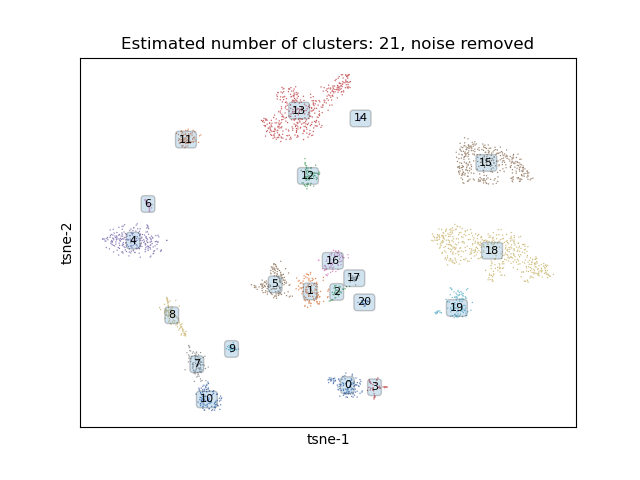

In [1181]:
for e in range(50,80,5):
    epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=e, arr= NN_arr_tsne, status_df = status_df)
    labels,n_clusters, arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = NN_arr_tsne, status_df = status_df)

In [126]:
############################## OPTIMAL EPS_PRC VALUE FROM PLOTS ABOVE? ################# [RESUME HERE]

params for dbscan
minpts:  20
epsilon percentile 75
epsilon:  1.6970771477130742

running dbscan with epsilon: 1.6970771477130742  and minpts: 20
Estimated number of clusters: 21
Estimated number of noise points: 158


<IPython.core.display.Javascript object>


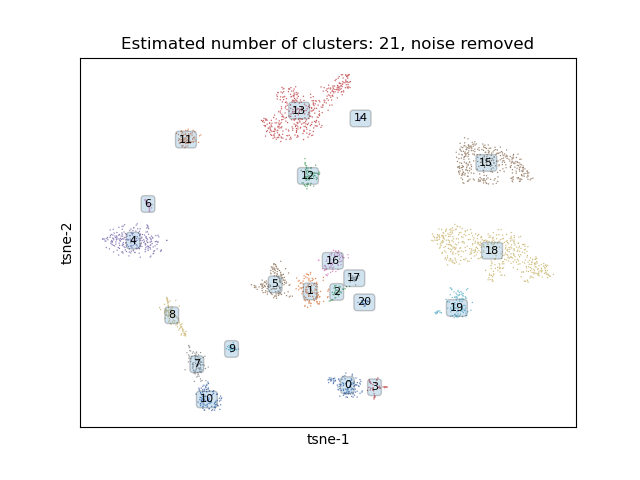

In [1182]:
epsilon, minpts, status_df = dp.compute_eps(minpts = 20, eps_prc=75, arr= NN_arr_tsne, status_df = status_df)
NN_labels,n_clusters, NN_arr, status_df = dp.do_dbscan(epsilon = epsilon, minpts = minpts, arr = NN_arr_tsne, status_df = status_df)

In [1185]:
NN_df_pre_linkage_ls, NN_meta_data_df_pre_linkage, NN_unique_labels = dp.sort_by_cluster_label(NN_df_ls,
                                                                               NN_meta_data_df,
                                                                               NN_arr,
                                                                               NN_labels)

In [1186]:
today

'2024-09-02'

In [1187]:
## CHECKPOINT - SAVE FILES
folder = '/bigdata/isaac/Nonneuronal_files/'
file1 = 'NN_df_pre_linkage_ls_' + today
file2 = 'NN_meta_data_df_pre_linkage_' + today
file3 = 'NN_unique_labels_' + today 



NN_df_pre_linkage_ls.to_feather(folder+file1+'.feather')
NN_meta_data_df_pre_linkage.to_json(folder+file2+'.json')
np.save(folder+file3 +'.npy', NN_unique_labels)

#NN_df_pre_linkage_ls = pd.read_feather(folder + 'NN_df_pre_linkage_ls_2024-06-06.feather')
#NN_meta_data_df_pre_linkage = pd.read_json(folder + 'NN_meta_data_df_pre_linkage_2024-06-06.json')
#NN_unique_labels = np.load(folder+'NN_unique_labels_2024-06-06.npy')

In [991]:
linkage_alg = 'ward'
dist_metric = 'euclidean'

<IPython.core.display.Javascript object>


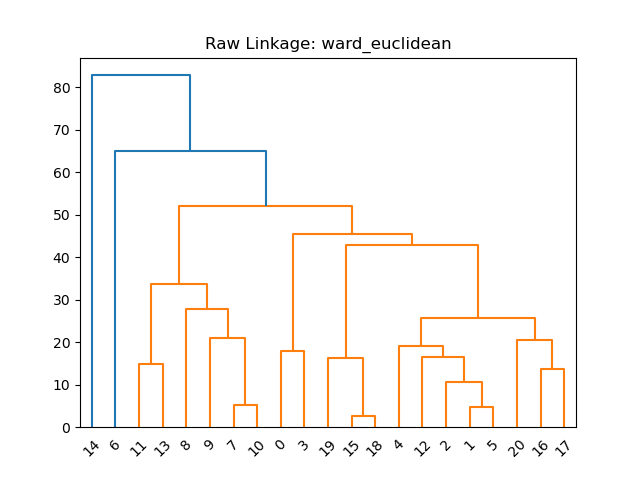

[14  6  0  3 19 18 15 20 17 16 12  5  1  2  4 13 11 10  7  9  8]


<IPython.core.display.Javascript object>


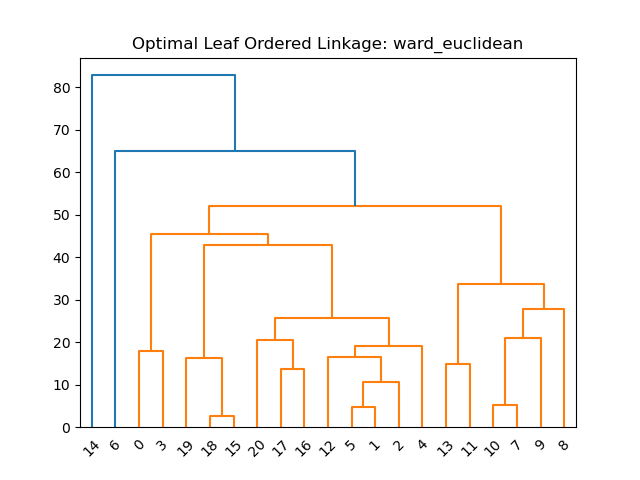

In [1190]:
NN_df_post_linkage, NN_meta_data_df_post_linkage, linkage_cluster_order_og, Z_ordered, mpg_pca, linkage_cluster_order_po = dp.inter_cluster_sort(NN_df_pre_linkage_ls,
                                                 NN_meta_data_df_pre_linkage, 
                                                 NN_unique_labels,
                                                 n_components = 10, 
                                                 linkage_alg = linkage_alg,
                                                 dist_metric = dist_metric)

<IPython.core.display.Javascript object>


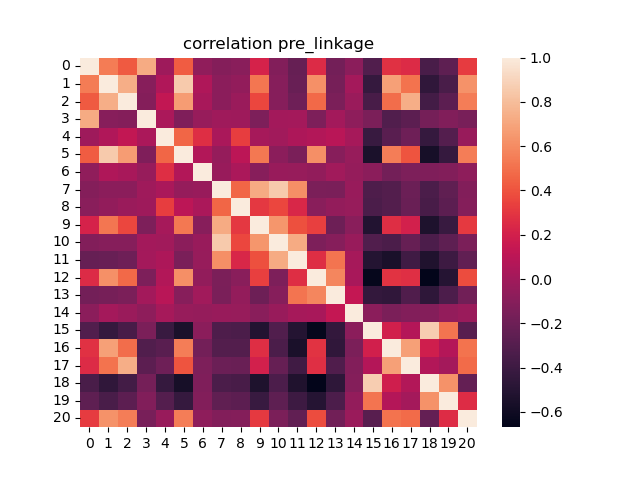

In [1191]:
mpg_pca_df = pd.DataFrame(data = mpg_pca)
plt.figure()
ax = sns.heatmap(mpg_pca_df.corr(method='pearson'))
plt.title('correlation pre_linkage')
plt.show()

In [1192]:
folder

'/bigdata/isaac/Nonneuronal_files/'

<IPython.core.display.Javascript object>


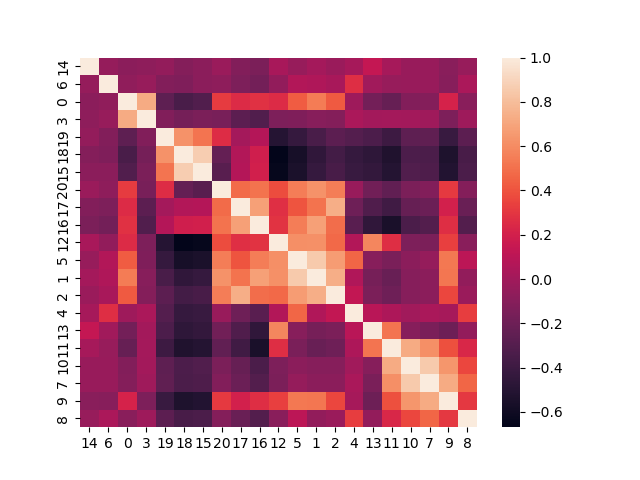

In [1193]:
mpg_pca_pl_df = mpg_pca_df.reindex(columns = linkage_cluster_order_og)
plt.figure()
ax = sns.heatmap(mpg_pca_pl_df.corr(method='pearson'), yticklabels=True, xticklabels=True)
plt.title('correlation post linkage')
plt.savefig(folder + 'mpg_pca_corr_post_linkage')
plt.show()

In [1194]:
## Save files
folder = '/bigdata/isaac/Nonneuronal_files/'
file1 = 'NN_df_' + today
file2 = 'NN_df_post_linkage_' + today

NN_df.to_feather(folder+file1+'.feather')
NN_df_post_linkage.to_feather(folder+file2+'.feather')

#load below along with files from prev checkpoint 

In [1195]:
NN_df_s = NN_df.reindex(columns = NN_df_post_linkage.columns)

In [1196]:
NN_df_post_linkage_intra_sorted, NN_meta_data_df_plis_og, cluster_indices = dp.intra_cluster_sort(NN_df_s, 
                                                                                              NN_meta_data_df_post_linkage, 
                                                                                              linkage_cluster_order_og)

### NEW - update cluster labels, linkage cluster order to be sequential

In [1197]:
NN_meta_data_df_plis,linkage_cluster_order = dp.update_metadata_cluster_labels(linkage_cluster_order_og,NN_meta_data_df_plis_og)

{14: 1, 6: 2, 0: 3, 3: 4, 19: 5, 18: 6, 15: 7, 20: 8, 17: 9, 16: 10, 12: 11, 5: 12, 1: 13, 2: 14, 4: 15, 13: 16, 11: 17, 10: 18, 7: 19, 9: 20, 8: 21}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20]


In [1221]:
NN_marker_genes_sorted, NN_pos, NN_ind, NN_ind_s, NN_mgs = dp.compute_marker_genes(NN_df_post_linkage_intra_sorted,
                                                NN_meta_data_df_plis,
                                                cluster_indices,
                                                linkage_cluster_order,
                                                n_markers=5)

len marker_genes_sorted_final 149


/home/isaac/analysis/scRNA-seq/dimorph_processing.py:709: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0_ind_arr = np.column_stack((xi0_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:714: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  xi0p5_ind_arr = np.column_stack((xi0p5_df.iloc[:,i].sort_values(ascending=False).index for i in range(len(xi0p5_df.columns))))
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:719: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is

In [1222]:
NN_df_marker = NN_df_post_linkage_intra_sorted.loc[NN_marker_genes_sorted,:]
NN_marker_log_and_std_arr, status_df = dp.log_and_standerdize_df(NN_df_marker,status_df, log = False)
NN_df_marker_log_and_std = pd.DataFrame(index = NN_df_marker.index, 
                                          columns=NN_df_post_linkage_intra_sorted.columns, 
                                          data = NN_marker_log_and_std_arr.T)
NN_df_marker_log_and_std_col = pd.DataFrame(data = NN_df_marker_log_and_std.to_numpy(), 
                                         index = NN_df_marker_log_and_std.index,
                                        columns = list(NN_meta_data_df_plis.loc['cluster_label',:]))
NN_change_indices = dp.get_heatmap_cluster_borders(NN_meta_data_df_plis)
NN_tg, NN_tgfs = dp.get_heatmap_labels(NN_mgs, NN_ind, NN_ind_s)
fs_w = dp.compute_fs_waterfall(NN_marker_genes_sorted)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 25, 62, 184, 241, 367, 854, 1197, 1220, 1249, 1331, 1412, 1553, 1682, 1721, 1956, 2384, 2471, 2589, 2690, 2724, 2837]


In [1223]:
fs_w

3.9

In [1202]:
folder

'/bigdata/isaac/Nonneuronal_files/'

In [1201]:
linkage_cluster_order

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21])

<IPython.core.display.Javascript object>


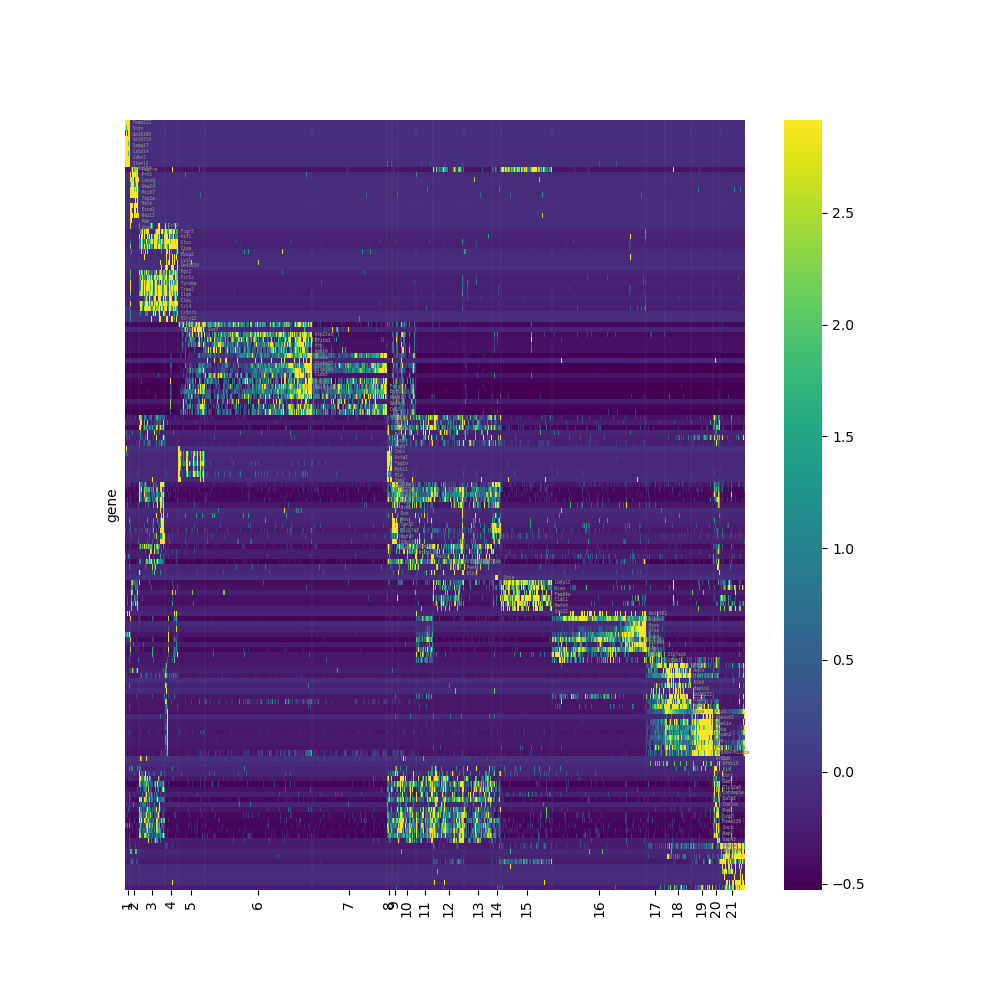

In [1206]:
dp.plot_marker_heatmap(NN_df_marker_log_and_std_col, 
                       NN_pos, 
                       linkage_cluster_order, 
                       NN_change_indices, 
                       NN_tg, 
                       NN_tgfs, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       fs_waterfall=fs_w-0.7,
                       savefig = True,
                       cell_class = 'NN')

In [1207]:
for c,g in zip(linkage_cluster_order,NN_tg):
    print (c,g)

1 ['Tmem212', 'Sntn', 'Gm16160', 'Gm10714', 'Spag17', 'Calml4', 'Cdhr3', 'Stoml3', 'Ccdc153']
2 ['Pdgfra', 'Prc1', 'Lockd', 'Ube2c', 'Mki67', 'Top2a', 'Melk', 'Esco2', 'Neil3', 'Pbk', 'Ska1']
3 ['Ccl2']
4 ['Fcgr3', 'Aif1', 'Ctss', 'C1qa', 'Dusp2', 'Lyz2', 'Gm43936', 'Rgs1', 'Fcrls', 'Tyrobp', 'Trem2', 'C1qb', 'C1qc', 'Ccl4', 'Cx3cr1', 'P2ry12', 'Ccl12', 'Il1b']
5 ['Higd1b', 'Gkn3']
6 ['Atp13a5', 'Ifitm1', 'Vtn', 'Abcc9', 'Itm2a', 'Slc6a13', 'Slco1a4', 'Cldn5', 'Kcnj8', 'Nostrin']
7 ['Foxq1', 'Egfl7', 'Kank3', 'Gm9946', 'Cd93', 'Lef1']
8 ['Rab3c', 'Vgf', 'Scn2a1', 'Prlr', 'Synpr', 'Pcp4', 'Cnn1', 'Acta2', 'Tagln', 'Myh11', 'Pln', 'Tpm2', 'Fbxl22']
9 ['Olfm1', 'Napb', 'Snap25', 'Syt4', 'Nrn1', 'Dcn', 'Nov', 'Car12', 'Slc17a7', 'Nptxr', 'C1ql3', 'Crym']
10 ['Vsnl1', 'Ntng1']
11 ['Meis2']
12 ['6330403K07Rik', 'Penk', 'Dlk1']
13 []
14 ['Snca']
15 ['Lhfpl3', 'Vcan', 'Fam89a', 'C1ql1', 'Matn4', 'Snx22']
16 ['Gm11681', 'Aldoc', 'Myoc', 'Gfap', 'Aqp4', 'Slc4a4', 'C4b', 'Ntsr2']
17 ['Slc7a10', '

In [1211]:
## save final marker df, associated meta data to file. 
folder = '/bigdata/isaac/Nonneuronal_files/'
file1 = 'NN_df_marker_log_and_std' + today
file2 = 'NN_meta_data_df_plis' + today


NN_df_marker_log_and_std.to_feather(folder+file1+'.feather')
#error with string columns in metadata prevents saving as feather
#NN_meta_data_df_plis.to_feather(folder+file2+'.feather')
NN_meta_data_df_plis.to_json(folder+file2+'.json')

#get non-log marker df, since amy df is non log
file = 'NN_df_marker_' + today
NN_df_marker.to_feather(folder+file+'.feather')

#also save dict with clusters and markers for each clusters
file4 = 'NN_cl_mg_dict_' + today

#need to convert linkage cluster order to int (from int32) in order to store/write out dict
lco_int = [int(x) for x in linkage_cluster_order]
#store in dict
NN_cl_mg_dict = dict(map(lambda i,j : (i,j) , lco_int,NN_tg))



In [ ]:
#write dict to file
with open(folder+file4+'.json', "w") as outfile: 
    json.dump(NN_cl_mg_dict, outfile)
    
np.save(folder + 'NN_pos_' + today, NN_pos)
np.save(folder + 'NN_change_indices_' + today, NN_change_indices)
np.save(folder + 'NN_cluster_indices_' + today, np.array(cluster_indices,dtype=object))

### manual review of heatmap to determine clusters to drop

In [258]:
#first pass, not genes in gene list, need to re run drop_clusters() and filter_heatmap_elements() if specific genes are added to be dropped

In [1218]:
len(NN_tg)

20

In [1284]:
#3.9- add clusters to drop, rebuild NN_cl_mg_dict first
#need to convert linkage cluster order to int (from int32) in order to store/write out dict
lco_int = [int(x) for x in linkage_cluster_order]
#store in dict
NN_cl_mg_dict = dict(map(lambda i,j : (i,j) , lco_int,NN_tg))

In [1285]:
NN_cl_mg_dict

{1: ['Tmem212',
  'Sntn',
  'Gm16160',
  'Gm10714',
  'Spag17',
  'Calml4',
  'Cdhr3',
  'Stoml3',
  'Ccdc153'],
 2: ['Pdgfra',
  'Prc1',
  'Lockd',
  'Ube2c',
  'Mki67',
  'Top2a',
  'Melk',
  'Esco2',
  'Neil3',
  'Pbk',
  'Ska1'],
 3: ['Ccl2'],
 4: ['Fcgr3',
  'Aif1',
  'Ctss',
  'C1qa',
  'Dusp2',
  'Lyz2',
  'Gm43936',
  'Rgs1',
  'Fcrls',
  'Tyrobp',
  'Trem2',
  'C1qb',
  'C1qc',
  'Ccl4',
  'Cx3cr1',
  'P2ry12',
  'Ccl12',
  'Il1b'],
 5: ['Higd1b', 'Gkn3'],
 6: ['Atp13a5',
  'Ifitm1',
  'Vtn',
  'Abcc9',
  'Itm2a',
  'Slc6a13',
  'Slco1a4',
  'Cldn5',
  'Kcnj8',
  'Nostrin'],
 7: ['Foxq1', 'Egfl7', 'Kank3', 'Gm9946', 'Cd93', 'Lef1'],
 8: ['Rab3c',
  'Vgf',
  'Scn2a1',
  'Prlr',
  'Synpr',
  'Pcp4',
  'Cnn1',
  'Acta2',
  'Tagln',
  'Myh11',
  'Pln',
  'Tpm2',
  'Fbxl22'],
 9: ['Olfm1',
  'Napb',
  'Snap25',
  'Syt4',
  'Nrn1',
  'Dcn',
  'Nov',
  'Car12',
  'Slc17a7',
  'Nptxr',
  'C1ql3',
  'Crym'],
 10: ['Vsnl1', 'Ntng1'],
 11: ['Meis2'],
 12: ['6330403K07Rik', 'Penk', 'Dlk1'

In [1286]:
clusters_to_drop = dp.drop_clusters(NN_cl_mg_dict, ['Higd1b','Slc17a6','Olfm1','Vsnl1','Meis2','6330403K07Rik','Snca','Slc7a10'])
clusters_to_drop

[5, 9, 10, 11, 12, 13, 14, 17, 20]

In [1232]:
folder

'/bigdata/isaac/Nonneuronal_files/'

In [1287]:
NN_df_marker_log_and_std_filtered, NN_df_marker_log_and_std_col_filtered, NN_meta_data_df_plis_filtered, pos_filtered_tmp, tg_filtered, tgfs_filtered, linkage_cluster_order_filtered,linkage_cluster_order_filtered_tmp, change_indices_filtered,NN_cl_mg_dict_filtered  = dp.filter_heatmap_elements(folder, 'NN', clusters_to_drop,
                                                                                                                                                                                                                 NN_df_marker_log_and_std,
                                                                                                                                                                                                                 NN_meta_data_df_plis,
                                                                                                                                                                                                                 cluster_indices,
                                                                                                                                                                                                                 NN_cl_mg_dict,
                                                                                                                                                                                                                 save_to_file = True)

Indices where the value changes: [0, 25, 62, 184, 241, 728, 1071, 1094, 1329, 1757, 1875, 1975]
change_indices_filtered [25, 62, 184, 241, 728, 1071, 1094, 1329, 1757, 1875, 1975]
11
{1: 1, 2: 2, 3: 3, 4: 4, 6: 5, 7: 6, 8: 7, 15: 8, 16: 9, 18: 10, 19: 11}
[1 2 3 4 6 7 8 15 16 18 19]


In [1234]:
folder

'/bigdata/isaac/Nonneuronal_files/'

<IPython.core.display.Javascript object>


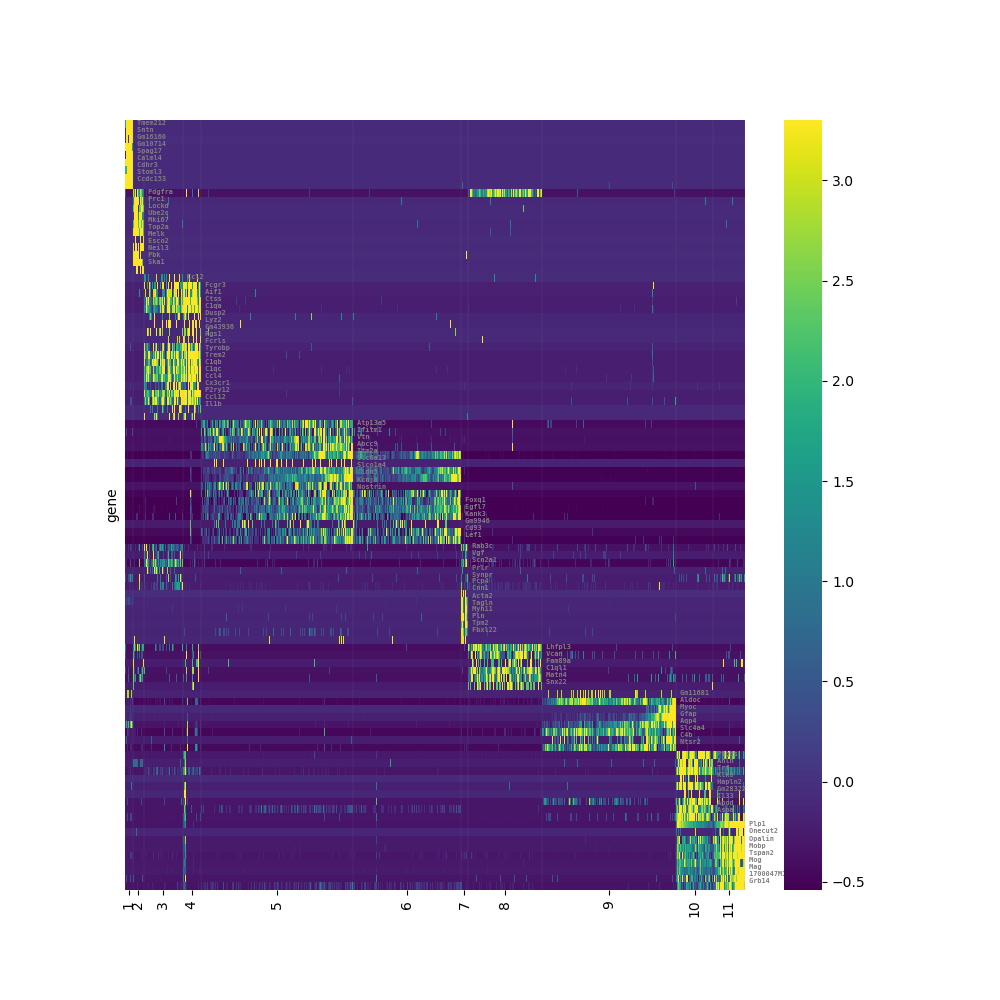

In [1294]:
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(NN_df_marker_log_and_std_col_filtered, 
                       pos_filtered_tmp, 
                       linkage_cluster_order_filtered, 
                       change_indices_filtered, 
                       tg_filtered, 
                       tgfs_filtered, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       fs_waterfall = fs_w+1,
                       savefig = True,
                       cell_class = 'NN_filtered_')

 Check perivascular markers 

In [1240]:
pvm_markers = ['Mrc1','Hexb','Pf4']

In [1265]:
print (NN_df.shape)
for m in pvm_markers:
    if m in NN_df.index:
        pass
    else:
        print (m, ' not found in NN index')

(27933, 2996)


In [1266]:
print (NN_df_ge.shape)
for m in pvm_markers:
    if m in NN_df_ge.index:
        pass
    else:
        print (m, ' not found in NN index')

(14451, 2996)


In [1267]:
print (NN_df_post_linkage_intra_sorted.shape)
for m in pvm_markers:
    if m in NN_df_post_linkage_intra_sorted.index:
        pass
    else:
        print (m, ' not found in NN index')

(724, 2838)


In [1268]:
print (NN_df_marker.shape)
for m in pvm_markers:
    if m in NN_df_marker.index:
        pass
    else:
        print (m, ' not found in NN index')

(149, 2838)
Mrc1  not found in NN index
Hexb  not found in NN index
Pf4  not found in NN index


<IPython.core.display.Javascript object>


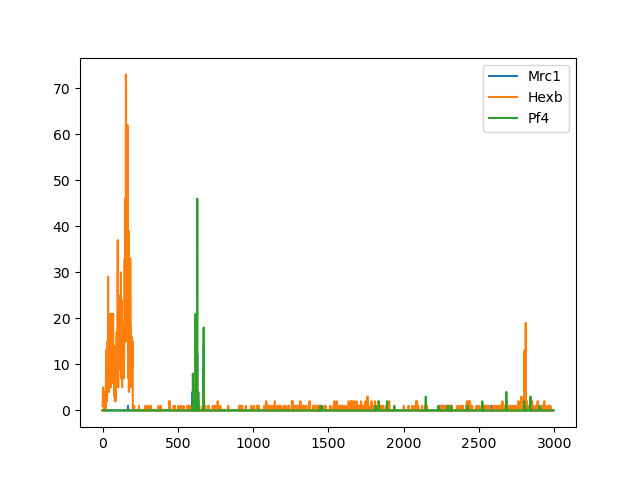

In [1243]:
fig, ax = plt.subplots()
for m in pvm_markers:    
    plt.plot(np.array(NN_df.loc[m,:]), label = m)

plt.legend()
plt.show()

In [1308]:
NN_df.shape

(27933, 2996)

In [ ]:
## check cluster 6 - peri vs endothelial markers

In [1319]:
peri = ['Pdgfrb', 'Rgs5', 'Acta2', 'Anpep', 'Mcam', 'Cspg4', 'Des', 'Vtn', 'Abcc9']
endo = ['Cldn5', 'Pecam1', 'Flt1', 'Vwf', 'Cdh5', 'Tie1', 'Icam2', 'Nos3', 'Cd34']

In [1320]:
for m in endo:
    if m not in NN_df.index:
        print ('marker not found', m)
    else:
        print ('marker found', m)

marker found Cldn5
marker found Pecam1
marker found Flt1
marker found Vwf
marker found Cdh5
marker found Tie1
marker found Icam2
marker found Nos3
marker found Cd34


column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


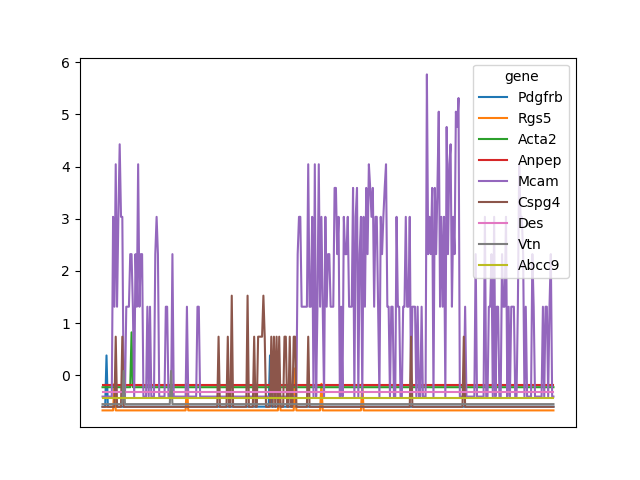

In [1466]:
dp.plot_genes_in_cluster(NN_df,NN_meta_data_df_plis_filtered,peri, 6,ls=True)

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


<IPython.core.display.Javascript object>


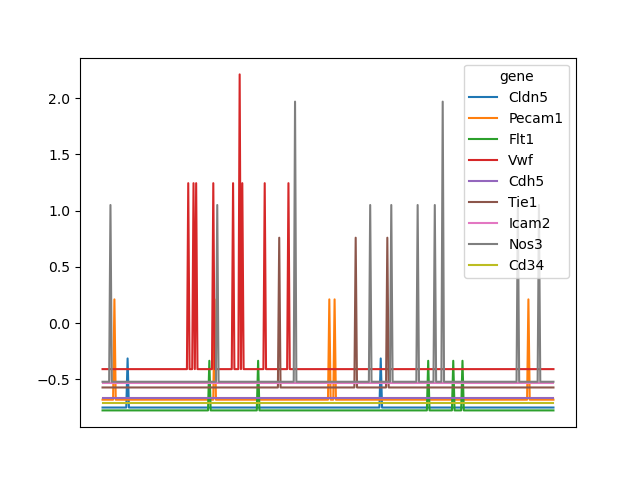

In [1465]:
dp.plot_genes_in_cluster(NN_df,NN_meta_data_df_plis_filtered,endo,6,ls=True)

In [ ]:
dp.log_and_standerdize_df(NN_df)

(27933, 2996)

In [1370]:
NN_df_ls.shape

(724, 2996)

In [1244]:
avg_NN_df_plis = dp.compute_avg_expr_per_cluster_label(NN_df_post_linkage, NN_meta_data_df_plis)

## Add cluster/corr labels from cell comparision nb 

In [3]:
folder = '/bigdata/isaac/Nonneuronal_files/'
with open(folder + 'NN_cl_ct2024-09-09.json') as json_data:
    NN_cl_ct = json.load(json_data)

In [8]:
NN_cl_ct = {int(k): v for k, v in NN_cl_ct.items()}

In [9]:
NN_cl_ct

{1: 'Epend',
 2: 'Proliferating_Cells',
 3: 'Microglia_1',
 4: 'Microglia_2',
 5: 'Peri_1',
 6: 'Peri_2',
 7: 'VSM',
 8: 'OPC',
 9: 'Astro',
 10: 'OL_1',
 11: 'OL_2'}

In [1431]:
NN_corr_labels, NN_cluster_labels = dp.get_cluster_labels(folder, 'NN_sd_labels_df_2024-09-09.csv')

In [1432]:
NN_corr_labels

['Epend',
 'Proliferating_Cells',
 'Microglia_1',
 'Microglia_2',
 'Peri_1',
 'Peri_2',
 'VSM',
 'OPC',
 'Astro',
 'OL_1',
 'OL_2']

In [1305]:
folder

'/bigdata/isaac/Nonneuronal_files/'

<IPython.core.display.Javascript object>


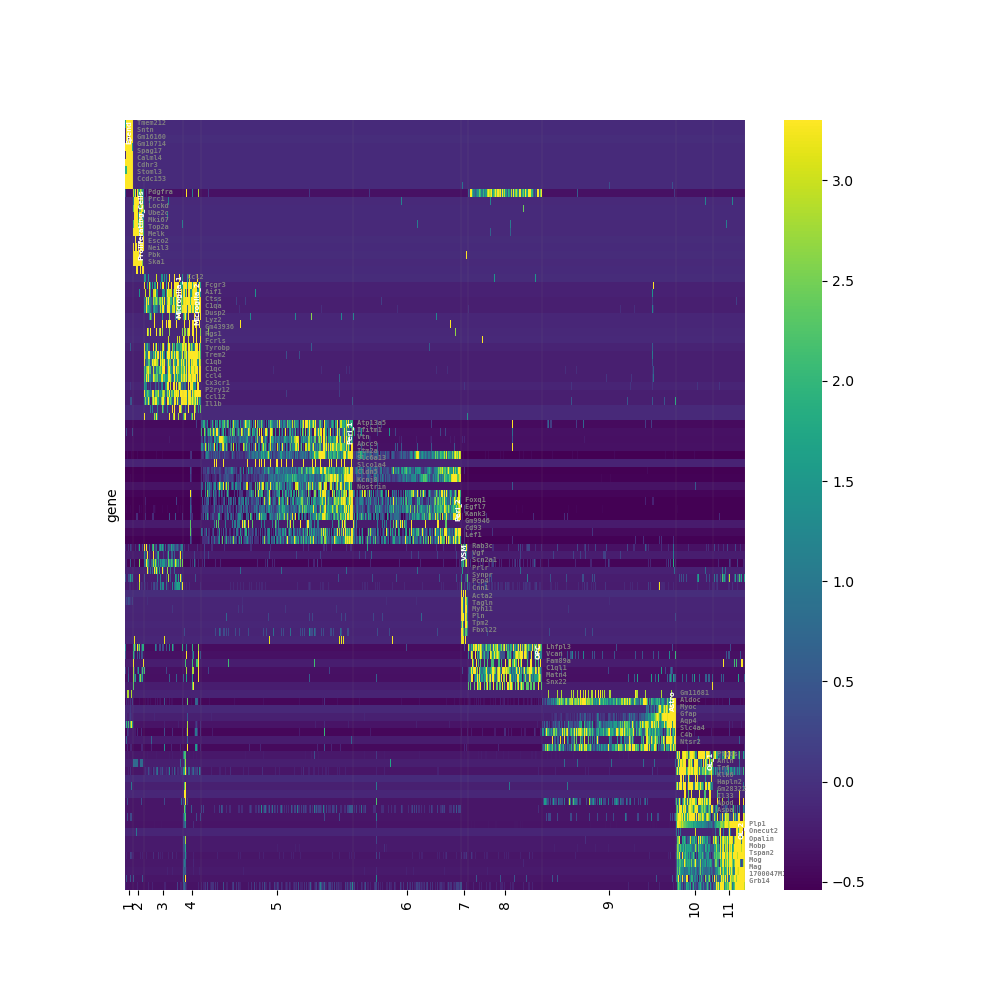

In [1434]:
dp.plot_marker_heatmap(NN_df_marker_log_and_std_col_filtered, 
                       pos_filtered_tmp, 
                       linkage_cluster_order_filtered, 
                       change_indices_filtered, 
                       tg_filtered, 
                       tgfs_filtered, 
                       linkage_alg,
                       dist_metric,
                       folder,
                       fs_waterfall = fs_w+1,
                       cluster_labels = NN_corr_labels,
                       savefig = True,
                       cell_class = 'NN_filtered_w_clabels')

In [1385]:
NN_arr.shape

(2838, 3)

In [1386]:
NN_labels.shape

(2838,)

In [1387]:
linkage_cluster_order_og

array([14,  6,  0,  3, 19, 18, 15, 20, 17, 16, 12,  5,  1,  2,  4, 13, 11,
       10,  7,  9,  8], dtype=int32)

In [1388]:
linkage_cluster_order

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21])

In [1389]:
linkage_cluster_order_filtered_tmp

dict_keys([1, 2, 3, 4, 6, 7, 8, 15, 16, 18, 19])

In [1395]:
NN_corr_labels

['Ependymal',
 'Fibroblast',
 'Microglia 1',
 'Microglia 2',
 'Pericyte 1',
 'Pericyte 2',
 'Smooth Muscle Cell 1',
 'Smooth Muscle Cell 2',
 'Smooth Muscle Cell 3',
 'Oligodendrocyte 1',
 'Oligodendrocyte 2']

In [1390]:
NN_arr_updated_filtered, NN_labels_updated_filtered = dp.update_tsne_params(NN_arr,NN_labels,linkage_cluster_order_og,linkage_cluster_order,linkage_cluster_order_filtered_tmp)

In [1399]:
NN_arr_updated_filtered.shape

(1976, 3)

In [1400]:
NN_meta_data_df_plis.shape

(29, 2838)

In [6]:
NN_cl_ct

{'1': 'Epend',
 '2': 'Proliferating_Cells',
 '3': 'Microglia_1',
 '4': 'Microglia_2',
 '5': 'Peri_1',
 '6': 'Peri_2',
 '7': 'VSM',
 '8': 'OPC',
 '9': 'Astro',
 '10': 'OL_1',
 '11': 'OL_2'}

In [1436]:
NN_corr_labels_formatted = [f"{key} {value}" for key, value in NN_cl_ct.items()]
NN_corr_labels_formatted

['1 Epend',
 '2 Proliferating_Cells',
 '3 Microglia_1',
 '4 Microglia_2',
 '5 Peri_1',
 '6 Peri_2',
 '7 VSM',
 '8 OPC',
 '9 Astro',
 '10 OL_1',
 '11 OL_2']

In [1398]:
folder

'/bigdata/isaac/Nonneuronal_files/'

arr sortted shape (1976, 3)
arr filtered shape (1976, 3)


<IPython.core.display.Javascript object>


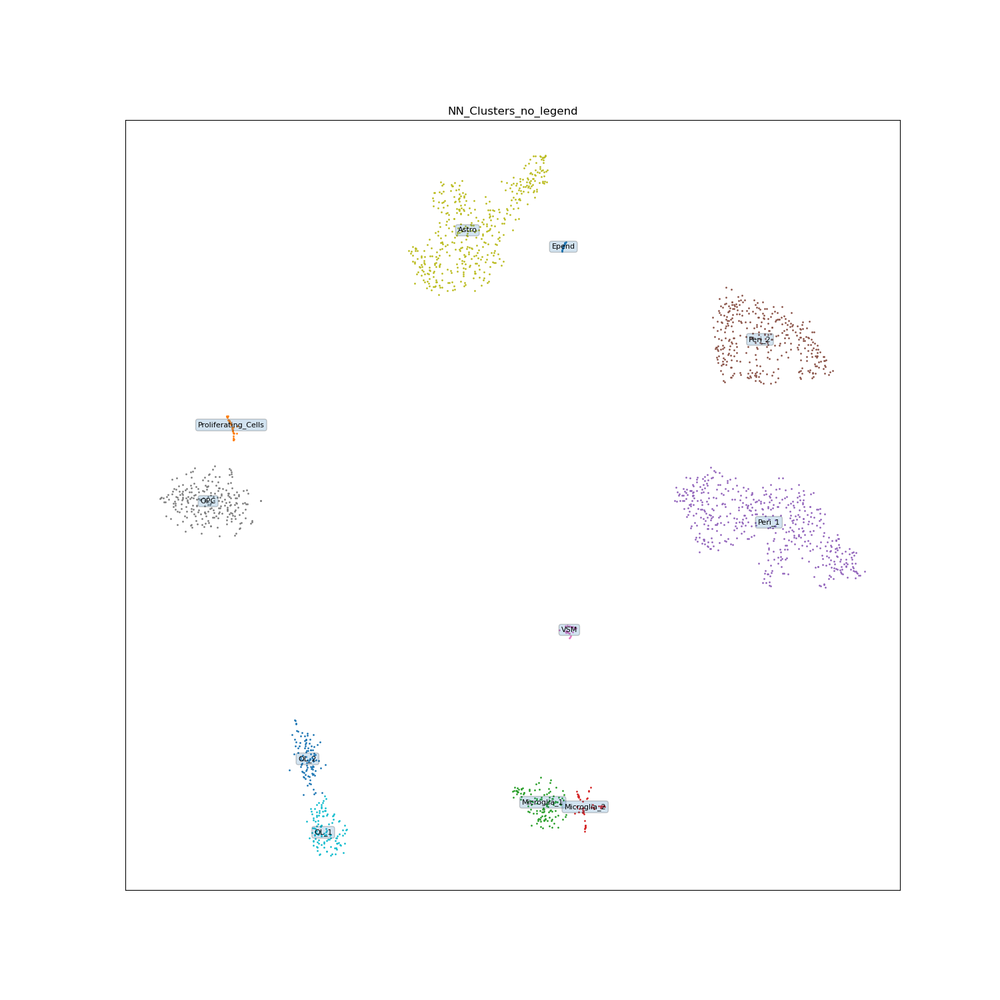

In [1437]:
dp.plot_filtered_tsne(NN_arr_updated_filtered,
                   NN_labels_updated_filtered,
                   NN_corr_labels_formatted,
                   NN_meta_data_df_plis,
                   clusters_to_drop,
                   folder,
                   'NN_Clusters_no_legend',
                   savefig=True)

In [1410]:
NN_arr_updated_filtered

,tsne-1,tsne-2,labels
0,0.716438,-34.828342,3
1,2.877986,-30.794262,3
3,1.401357,-34.617966,3
21,1.678550,-30.103413,3
22,1.305301,-30.241249,3
...,...,...,...
2973,5.521433,-12.798825,8
2977,4.931550,-12.769485,8
2982,5.958879,-12.871107,8
2984,-32.309471,1.080443,15


In [1415]:
NN_df.reindex(columns = NN_meta_data_df_plis_filtered.columns)

,GTGTGGCAGCCACTCG-1_10X37_1,GTAATGCCACATGAAA-1_10X52_2,CGTGCTTGTCTGTCAA-1_10X37_2,ACCACAAGTATCGGTT-1_10X35_2,TCTGTCGGTCACCACG-1_10X35_1,TGCTCCAGTAACAGGC-1_10X37_2,AAGTCGTTCGCCTATC-1_10X38_1,CTTGAGAGTTATTCTC-1_10X35_2,TCGAACATCGGTTAGT-1_10X51_4,ATGACCAAGAAGCGGG-1_10X52_1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,0,0,0,0,0,0,0,0,0,...,2,1,2,0,3,3,1,0,3,2
0610009B22Rik,0,0,0,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,2
0610009L18Rik,1,0,0,0,0,0,1,3,2,0,...,0,0,0,0,0,0,0,0,1,1
0610009O20Rik,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
0610010F05Rik,1,1,1,1,3,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd3,2,15,14,7,19,25,10,6,16,35,...,16,12,33,26,16,32,16,24,22,39
mt-Nd4,59,90,224,121,166,276,168,83,114,181,...,230,71,147,148,75,106,59,95,87,126
mt-Nd4l,8,4,14,6,5,27,7,5,8,12,...,8,6,9,4,6,14,5,5,4,6


In [1444]:
Vglut1_arr

,tsne-1,tsne-2,labels
0,-7.153334,-31.079487,18
1,21.375233,0.739890,0
3,3.672850,4.754132,1
4,2.553538,15.514075,1
5,5.267682,4.808152,1
...,...,...,...
11282,22.411118,-0.661805,0
11283,-18.571152,-27.755581,6
11284,22.445200,-27.792263,15
11285,22.420523,-27.785286,15


In [1439]:
NN_labels_updated_filtered

array([ 3,  3,  3, ...,  8, 15,  8])

<IPython.core.display.Javascript object>


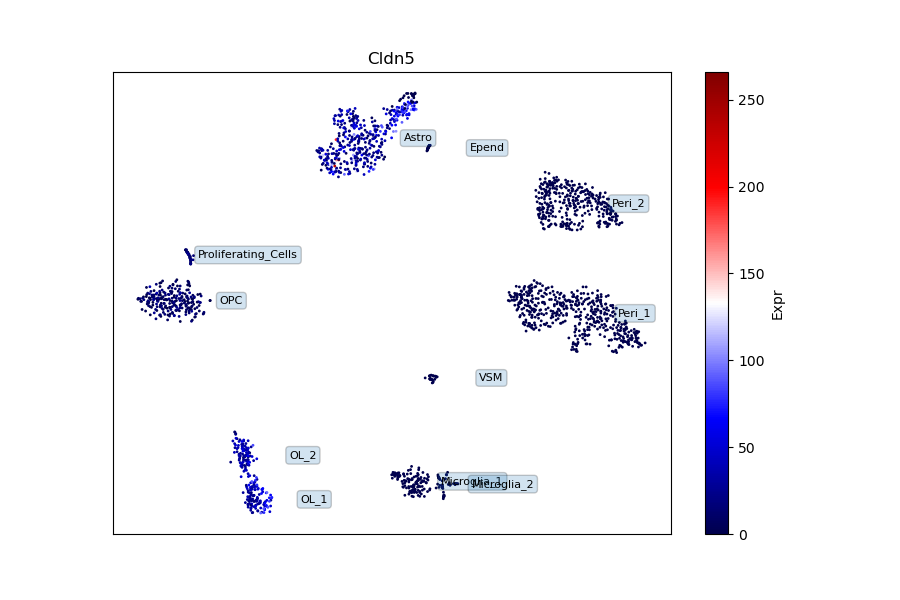

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '14.662241458892822' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut1_marker,:])
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '12.146183252334595' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut1_marker,:])
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '17.31699228286743' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut

In [1488]:
dp.plot_marker_on_tsne(NN_arr_updated_filtered,
                       NN_df.reindex(columns = NN_meta_data_df_plis_filtered.columns), 
                       'Cldn5', 
                       NN_labels_updated_filtered,
                       NN_corr_labels_formatted,
                       offset=10,
                       nn=True)

<IPython.core.display.Javascript object>


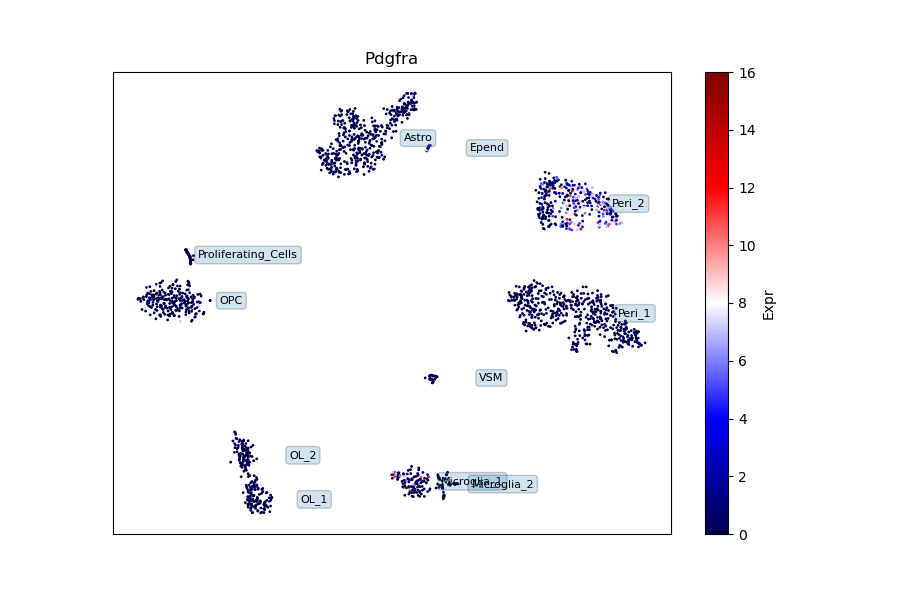

/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '14.662241458892822' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut1_marker,:])
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '12.146183252334595' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut1_marker,:])
/home/isaac/analysis/scRNA-seq/dimorph_processing.py:1261: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '17.31699228286743' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  z_vglut1 = np.array(expr_df.loc[Vglut

In [1487]:
dp.plot_marker_on_tsne(NN_arr_updated_filtered,
                       NN_df.reindex(columns = NN_meta_data_df_plis_filtered.columns), 
                       'Pdgfra', 
                       NN_labels_updated_filtered,
                       NN_corr_labels_formatted,
                       offset=10,
                       nn=True)

In [1424]:
peri

['Pdgfrb', 'Rgs5', 'Acta2', 'Anpep', 'Mcam', 'Cspg4', 'Des', 'Vtn', 'Abcc9']

In [1425]:
endo

['Cldn5', 'Pecam1', 'Flt1', 'Vwf', 'Cdh5', 'Tie1', 'Icam2', 'Nos3', 'Cd34']

In [1474]:
arr_xy = NN_arr.drop('labels', axis = 'columns')
arr_xy

,tsne-1,tsne-2
0,0.716438,-34.828342
1,2.877986,-30.794262
3,1.401357,-34.617966
5,-7.616574,-10.031107
6,-6.851101,-8.841695
...,...,...
2991,19.179541,-15.570499
2992,19.038500,-15.758529
2993,19.158272,-15.587698
2994,19.306400,-15.533219


In [1478]:
tmp = arr_xy.iloc[0,:]
tmp

tsne-1     0.716438
tsne-2   -34.828342
Name: 0, dtype: float32

In [1483]:
tmp.iloc[0]+=5

/tmp/ipykernel_1599888/3281100531.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '5.716437637805939' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  tmp.iloc[0]+=5


In [1484]:
tmp

tsne-1     5.716438
tsne-2   -34.828342
Name: 0, dtype: float64

In [5]:
nn_folder = '/bigdata/isaac/Nonneuronal_files/'
#load in all filtered metadata with subclass labels
with open(nn_folder + 'NNmeta_data_df_plis_filtered_2024-09-02.json') as json_data:
    NNmeta_data_df_plis_filtered = json.load(json_data)
NNmeta_data_df_plis_filtered = pd.DataFrame.from_dict(NNmeta_data_df_plis_filtered, orient='columns')

In [20]:
nn_meta_data_df_plis_filtered_markers = dp.update_metadata_w_markers(nn_folder, 
                                                                         NNmeta_data_df_plis_filtered,
                                                                         'NN_cl_ct2024-09-09.json',
                                                                         'NN',
                                                                        write_to_file = True)

In [19]:
NNmeta_data_df_plis_filtered

,GTGTGGCAGCCACTCG-1_10X37_1,GTAATGCCACATGAAA-1_10X52_2,CGTGCTTGTCTGTCAA-1_10X37_2,ACCACAAGTATCGGTT-1_10X35_2,TCTGTCGGTCACCACG-1_10X35_1,TGCTCCAGTAACAGGC-1_10X37_2,AAGTCGTTCGCCTATC-1_10X38_1,CTTGAGAGTTATTCTC-1_10X35_2,TCGAACATCGGTTAGT-1_10X51_4,ATGACCAAGAAGCGGG-1_10X52_1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,67.0,102.0,68.0,64.0,63.0,68.0,69.0,64.0,100.0,101.0,...,66.0,63.0,67.0,65.0,66.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,2019-11-25,05/31/20,2019-11-25,2019-11-20,2019-11-20,2019-11-25,2019-12-01,2019-11-20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,2019-11-25,2019-11-24,2019-11-24,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,,,,C57Bl/6,C57Bl/6,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Breeder-F,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Naïve-F,Naïve-F,Breeder-M,Breeder-F,...,Naïve-M,Naïve-F,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X37,10X52,10X37,10X35,10X35,10X37,10X38,10X35,10X51,10X52,...,10X36,10X35,10X37,10X36,10X36,10X37,10X35,10X37,10X35,10X37
SampleID,10X37_1,10X52_2,10X37_2,10X35_2,10X35_1,10X37_2,10X38_1,10X35_2,10X51_4,10X52_1,...,10X36_2,10X35_1,10X37_1,10X36_1,10X36_2,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,"DI4,DI5",DI-B3-F,"DI4,DI5","DI1,DI2","DI1,DI2","DI4,DI5",DI6,"DI1,DI2",DI-B1-M,DI-B3-F,...,DI3,"DI1,DI2","DI4,DI5",DI3,DI3,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [21]:
nn_meta_data_df_plis_filtered_markers

,GTGTGGCAGCCACTCG-1_10X37_1,GTAATGCCACATGAAA-1_10X52_2,CGTGCTTGTCTGTCAA-1_10X37_2,ACCACAAGTATCGGTT-1_10X35_2,TCTGTCGGTCACCACG-1_10X35_1,TGCTCCAGTAACAGGC-1_10X37_2,AAGTCGTTCGCCTATC-1_10X38_1,CTTGAGAGTTATTCTC-1_10X35_2,TCGAACATCGGTTAGT-1_10X51_4,ATGACCAAGAAGCGGG-1_10X52_1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,67.0,102.0,68.0,64.0,63.0,68.0,69.0,64.0,100.0,101.0,...,66.0,63.0,67.0,65.0,66.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,2019-11-25,05/31/20,2019-11-25,2019-11-20,2019-11-20,2019-11-25,2019-12-01,2019-11-20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,2019-11-25,2019-11-24,2019-11-24,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,,,,C57Bl/6,C57Bl/6,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Breeder-F,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Naïve-F,Naïve-F,Breeder-M,Breeder-F,...,Naïve-M,Naïve-F,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X37,10X52,10X37,10X35,10X35,10X37,10X38,10X35,10X51,10X52,...,10X36,10X35,10X37,10X36,10X36,10X37,10X35,10X37,10X35,10X37
SampleID,10X37_1,10X52_2,10X37_2,10X35_2,10X35_1,10X37_2,10X38_1,10X35_2,10X51_4,10X52_1,...,10X36_2,10X35_1,10X37_1,10X36_1,10X36_2,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,"DI4,DI5",DI-B3-F,"DI4,DI5","DI1,DI2","DI1,DI2","DI4,DI5",DI6,"DI1,DI2",DI-B1-M,DI-B3-F,...,DI3,"DI1,DI2","DI4,DI5",DI3,DI3,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [22]:
np.unique(nn_meta_data_df_plis_filtered_markers.loc['markers'])

array(['Astro', 'Epend', 'Microglia_1', 'Microglia_2', 'OL_1', 'OL_2',
       'OPC', 'Peri_1', 'Peri_2', 'Proliferating_Cells', 'VSM'],
      dtype=object)

In [ ]:
######### OLD###################